In [4]:
import os
import sys
sys.path.append("../")

import math
import random
from scipy import special
import numpy as np
import torch
# import tensorflow as tf
import matplotlib.pyplot as plt
import time
import logging
from pynverse import inversefunc
from utilities.compare_performance import compare_performance
import scipy.io
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
from functools import partial

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
import numpy as np
from sympy import *
import sympy as sp
#import scipy.integrate as integrate
import scipy.special as special
from scipy.integrate import quad

mu = 0.05
dim = 1 

def v0(x):
    return x**2*(3-2*x)

def vv0(x):
    z = sp.Symbol("z")
    return integrate(u0(z), (z, 0, x))

def w(x,mu):
    return exp(-v0(x)/3/mu)

c=[quad(w,0,1,args=(mu))[0]]

def w0(x,k,mu):
    return exp(-v0(x)/3/mu)*cos(k*np.pi*x)

nb_sums=14;    

for k in range(1,nb_sums):
    c.append(2*quad(w0,0,1,args=(k,mu))[0])
    
def exact_example(t, x, T):
    xi = (1+sum(x))/2
    if t==T: 
        return 4*xi*(1-xi)
    else:
        sum1 = 0  
        for n in range(1,nb_sums):
            sum1 += c[n]*n*np.exp(-n**2*np.pi**2*mu*dim*(T-t))*np.sin(n*np.pi*xi)
        sum2 = 0
        for n in range(1,nb_sums):
            sum2 += c[n]*np.exp(-n**2*np.pi**2*mu*dim*(T-t))*np.cos(n*np.pi*xi)
        return 2*np.pi*mu*sum1/(c[0]+sum2)


In [6]:
exact_example(0, [0.3], 0.05)

0.9366076633178516

In [7]:
nu=mu*4

def f_example(y, coordinate=0):
    """
    idx 0 -> no deriv
    idx 1 -> first deriv
    """
    return -2*y[0]*y[1:(dim+1)].sum(dim=0) 
  
def dgm_f_example(y, coordinate=0):
    """
    idx 0 -> no deriv
    idx 1 -> first deriv
    idx 2 -> second deriv
    """
    return -2*y[0]*y[1:(dim+1)].sum(dim=0) + nu*y[(dim+1):(2*dim+1)].sum(dim=0)

def phi_example(x, coordinate=0):
    return 4*(1+x.sum(axis=0))/2*(1-(1+x.sum(axis=0))/2)

# def exact_example(t, x, T):
#    xi = T-t + x.sum(axis=0)
#    return np.sin(np.pi*(1+xi)/2)

def boundary_fun(x, coordinate=0):
    return torch.tensor(np.zeros(x.size()[1]), device=device).to(torch.float32)

t_lo, x_lo, x_hi = 0., -1, 1
    
x_mid = (x_lo + x_hi) / 2
grid = np.linspace(x_lo, x_hi, 100)

In [8]:
# Conditional probability to survive
# Set boundary of DB and BSDE methods
def conditional_probability_to_survive(
    t,
    x,
    y,
    k_arr=range(-5, 5),
    lower_bound=-1,
    upper_bound=1,
):
    # in case lower_bound & upper_bound are not tensor
    if not torch.is_tensor(lower_bound):
        lower_bound = torch.tensor(lower_bound, device=device)
    if not torch.is_tensor(upper_bound):
        upper_bound = torch.tensor(upper_bound, device=device)

    # transpose (t, x, y)
    # so that the operation with lower_bound, upper_bound is correct
    t = t.unsqueeze(dim=0).transpose(0, -1)
    x, y = x.transpose(0, -1), y.transpose(0, -1)

    # calculate the probability using the formula by Borodin
    ans = 0
    for k in k_arr:
        ans += (
            torch.exp(
                ((y - x) ** 2 - (y - x + 2*k*(upper_bound-lower_bound)) ** 2) 
                / (2 * t)
            )
            - torch.exp(
                ((y - x) ** 2 - (y + x - 2*lower_bound + 2*k*(upper_bound-lower_bound)) ** 2) 
                / (2 * t)
            )
        )
    # print(ans.transpose(0, -1).prod(dim=0))
    return ans.transpose(0, -1).prod(dim=0)

def is_x_inside(x, lower_bound=x_lo, upper_bound=x_hi):
    # in case lower_bound & upper_bound are not tensor
    if not torch.is_tensor(lower_bound):
        lower_bound = torch.tensor(lower_bound, device=device)
    if not torch.is_tensor(upper_bound):
        upper_bound = torch.tensor(upper_bound, device=device)

    # transpose x so that the operation with lower_bound, upper_bound is correct
    x = x.transpose(0, -1)

    return (
        torch.logical_and(lower_bound <= x, x <= upper_bound)
        .transpose(0, -1).all(dim=0)
    )

## dim = 1

Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


#### Starting deep branching method with seed 0 - 1 out of 1 times


Patch 0: generation of u samples take 1.9853167533874512 seconds.
Patch  0: epoch    0 with loss 1.35E+00


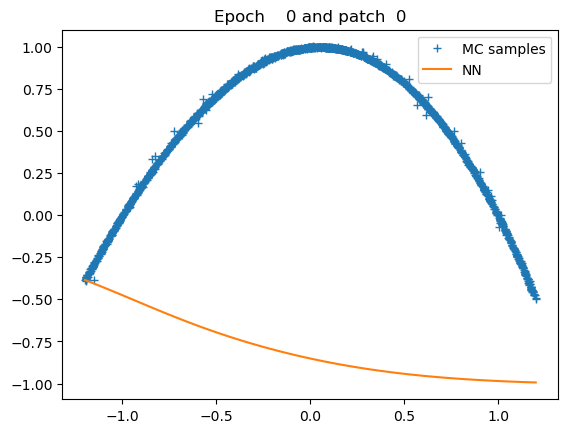

Patch  0: epoch  500 with loss 5.76E-05


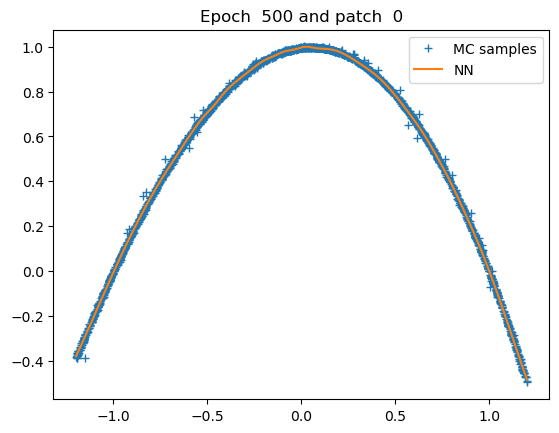

Patch  0: epoch 1000 with loss 5.53E-05


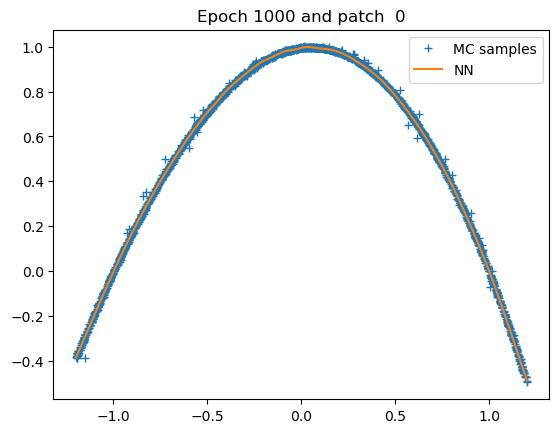

Patch  0: epoch 1500 with loss 5.52E-05


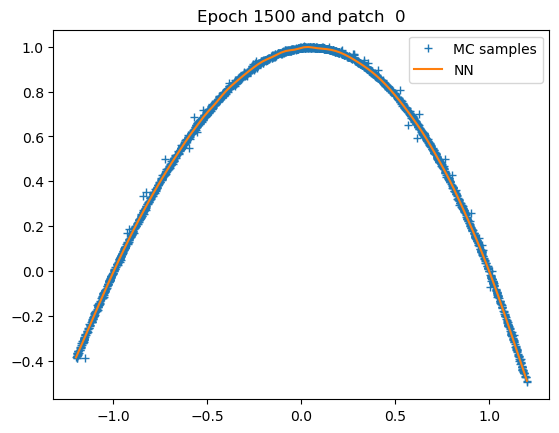

Patch  0: epoch 1999 with loss 5.51E-05


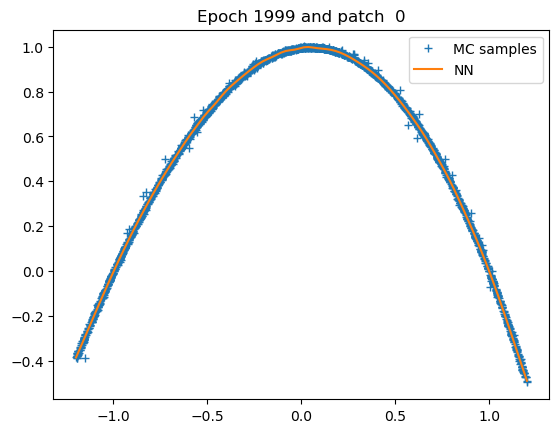

Patch 0: training of u with 2000 epochs take 15.261537075042725 seconds.
Patch 1: generation of u samples take 4.72243595123291 seconds.
Patch  1: epoch    0 with loss 2.11E+00


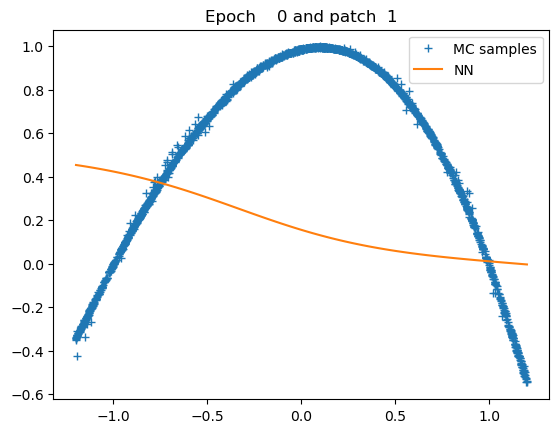

Patch  1: epoch  500 with loss 8.15E-05


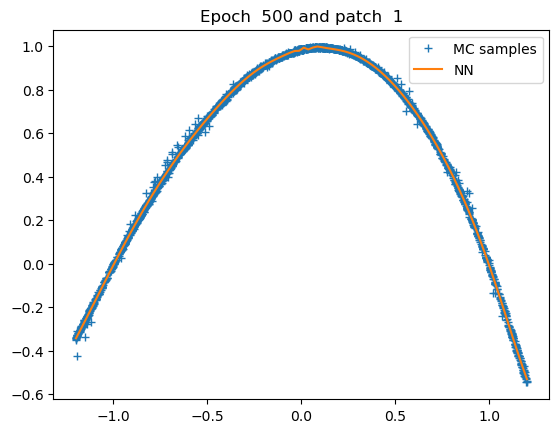

Patch  1: epoch 1000 with loss 7.97E-05


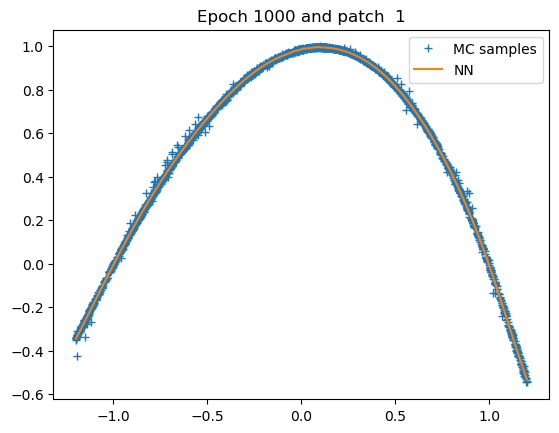

Patch  1: epoch 1500 with loss 7.97E-05


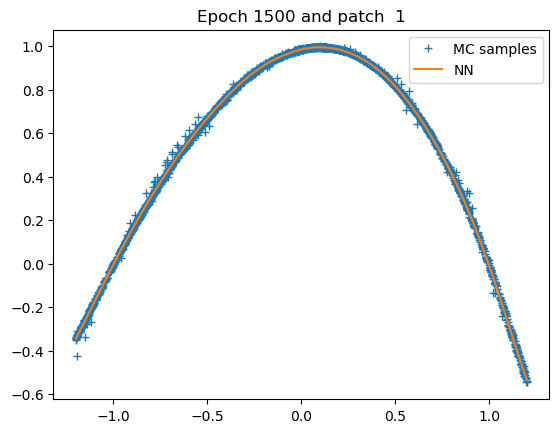

Patch  1: epoch 1999 with loss 7.96E-05


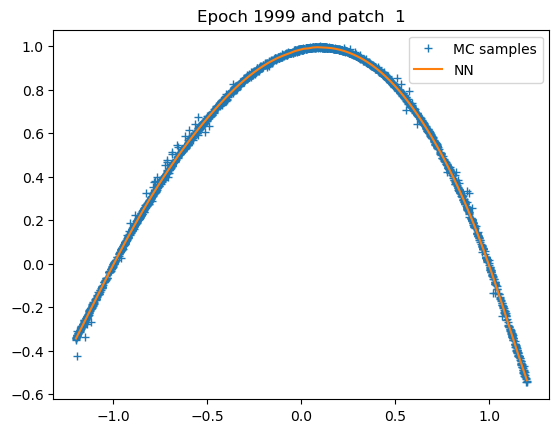

Patch 1: training of u with 2000 epochs take 16.24971866607666 seconds.
Patch 2: generation of u samples take 4.909922122955322 seconds.
Patch  2: epoch    0 with loss 1.61E+00


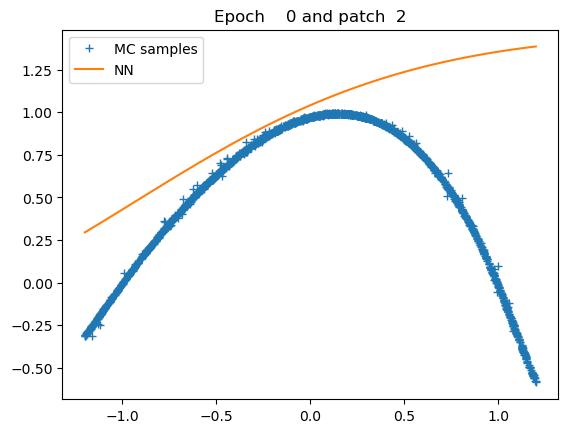

Patch  2: epoch  500 with loss 6.21E-05


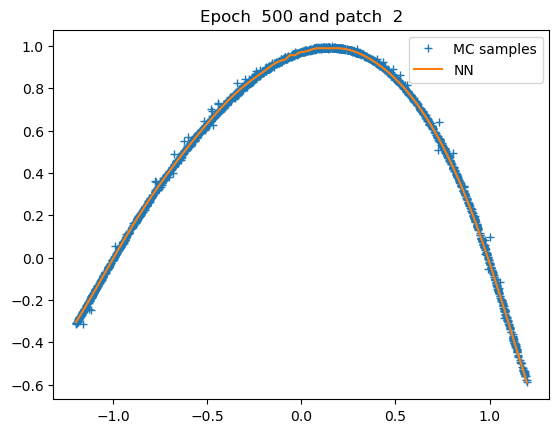

Patch  2: epoch 1000 with loss 7.10E-05


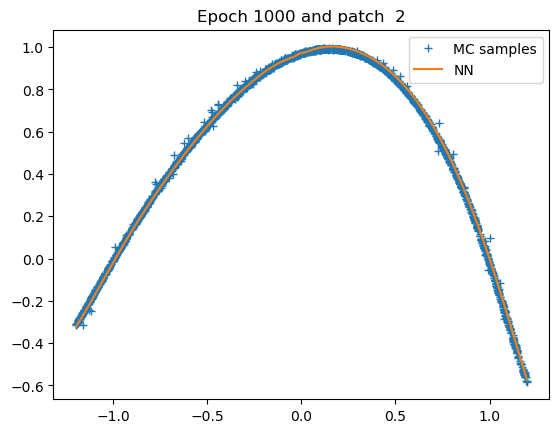

Patch  2: epoch 1500 with loss 6.01E-05


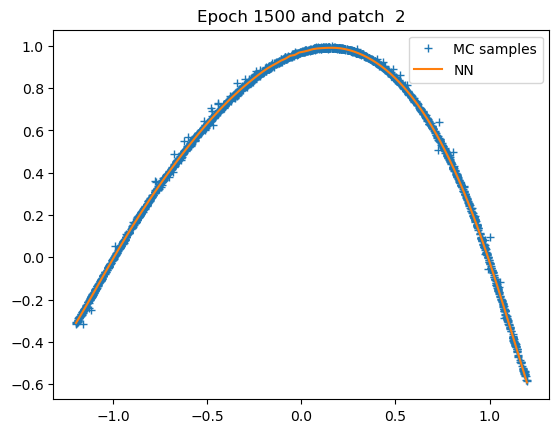

Patch  2: epoch 1999 with loss 5.96E-05


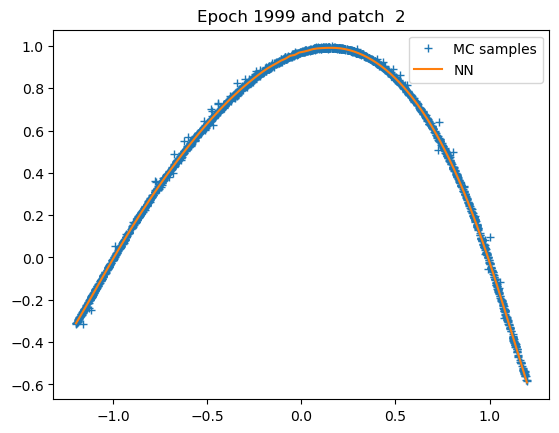

Patch 2: training of u with 2000 epochs take 15.872272968292236 seconds.
Patch 3: generation of u samples take 3.5741612911224365 seconds.
Patch  3: epoch    0 with loss 3.82E+00


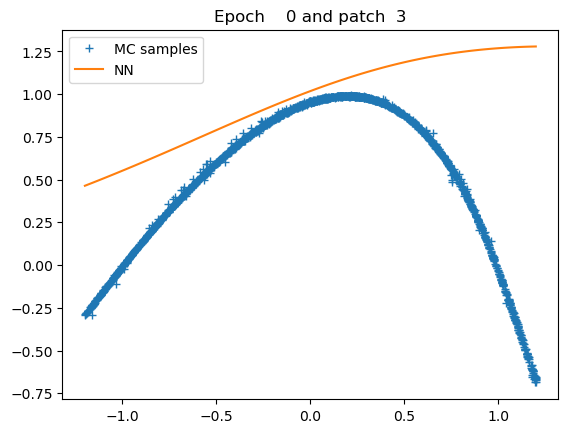

Patch  3: epoch  500 with loss 6.45E-05


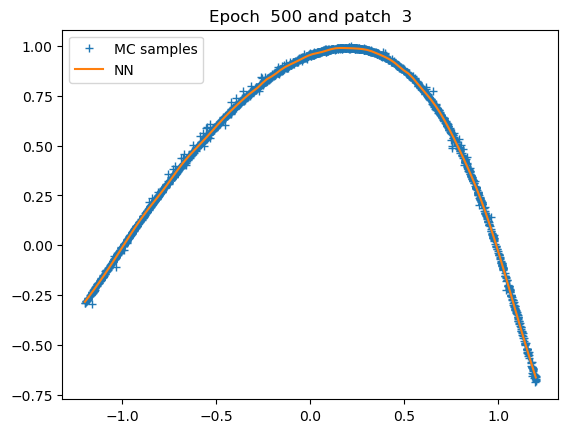

Patch  3: epoch 1000 with loss 5.87E-05


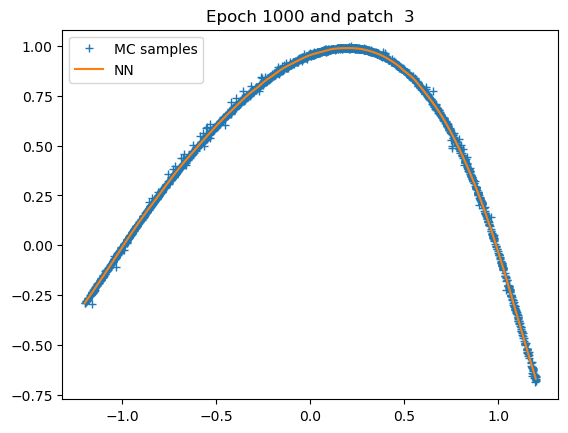

Patch  3: epoch 1500 with loss 5.85E-05


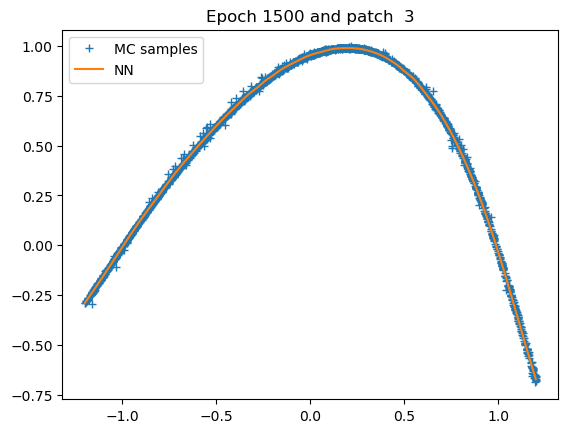

Patch  3: epoch 1999 with loss 5.83E-05


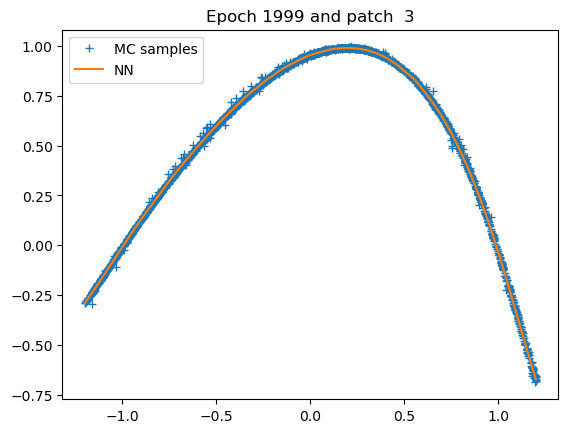

Patch 3: training of u with 2000 epochs take 16.56751298904419 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 79 seconds; L1 error: 1.97E-02; L2 error: 4.80E-04; rel error: INF.
fdb runtime: 0 seconds; total runtime: 79 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


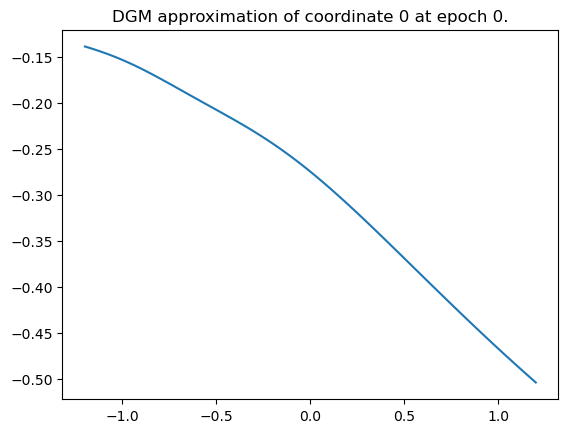

Epoch 0 with loss 1.5955731868743896


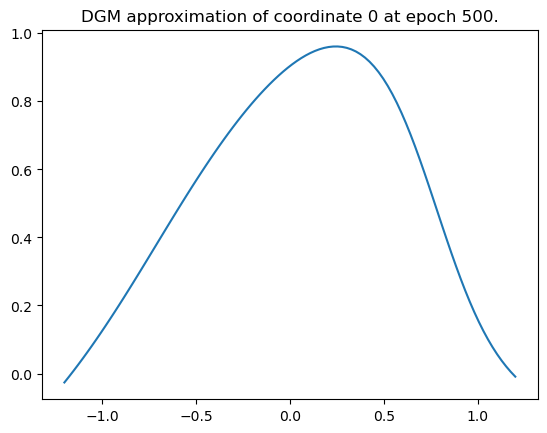

Epoch 500 with loss 0.014507755637168884


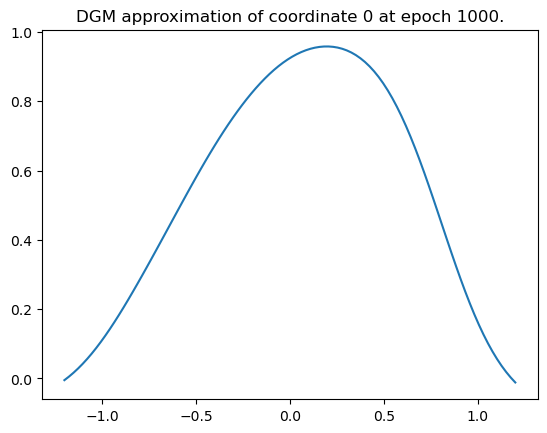

Epoch 1000 with loss 0.011087187565863132


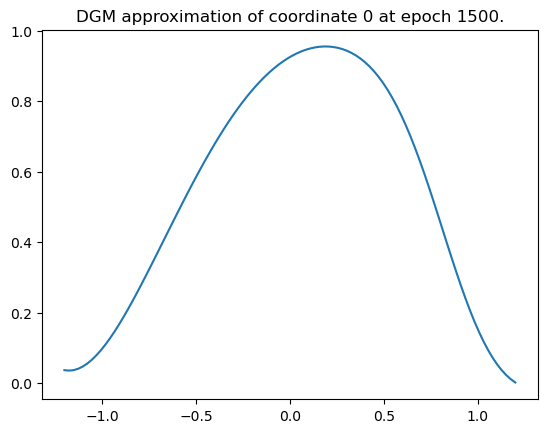

Epoch 1500 with loss 0.009501853957772255


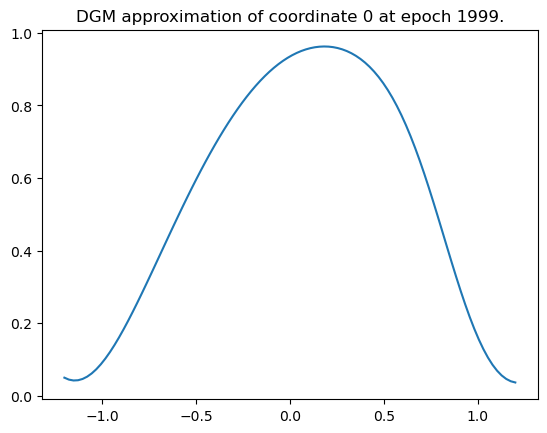

Epoch 1999 with loss 0.00903348159044981
Training of neural network with 2000 epochs take 76.67711019515991 seconds.


Time taken: 77 seconds; L1 error: 2.17E-02; L2 error: 1.29E-03; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


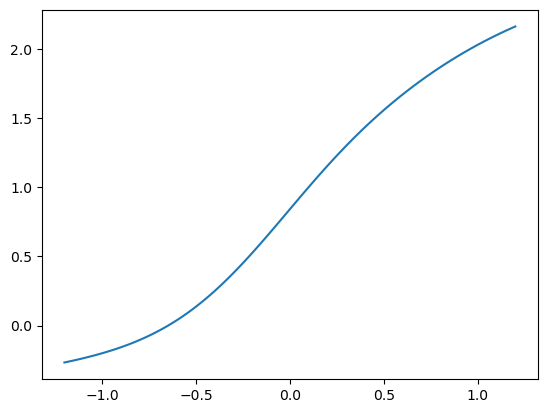

Epoch 0 with loss 1.1392133235931396


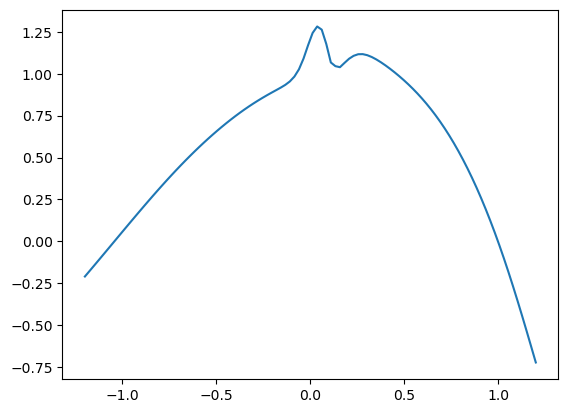

Epoch 500 with loss 0.0018827456515282393


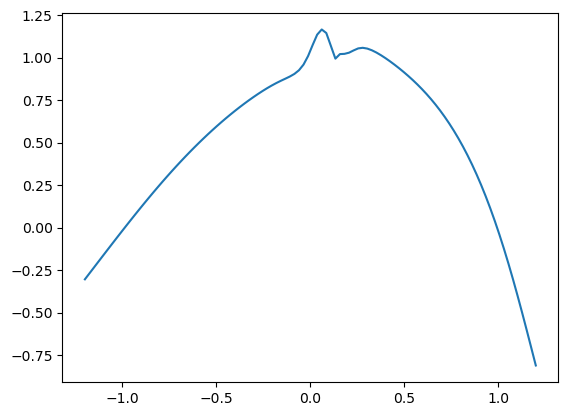

Epoch 1000 with loss 0.0004512517189141363


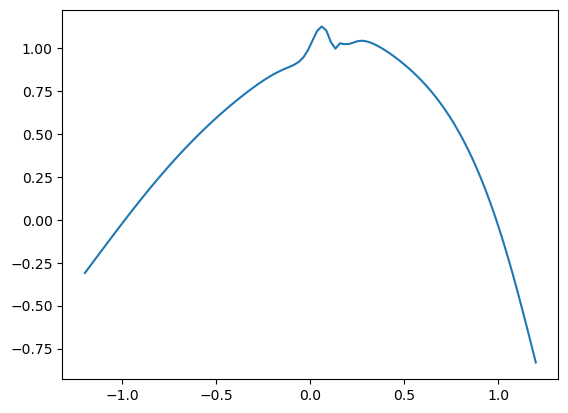

Epoch 1500 with loss 0.0006839587003923953


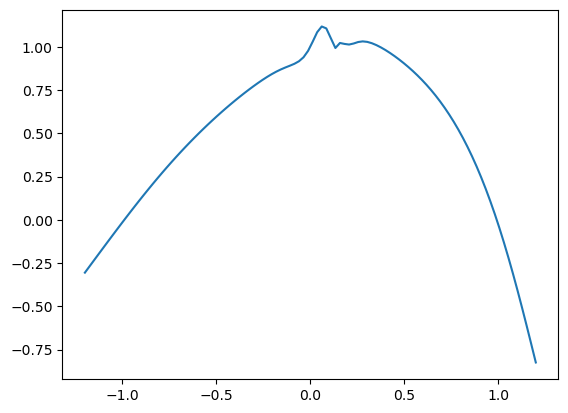

Epoch 1999 with loss 0.0012659323401749134
Training of neural network with 2000 epochs take 97.85788011550903 seconds.
Time taken: 98 seconds; L1 error: 3.77E-02; L2 error: 2.70E-03; rel error: INF.




######## Summary for deep branching method
runtime:        79
fdb runtime:    0
total runtime:  79
mean L1 error:  1.97E-02
std L1 error:   0.00E+00
mean L2 error:  4.80E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        77
mean L1 error:  2.17E-02
std L1 error:   0.00E+00
mean L2 error:  1.29E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        98
mean L1 error:  3.77E-02
std L1 error:   0.00E+00
mean L2 error:  2.70E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


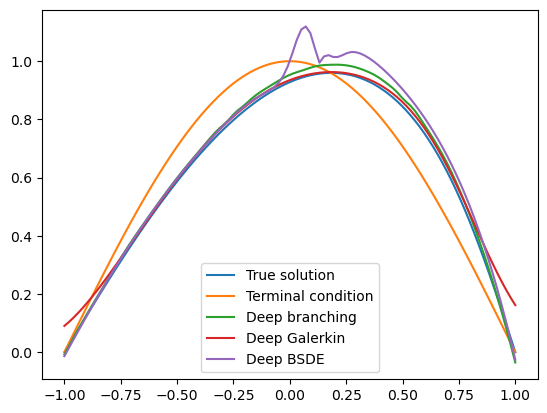

In [11]:
dim = 1
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True,                     
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=2000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=4, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 2

Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


#### Starting deep branching method with seed 0 - 1 out of 1 times


Patch 0: generation of u samples take 46.88844013214111 seconds.
Patch  0: epoch    0 with loss 8.04E-01


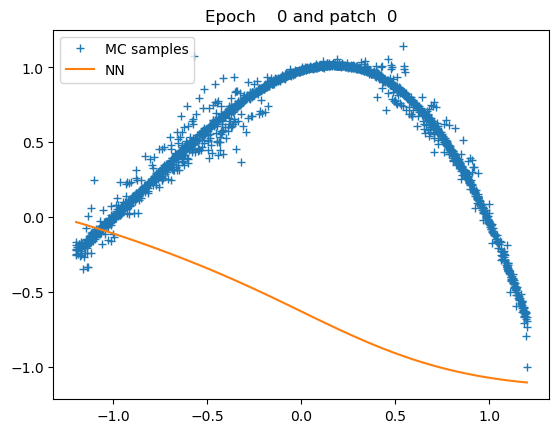

Patch  0: epoch  500 with loss 2.87E-03


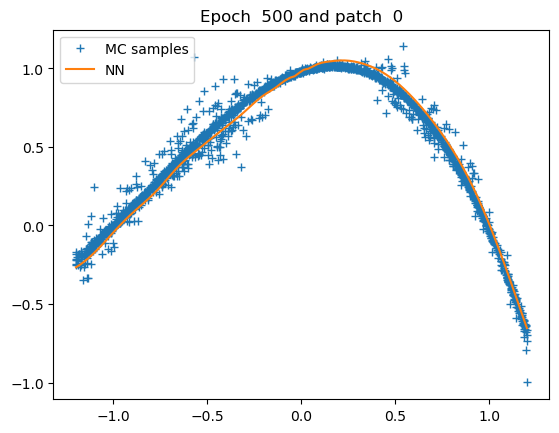

Patch  0: epoch 1000 with loss 2.40E-03


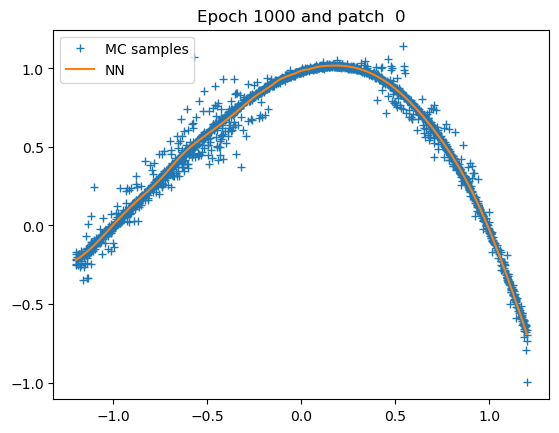

Patch  0: epoch 1500 with loss 2.40E-03


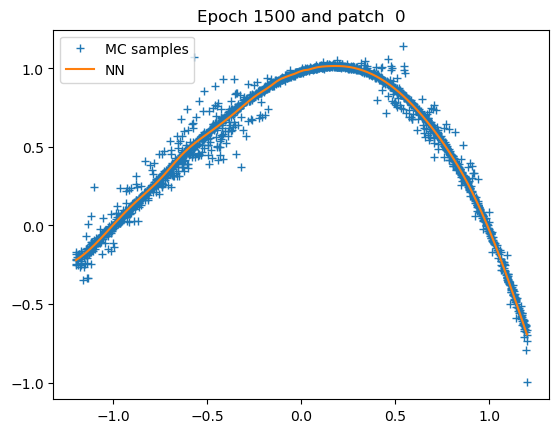

Patch  0: epoch 2000 with loss 2.40E-03


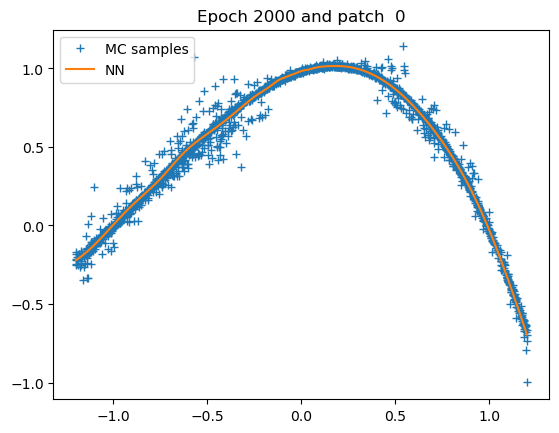

Patch  0: epoch 2500 with loss 2.40E-03


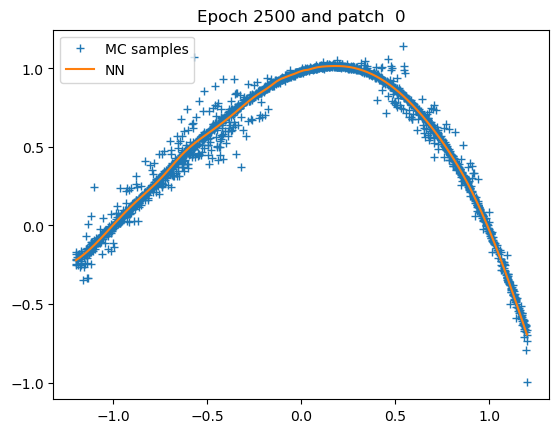

Patch  0: epoch 3000 with loss 2.40E-03


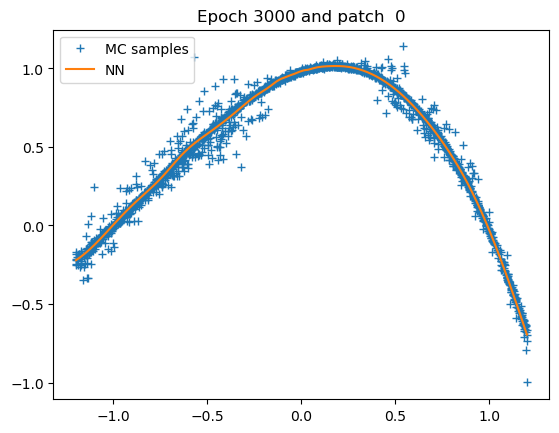

Patch  0: epoch 3500 with loss 2.40E-03


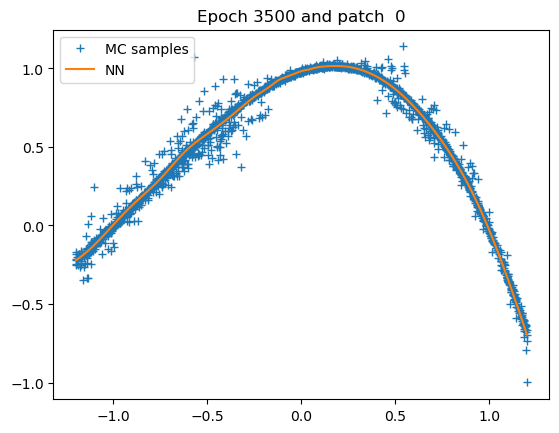

Patch  0: epoch 4000 with loss 2.40E-03


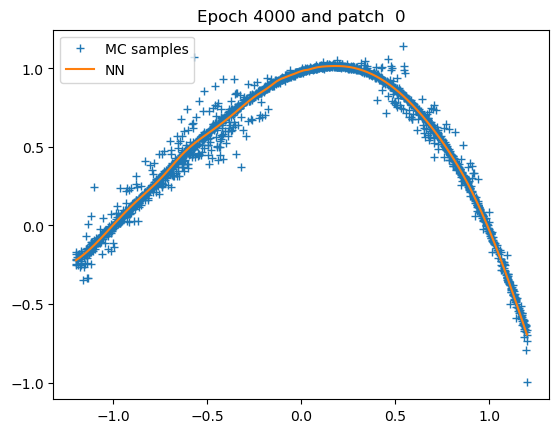

Patch  0: epoch 4500 with loss 2.40E-03


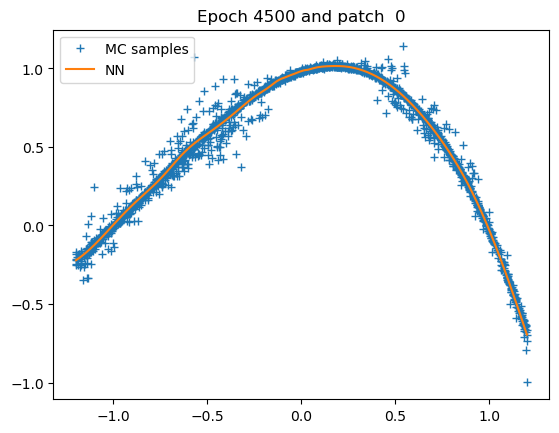

Patch  0: epoch 4999 with loss 2.40E-03


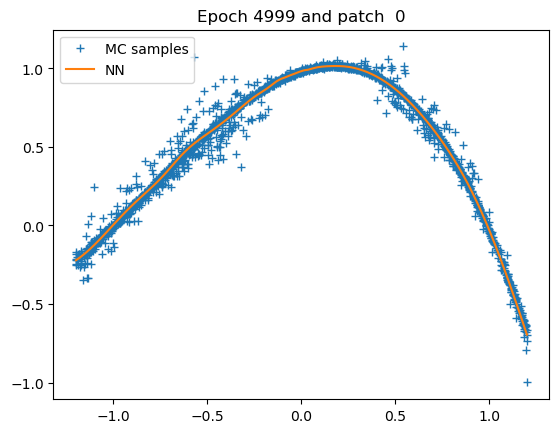

Patch 0: training of u with 5000 epochs take 37.81990623474121 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 84 seconds; L1 error: 2.17E-02; L2 error: 8.93E-04; rel error: INF.
fdb runtime: 0 seconds; total runtime: 85 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


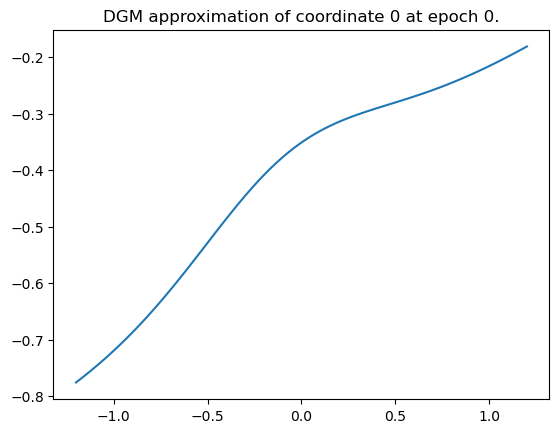

Epoch 0 with loss 4.1419596672058105


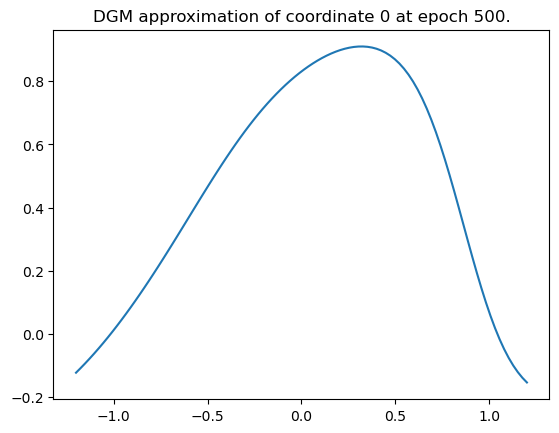

Epoch 500 with loss 0.7309550046920776


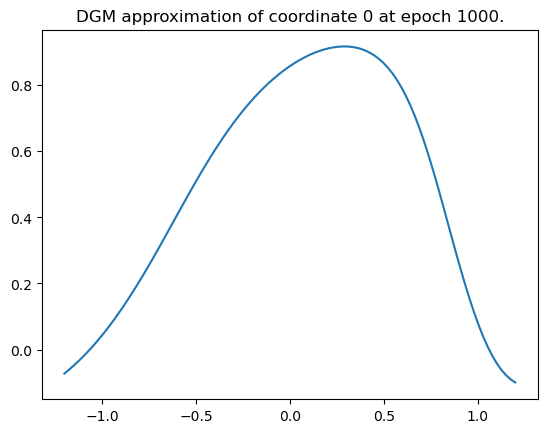

Epoch 1000 with loss 0.6170228719711304


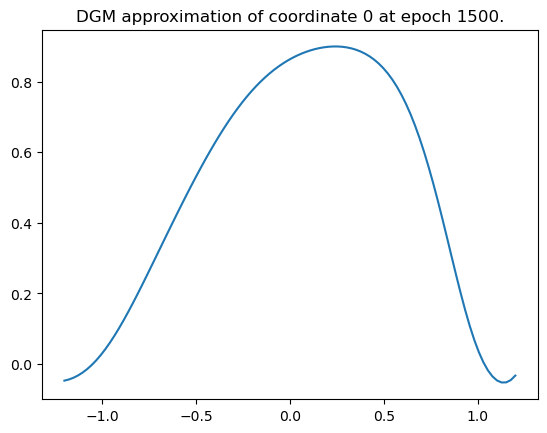

Epoch 1500 with loss 0.5305825471878052


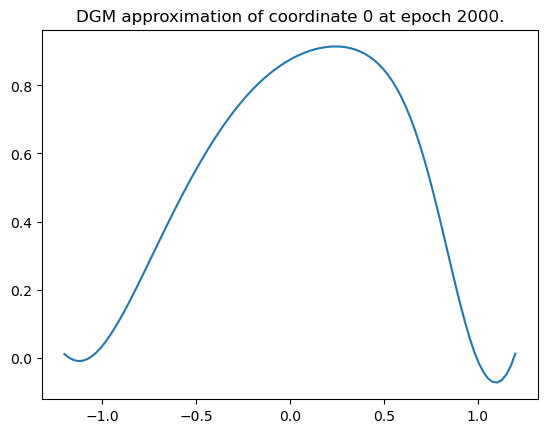

Epoch 2000 with loss 0.4091288447380066


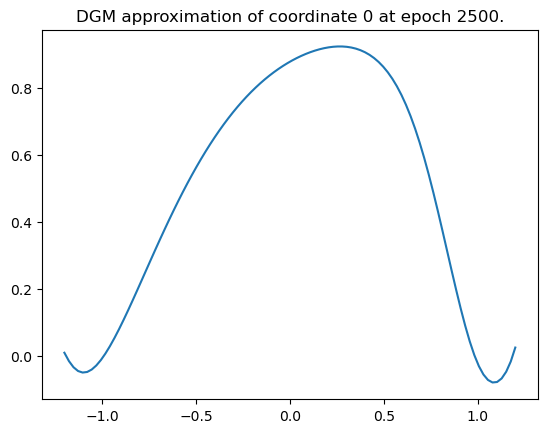

Epoch 2500 with loss 0.3605402410030365


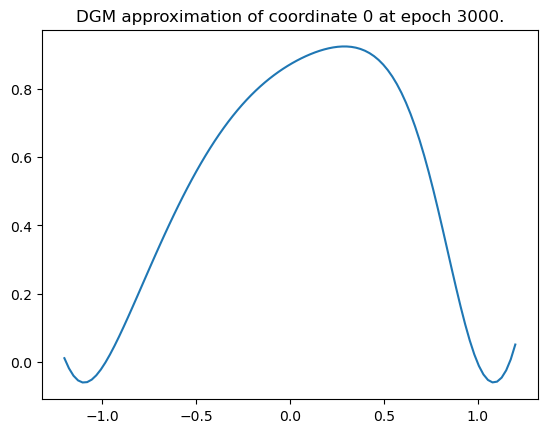

Epoch 3000 with loss 0.30137890577316284


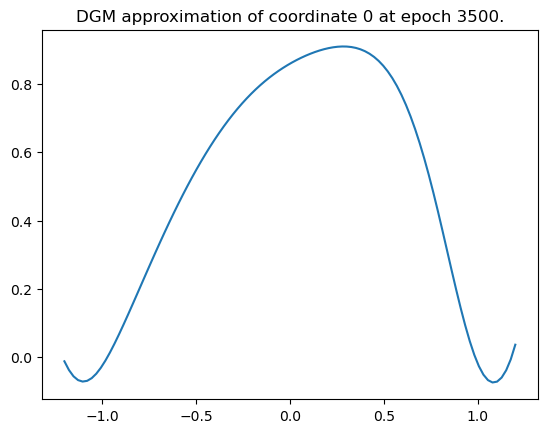

Epoch 3500 with loss 0.2720911502838135


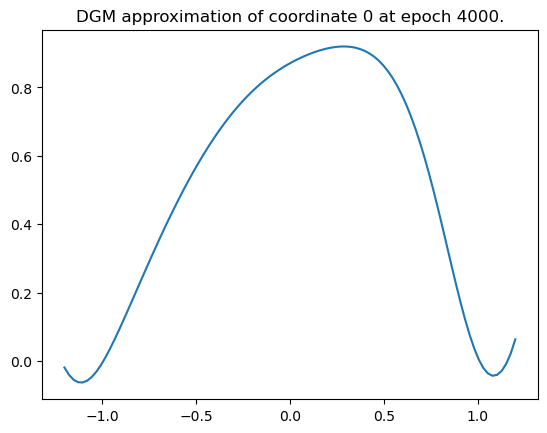

Epoch 4000 with loss 0.27009114623069763


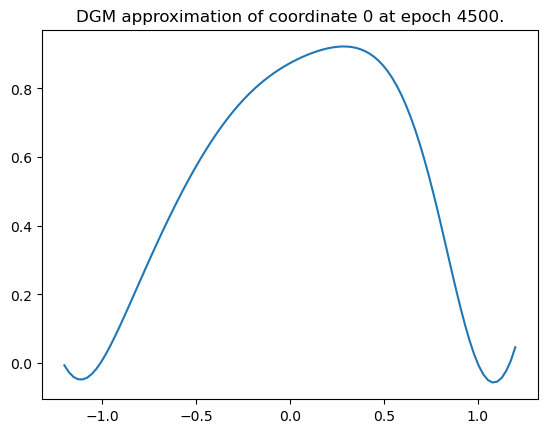

Epoch 4500 with loss 0.25584495067596436


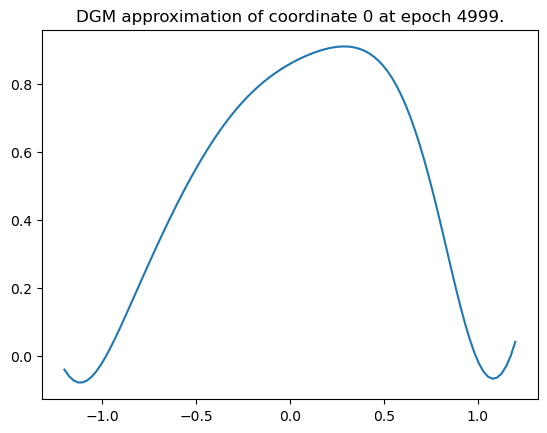

Epoch 4999 with loss 0.22614282369613647
Training of neural network with 5000 epochs take 261.9992232322693 seconds.


Time taken: 262 seconds; L1 error: 4.06E-02; L2 error: 2.05E-03; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


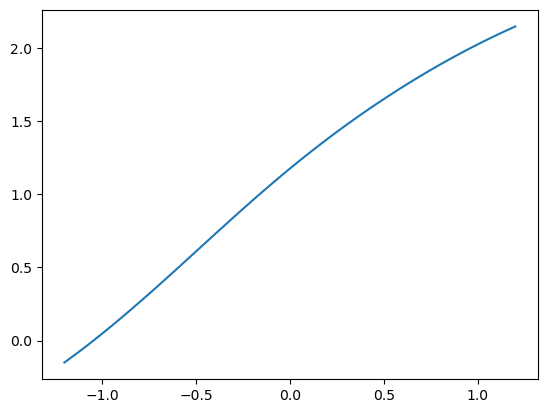

Epoch 0 with loss 1.7788124084472656


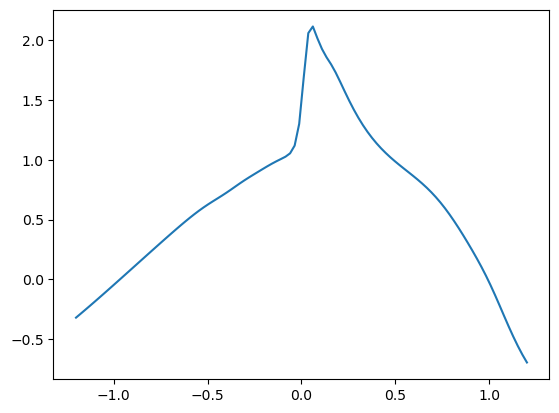

Epoch 500 with loss 0.0025941901840269566


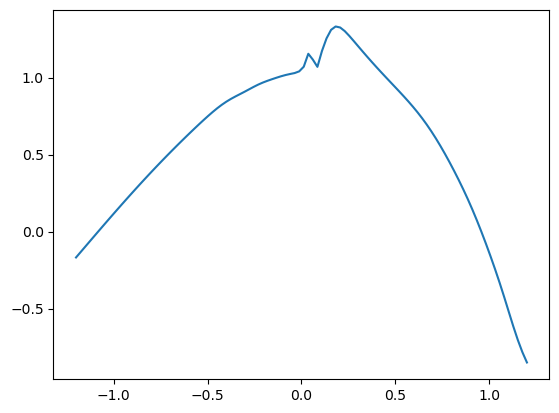

Epoch 1000 with loss 0.01050667092204094


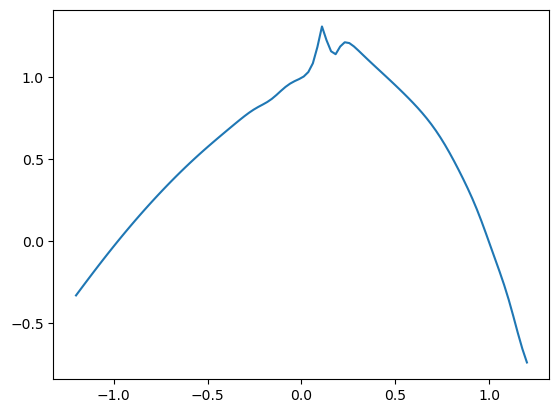

Epoch 1500 with loss 0.0009569691610522568


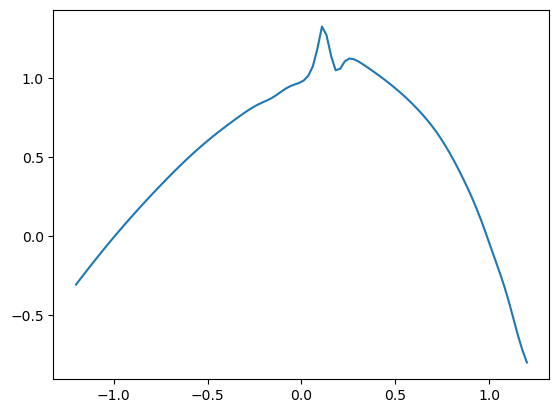

Epoch 2000 with loss 0.0006526060751639307


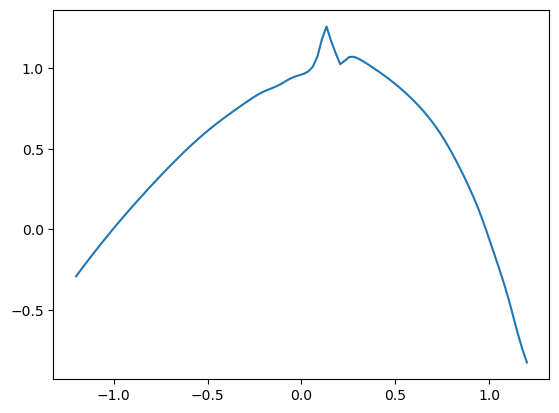

Epoch 2500 with loss 0.004503872711211443


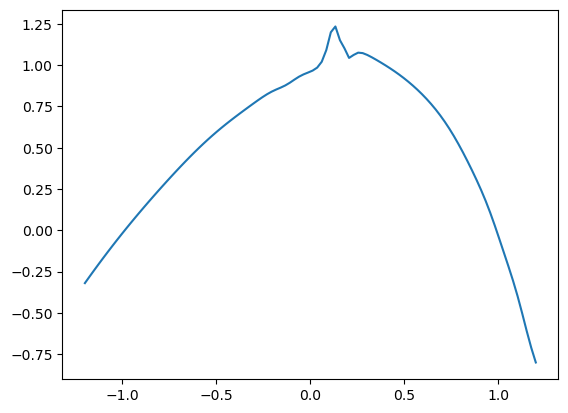

Epoch 3000 with loss 0.0005460113170556724


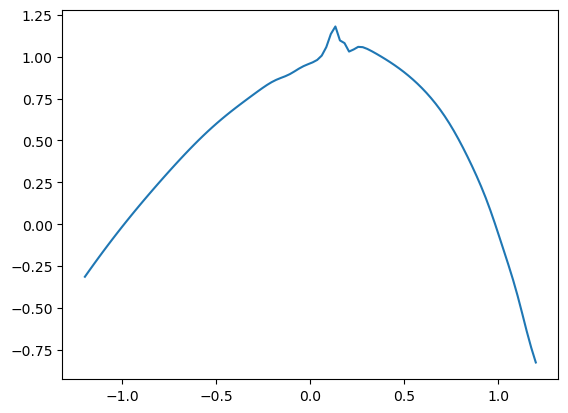

Epoch 3500 with loss 0.0012028015917167068


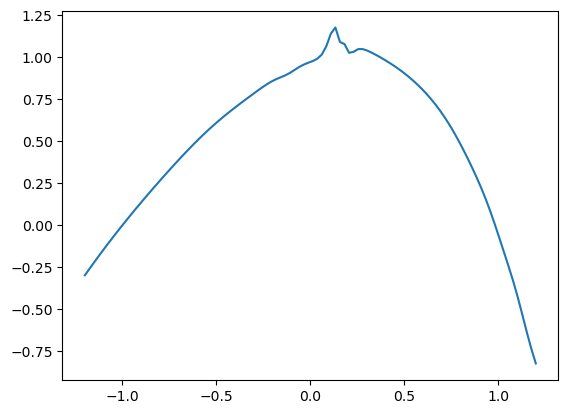

Epoch 4000 with loss 0.0017849992727860808


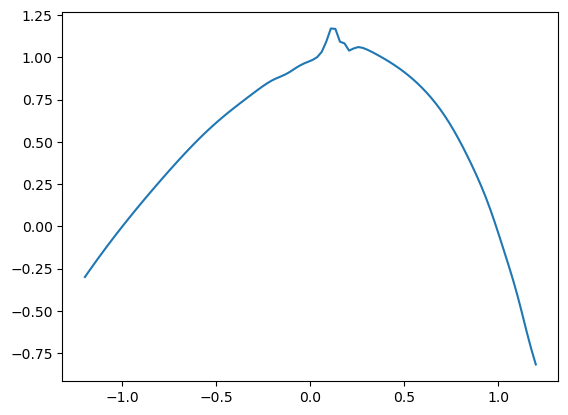

Epoch 4500 with loss 0.0007103841053321958


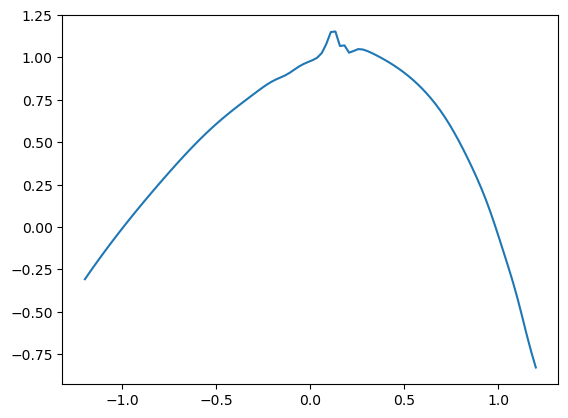

Epoch 4999 with loss 0.0005993258091621101
Training of neural network with 5000 epochs take 230.1006519794464 seconds.
Time taken: 230 seconds; L1 error: 4.43E-02; L2 error: 3.38E-03; rel error: INF.




######## Summary for deep branching method
runtime:        84
fdb runtime:    0
total runtime:  85
mean L1 error:  2.17E-02
std L1 error:   0.00E+00
mean L2 error:  8.93E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        262
mean L1 error:  4.06E-02
std L1 error:   0.00E+00
mean L2 error:  2.05E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        230
mean L1 error:  4.43E-02
std L1 error:   0.00E+00
mean L2 error:  3.38E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


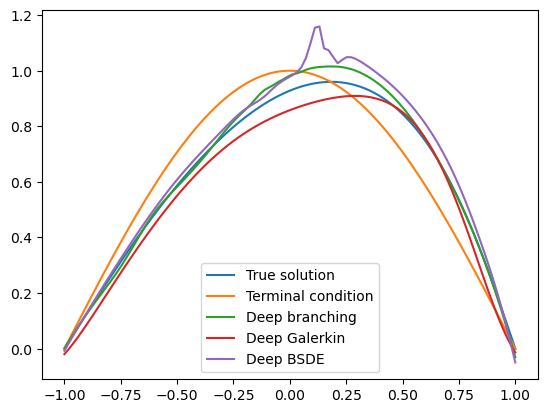

In [12]:
dim = 2
T=0.1/dim

grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 3

Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


#### Starting deep branching method with seed 0 - 1 out of 1 times


Patch 0: generation of u samples take 97.6764965057373 seconds.
Patch  0: epoch    0 with loss 2.88E+00


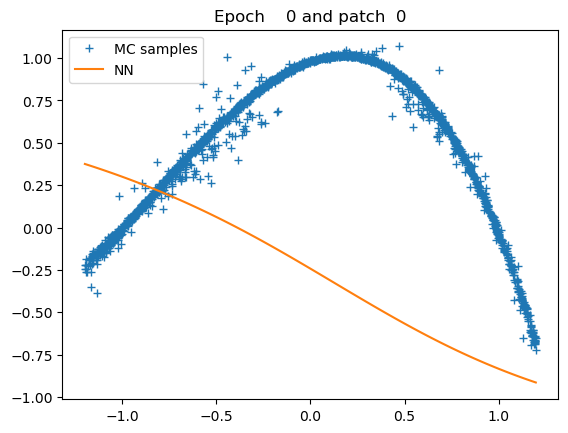

Patch  0: epoch  500 with loss 1.49E-03


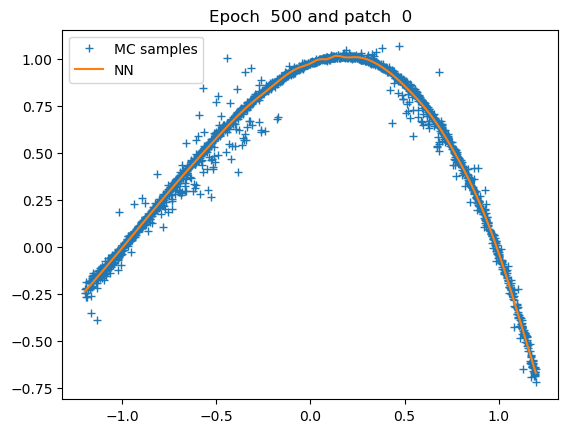

Patch  0: epoch 1000 with loss 1.48E-03


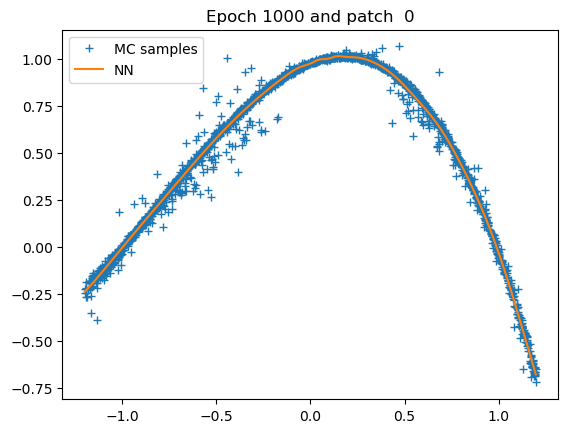

Patch  0: epoch 1500 with loss 1.48E-03


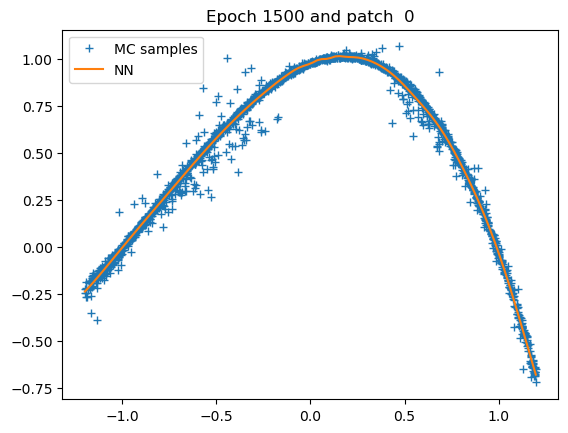

Patch  0: epoch 2000 with loss 1.48E-03


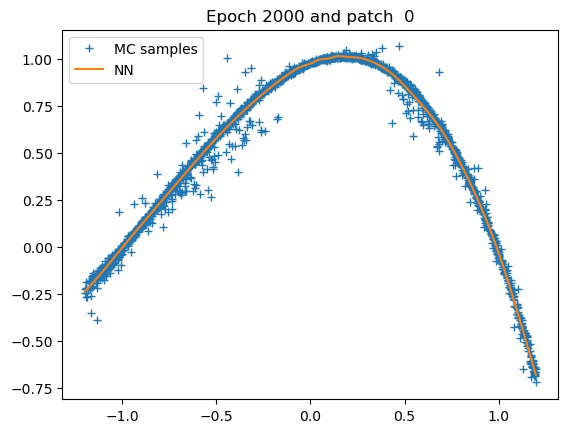

Patch  0: epoch 2500 with loss 1.48E-03


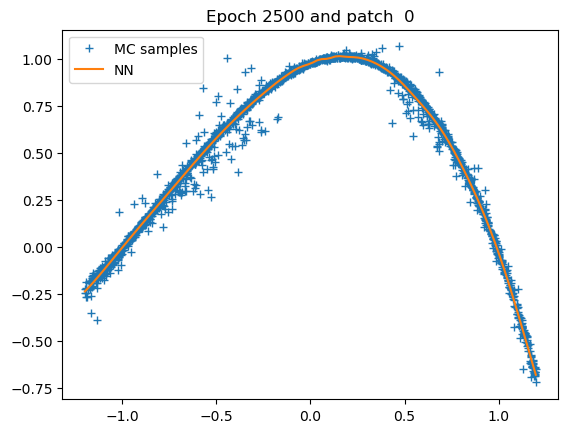

Patch  0: epoch 3000 with loss 1.48E-03


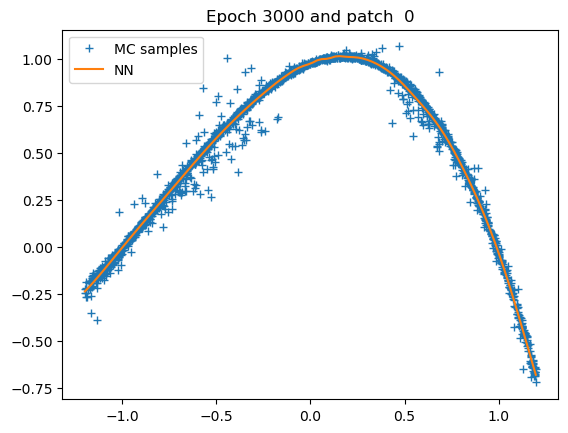

Patch  0: epoch 3500 with loss 1.48E-03


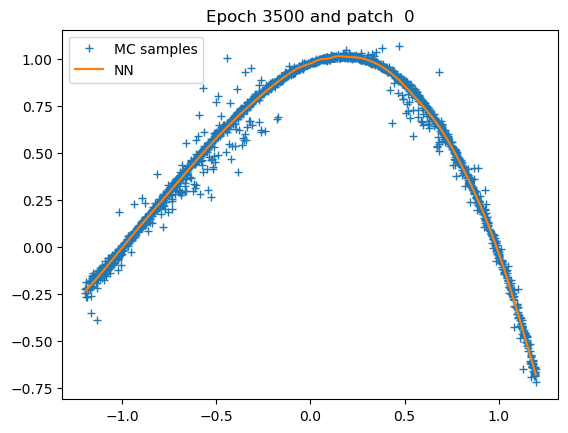

Patch  0: epoch 4000 with loss 1.48E-03


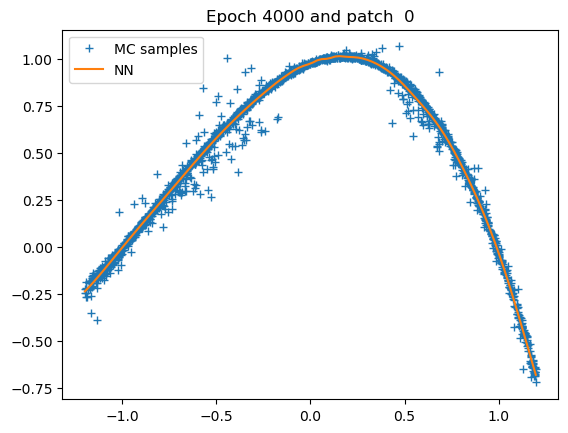

Patch  0: epoch 4500 with loss 1.48E-03


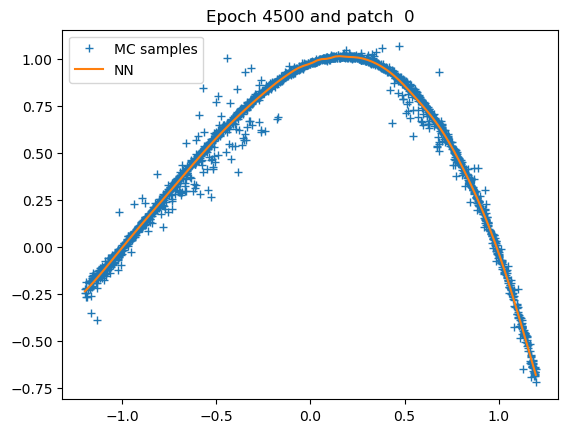

Patch  0: epoch 4999 with loss 1.48E-03


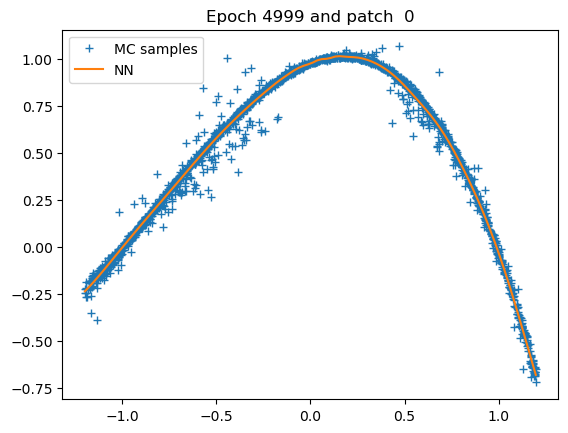

Patch 0: training of u with 5000 epochs take 36.50801157951355 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 132 seconds; L1 error: 2.28E-02; L2 error: 8.74E-04; rel error: INF.
fdb runtime: 2 seconds; total runtime: 134 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


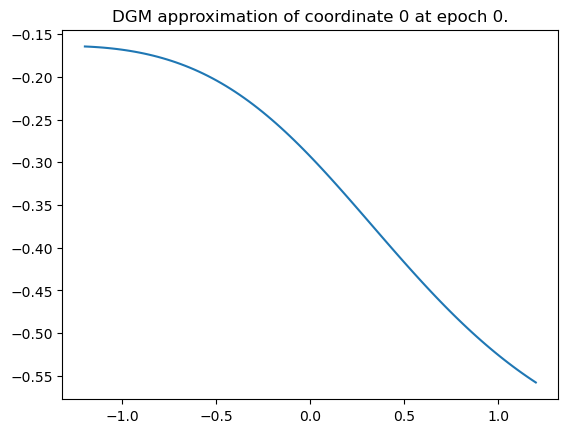

Epoch 0 with loss 3.904049873352051


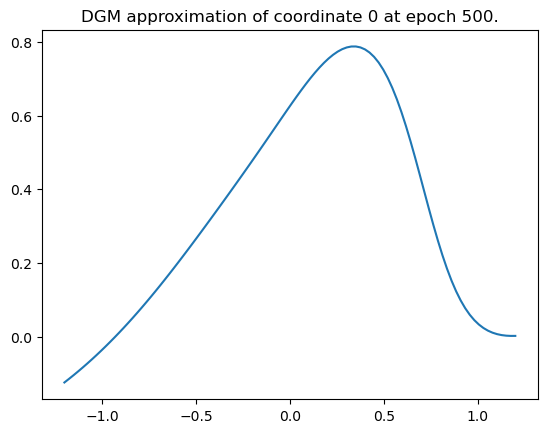

Epoch 500 with loss 2.1317291259765625


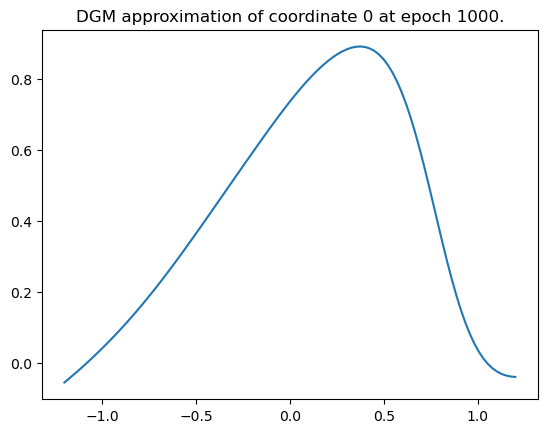

Epoch 1000 with loss 1.9956004619598389


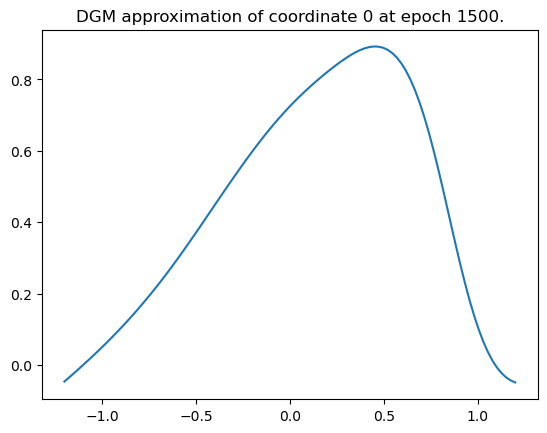

Epoch 1500 with loss 1.9147282838821411


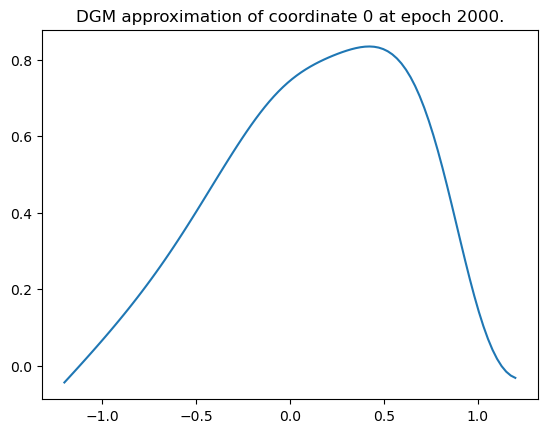

Epoch 2000 with loss 1.8415913581848145


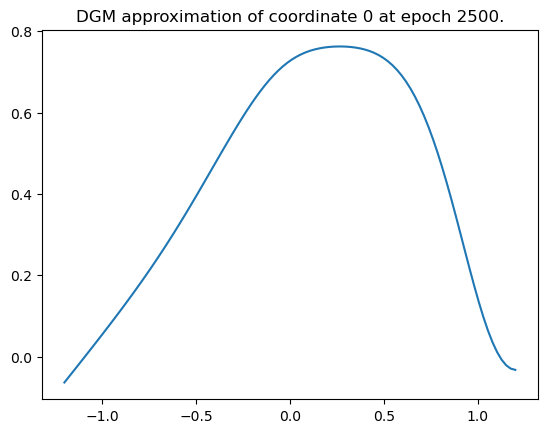

Epoch 2500 with loss 1.7942839860916138


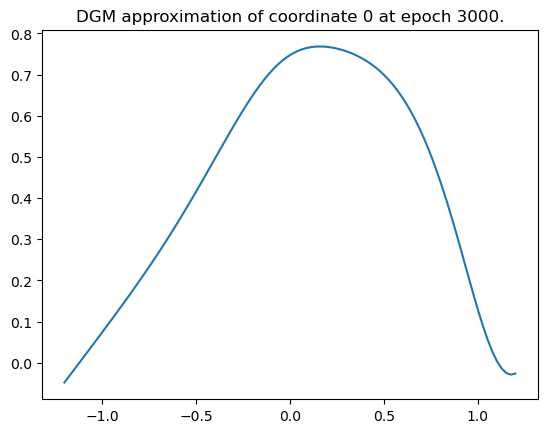

Epoch 3000 with loss 1.7468106746673584


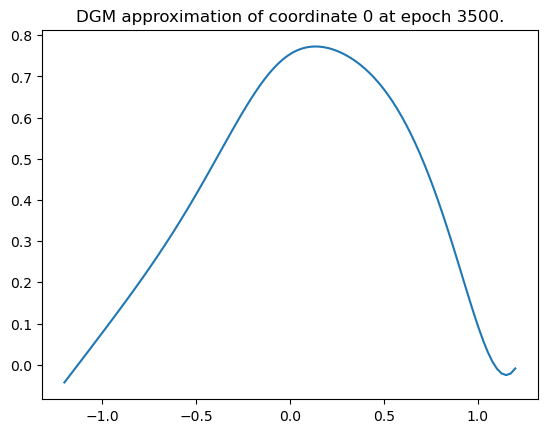

Epoch 3500 with loss 1.7626482248306274


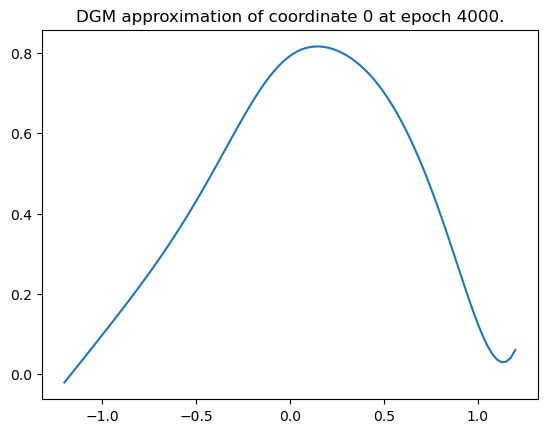

Epoch 4000 with loss 1.6523460149765015


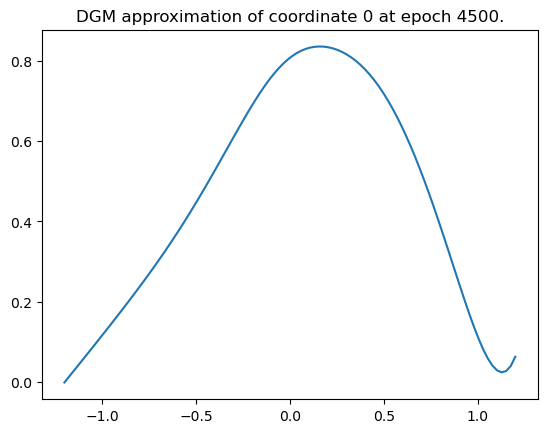

Epoch 4500 with loss 1.6657350063323975


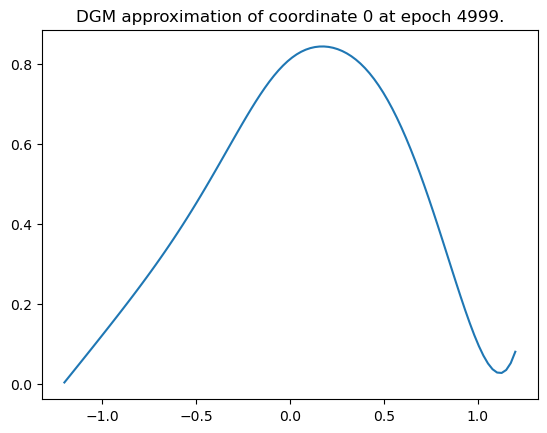

Epoch 4999 with loss 1.647957682609558
Training of neural network with 5000 epochs take 328.07871985435486 seconds.


Time taken: 328 seconds; L1 error: 1.02E-01; L2 error: 1.19E-02; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


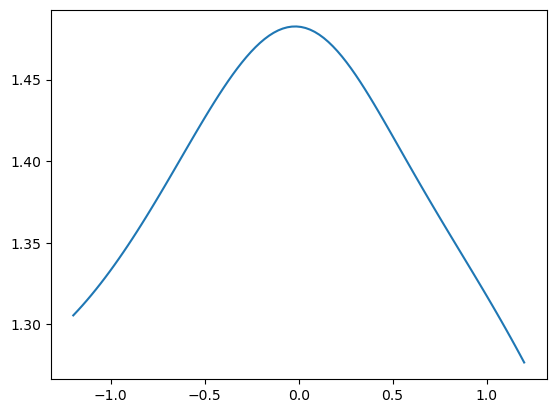

Epoch 0 with loss 1.3599494695663452


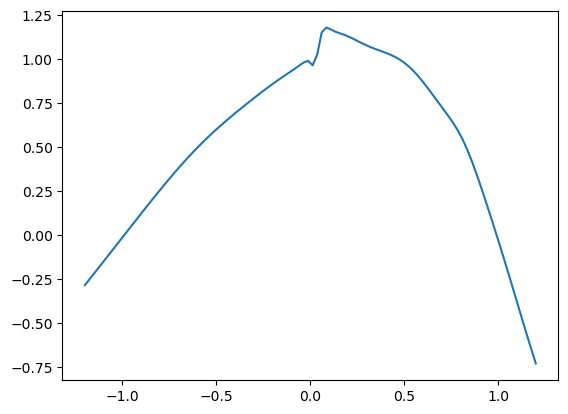

Epoch 500 with loss 0.0032489425502717495


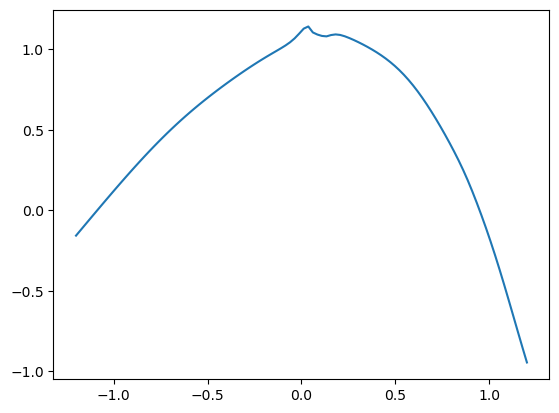

Epoch 1000 with loss 0.0057721491903066635


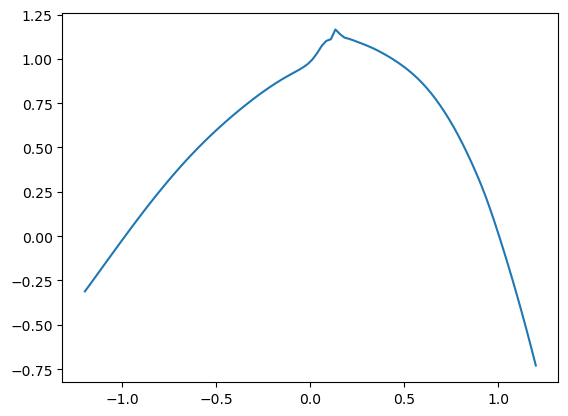

Epoch 1500 with loss 0.004429939202964306


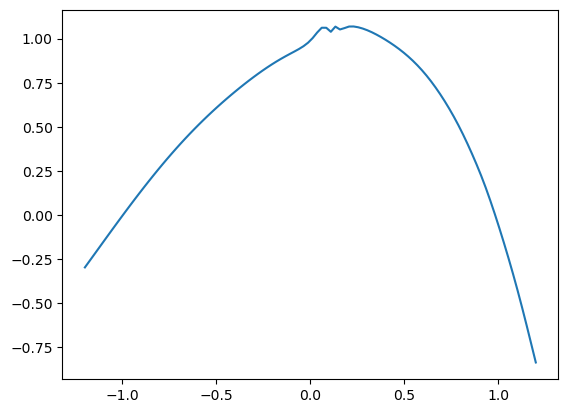

Epoch 2000 with loss 0.0008675584103912115


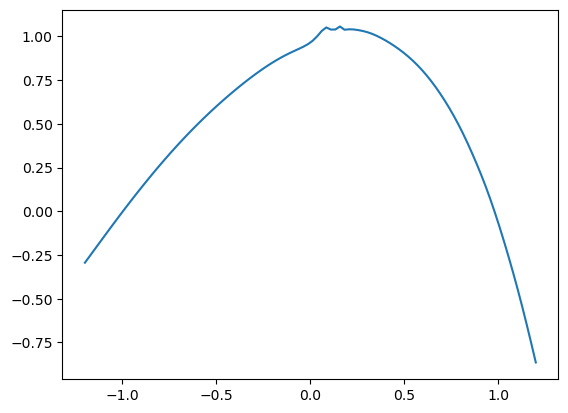

Epoch 2500 with loss 0.0011124842567369342


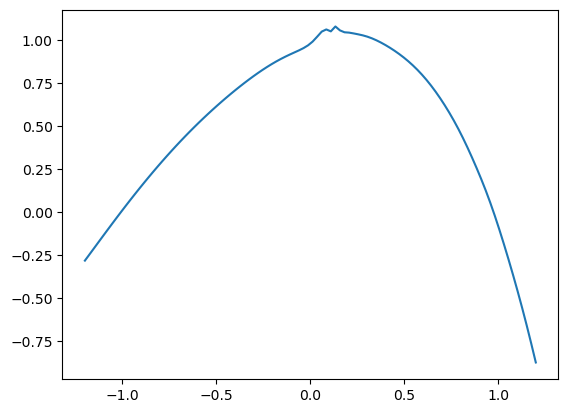

Epoch 3000 with loss 0.001096190302632749


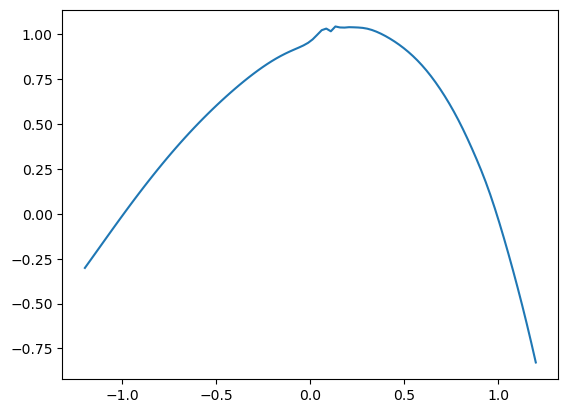

Epoch 3500 with loss 0.0006987376254983246


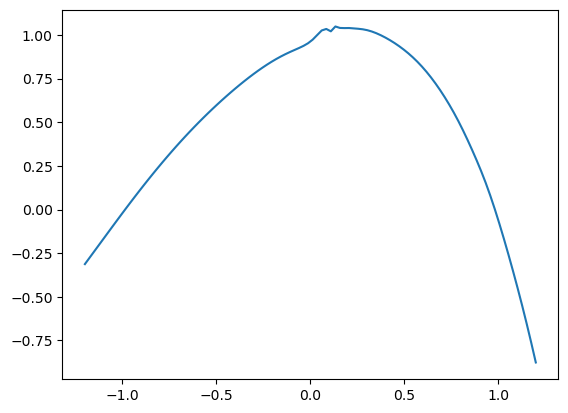

Epoch 4000 with loss 0.0006255478365346789


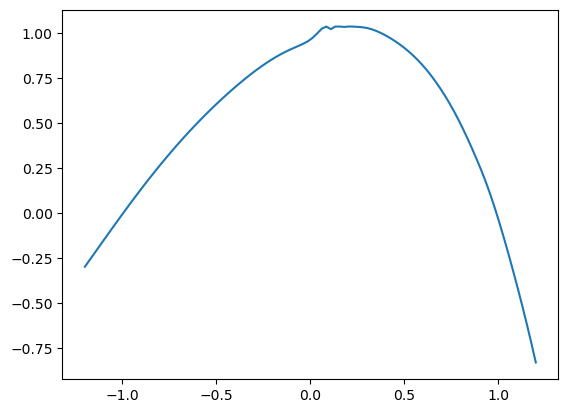

Epoch 4500 with loss 0.00358418095856905


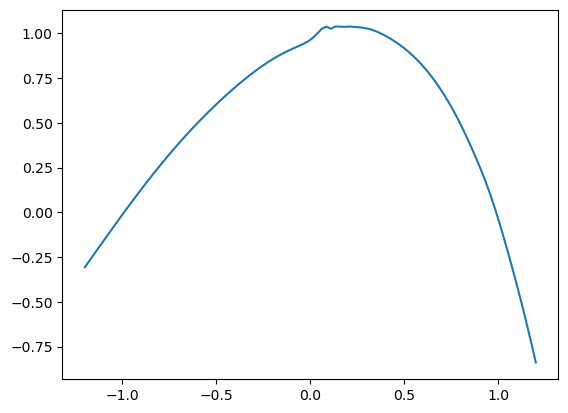

Epoch 4999 with loss 0.0007961783558130264
Training of neural network with 5000 epochs take 233.7177939414978 seconds.
Time taken: 234 seconds; L1 error: 3.92E-02; L2 error: 2.30E-03; rel error: INF.




######## Summary for deep branching method
runtime:        132
fdb runtime:    2
total runtime:  134
mean L1 error:  2.28E-02
std L1 error:   0.00E+00
mean L2 error:  8.74E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        328
mean L1 error:  1.02E-01
std L1 error:   0.00E+00
mean L2 error:  1.19E-02
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        234
mean L1 error:  3.92E-02
std L1 error:   0.00E+00
mean L2 error:  2.30E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


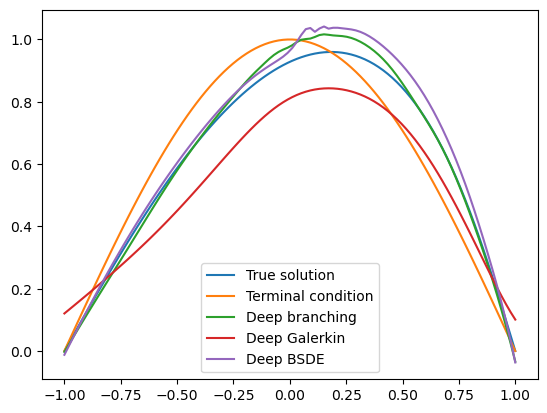

In [13]:
dim = 3
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 4

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 194.68806338310242 seconds.
Patch  0: epoch    0 with loss 5.11E-01


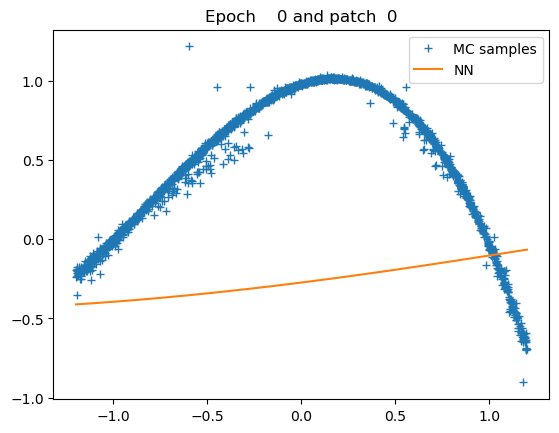

Patch  0: epoch  500 with loss 1.27E-03


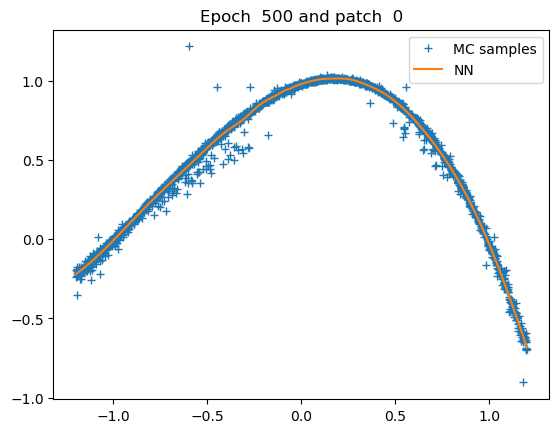

Patch  0: epoch 1000 with loss 1.27E-03


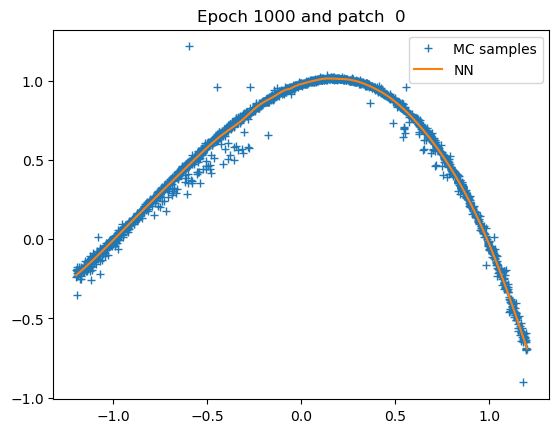

Patch  0: epoch 1500 with loss 1.27E-03


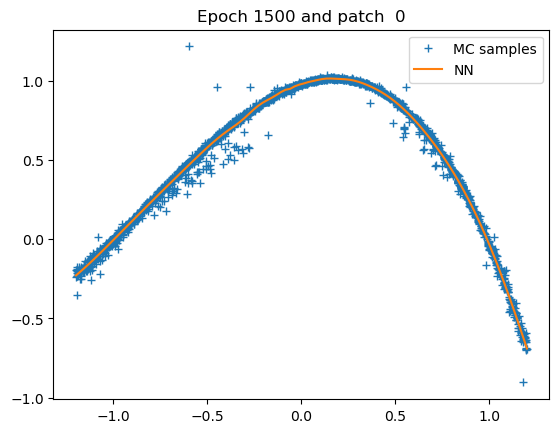

Patch  0: epoch 2000 with loss 1.27E-03


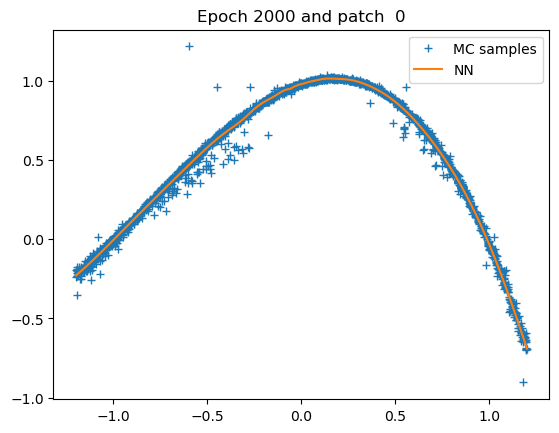

Patch  0: epoch 2500 with loss 1.27E-03


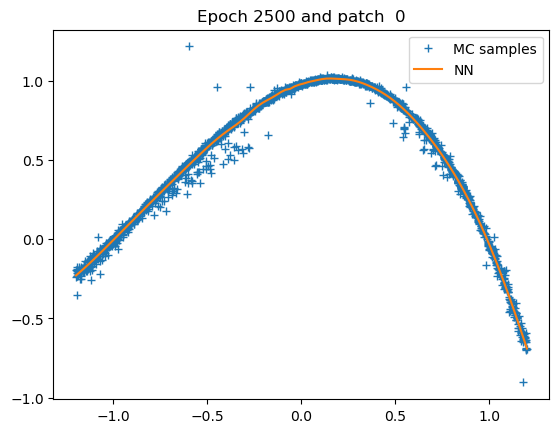

Patch  0: epoch 3000 with loss 1.27E-03


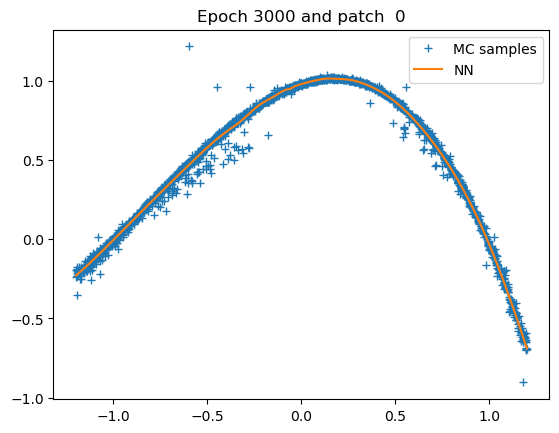

Patch  0: epoch 3500 with loss 1.27E-03


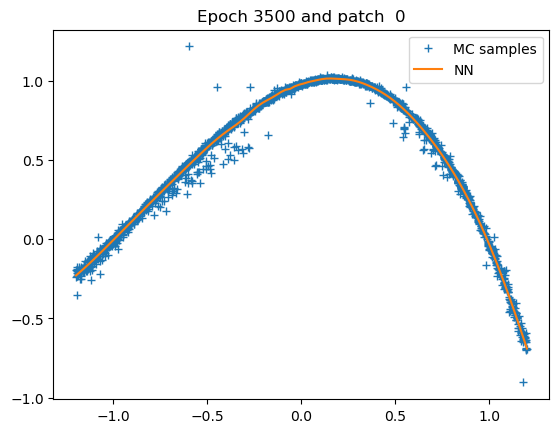

Patch  0: epoch 4000 with loss 1.27E-03


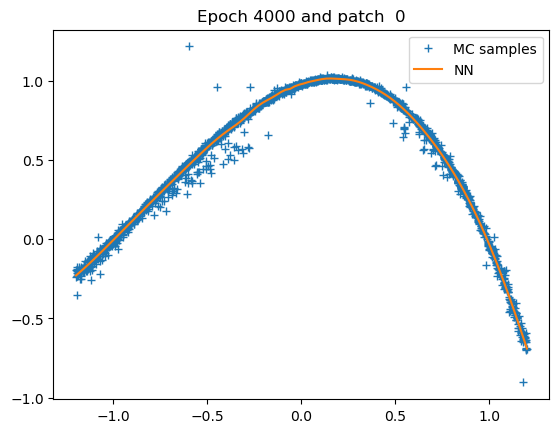

Patch  0: epoch 4500 with loss 1.27E-03


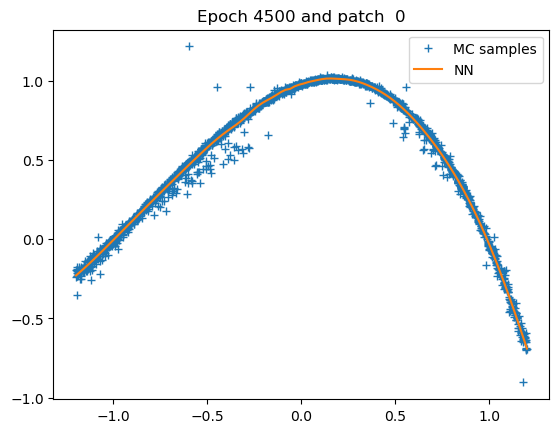

Patch  0: epoch 4999 with loss 1.27E-03


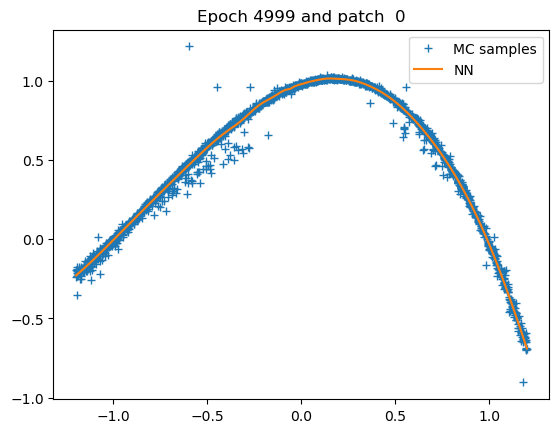

Patch 0: training of u with 5000 epochs take 39.174588441848755 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 225 seconds; L1 error: 2.41E-02; L2 error: 9.13E-04; rel error: INF.
fdb runtime: 9 seconds; total runtime: 234 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


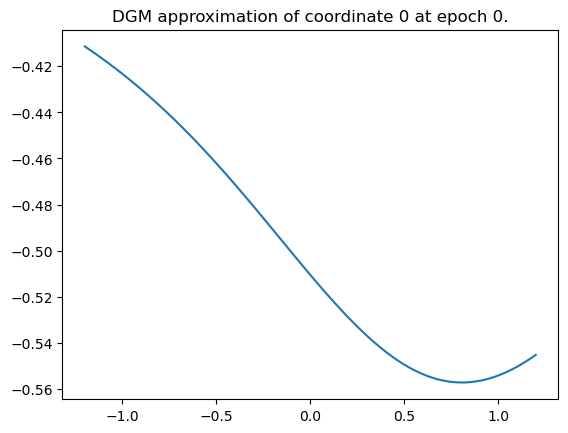

Epoch 0 with loss 7.096261024475098


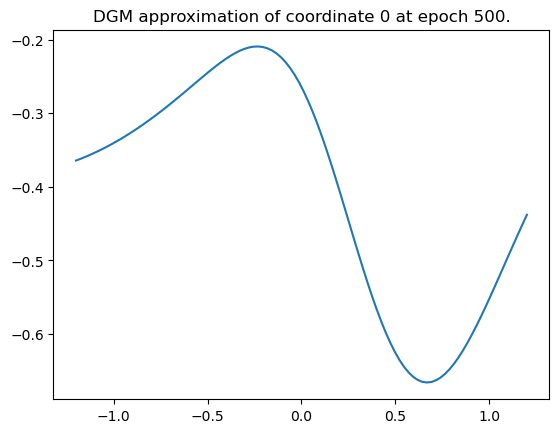

Epoch 500 with loss 4.65012788772583


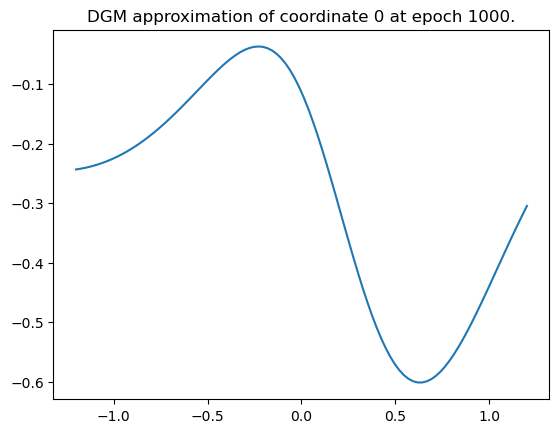

Epoch 1000 with loss 4.310983180999756


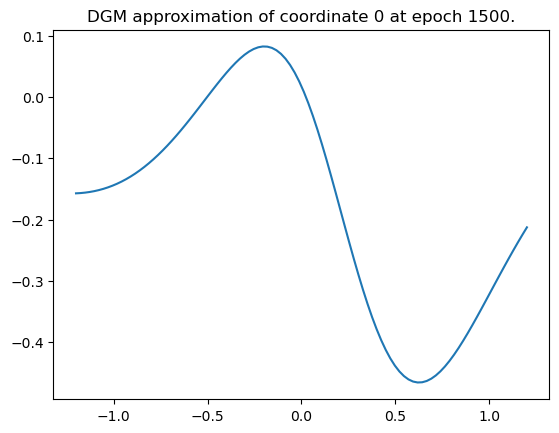

Epoch 1500 with loss 4.153947830200195


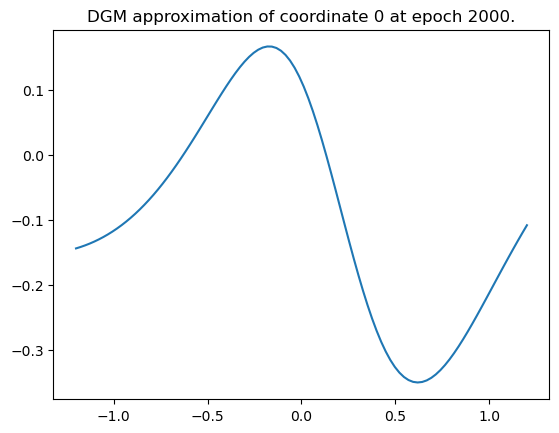

Epoch 2000 with loss 4.216936111450195


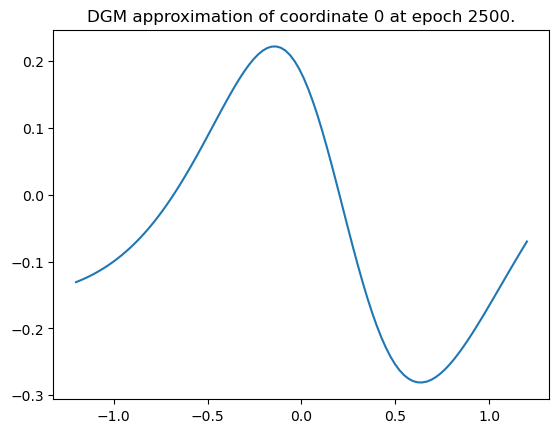

Epoch 2500 with loss 4.05279541015625


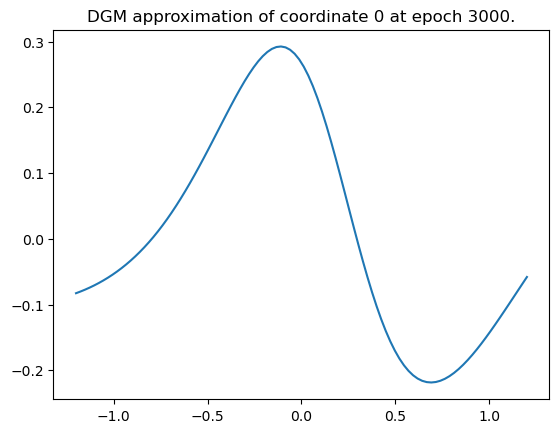

Epoch 3000 with loss 4.209506034851074


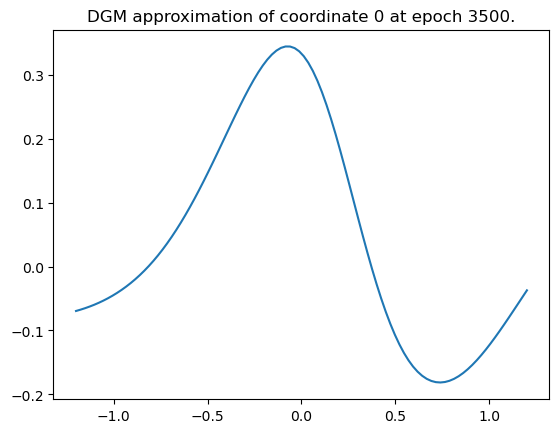

Epoch 3500 with loss 3.9813287258148193


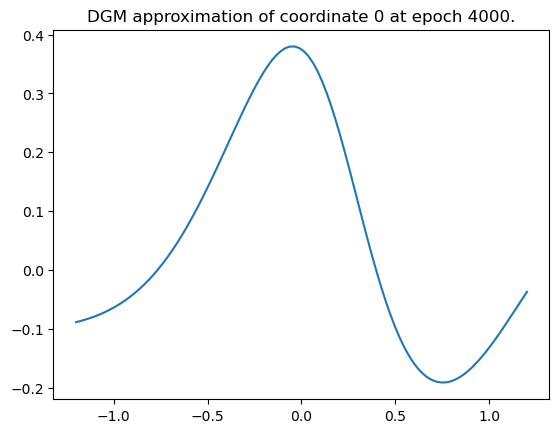

Epoch 4000 with loss 4.1689252853393555


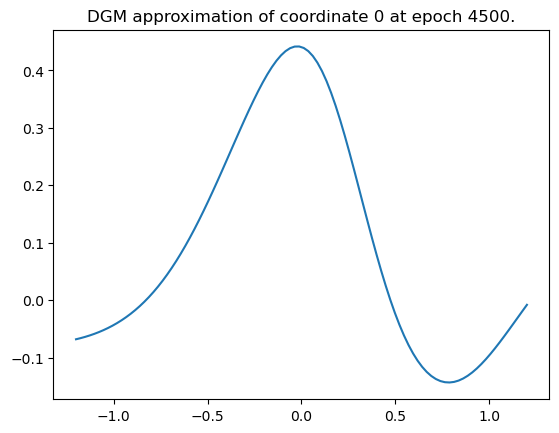

Epoch 4500 with loss 4.0609564781188965


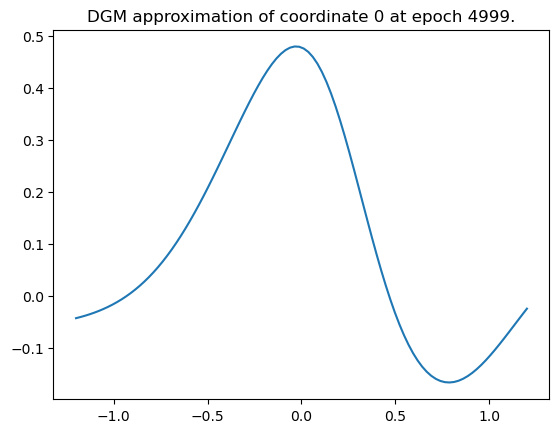

Epoch 4999 with loss 3.963078498840332
Training of neural network with 5000 epochs take 393.7206938266754 seconds.


Time taken: 394 seconds; L1 error: 4.82E-01; L2 error: 2.86E-01; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


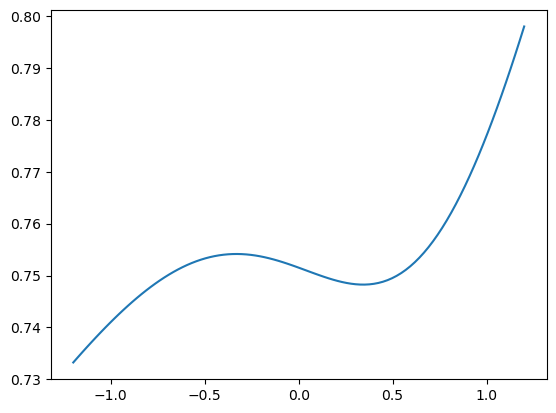

Epoch 0 with loss 1.5398200750350952


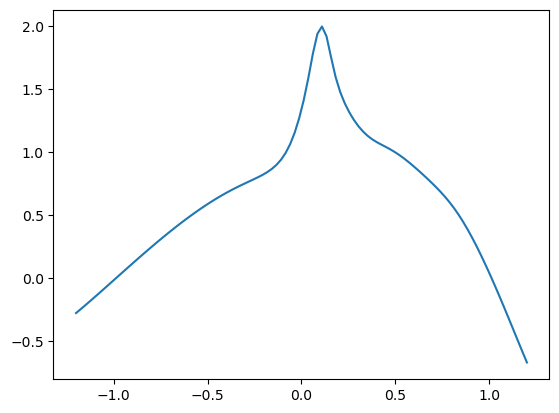

Epoch 500 with loss 0.0022642810363322496


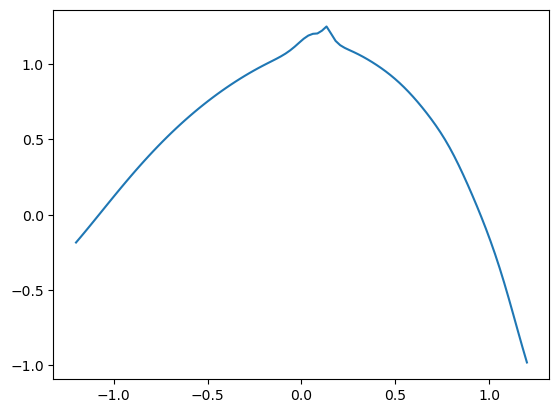

Epoch 1000 with loss 0.0022136936895549297


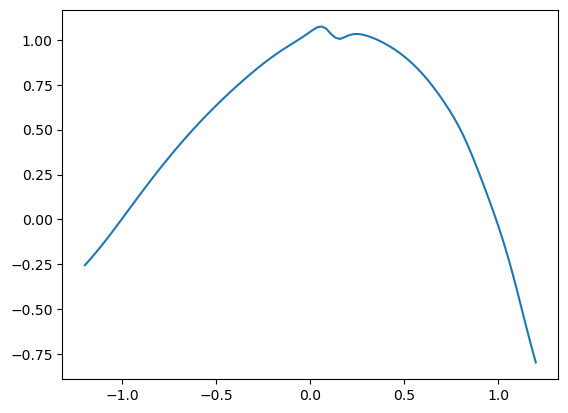

Epoch 1500 with loss 0.003805543063208461


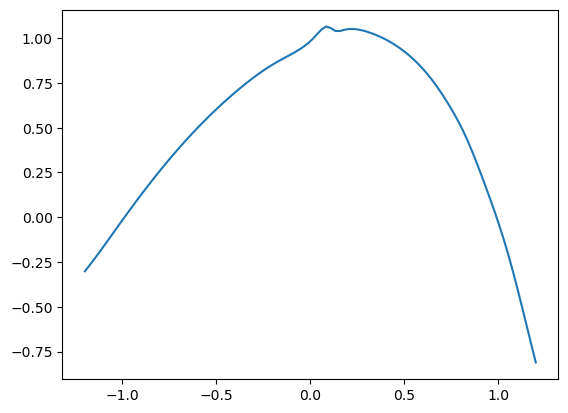

Epoch 2000 with loss 0.0014203725149855018


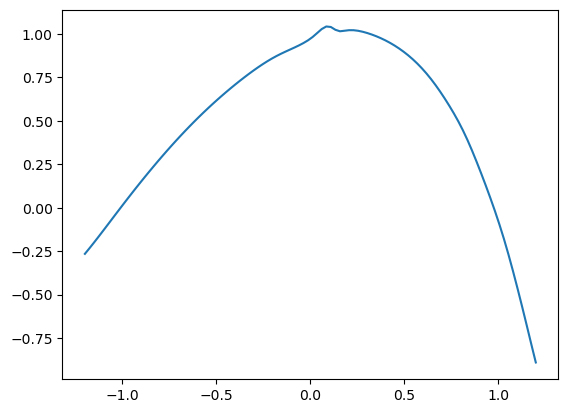

Epoch 2500 with loss 0.0021357950754463673


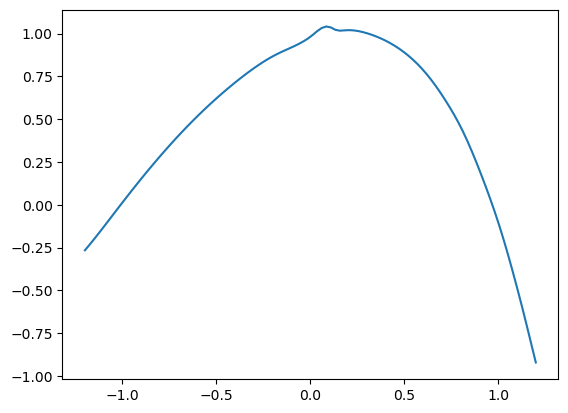

Epoch 3000 with loss 0.0011214559199288487


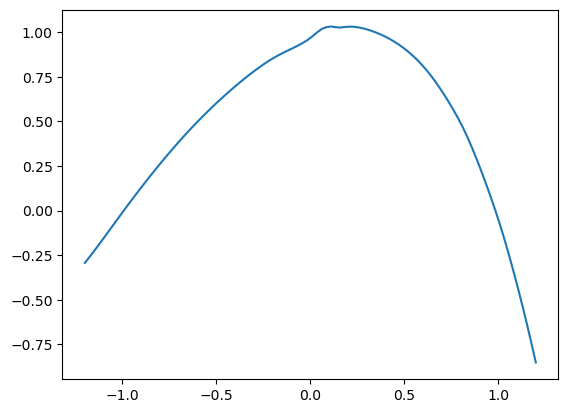

Epoch 3500 with loss 0.0008278645109385252


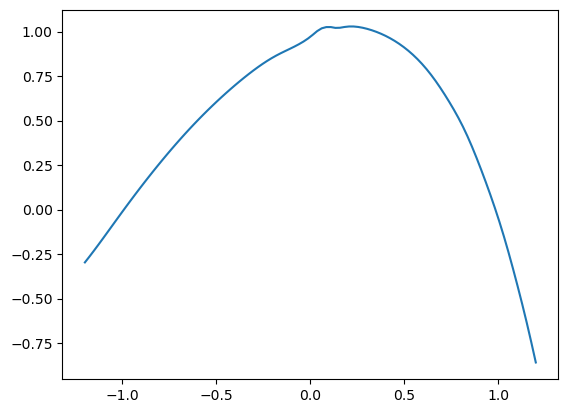

Epoch 4000 with loss 0.002349182963371277


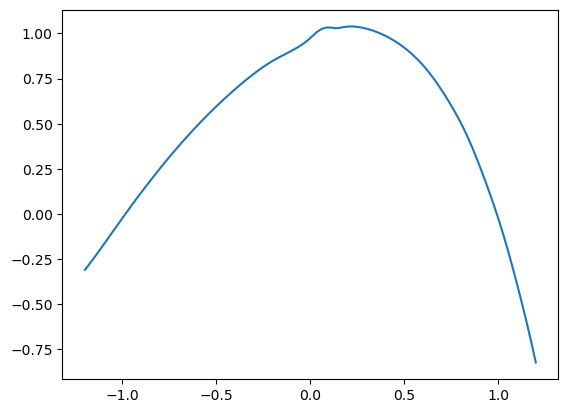

Epoch 4500 with loss 0.001868214225396514


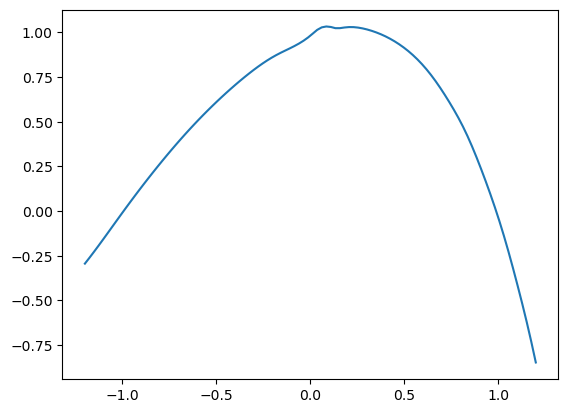

Epoch 4999 with loss 0.0007534725009463727
Training of neural network with 5000 epochs take 238.87838888168335 seconds.
Time taken: 239 seconds; L1 error: 4.11E-02; L2 error: 2.27E-03; rel error: INF.




######## Summary for deep branching method
runtime:        225
fdb runtime:    9
total runtime:  234
mean L1 error:  2.41E-02
std L1 error:   0.00E+00
mean L2 error:  9.13E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        394
mean L1 error:  4.82E-01
std L1 error:   0.00E+00
mean L2 error:  2.86E-01
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        239
mean L1 error:  4.11E-02
std L1 error:   0.00E+00
mean L2 error:  2.27E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


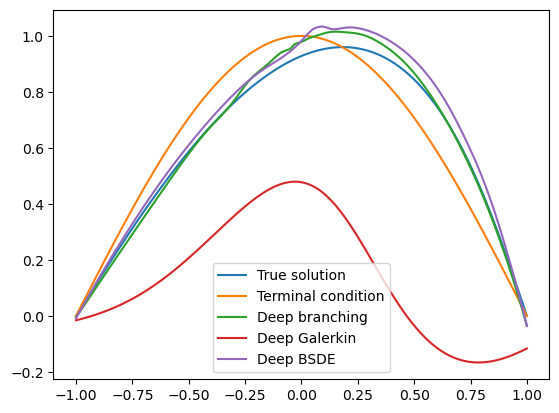

In [14]:
dim = 4
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 5

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 348.12764501571655 seconds.
Patch  0: epoch    0 with loss 2.55E+00


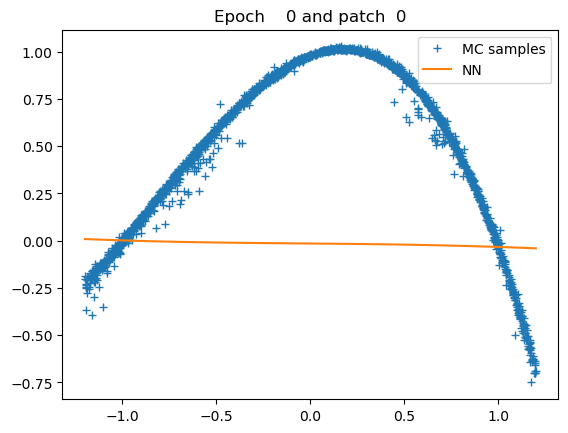

Patch  0: epoch  500 with loss 7.61E-04


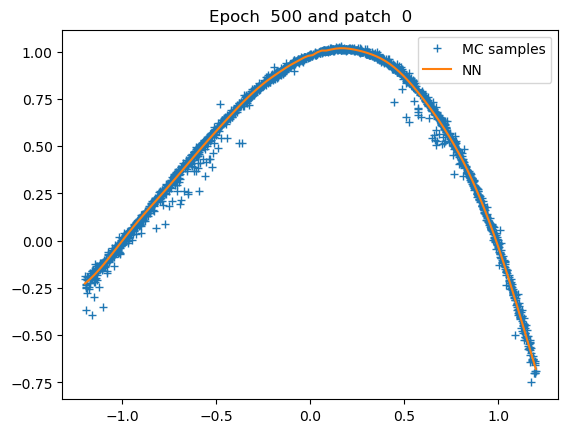

Patch  0: epoch 1000 with loss 7.57E-04


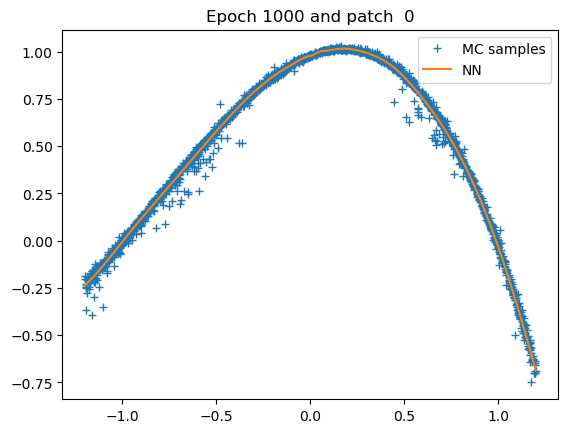

Patch  0: epoch 1500 with loss 7.57E-04


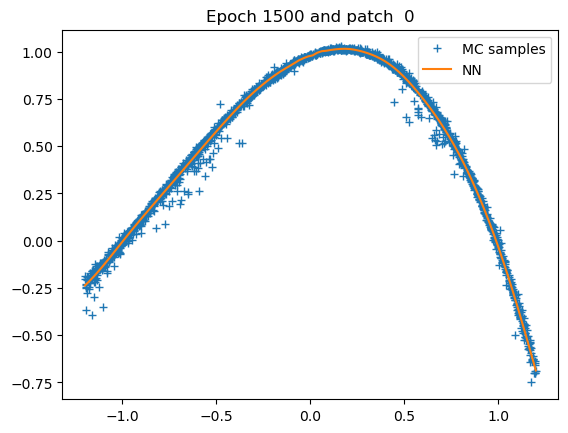

Patch  0: epoch 2000 with loss 7.57E-04


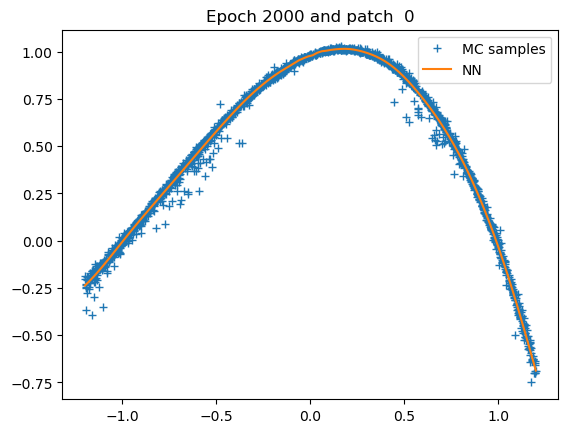

Patch  0: epoch 2500 with loss 7.57E-04


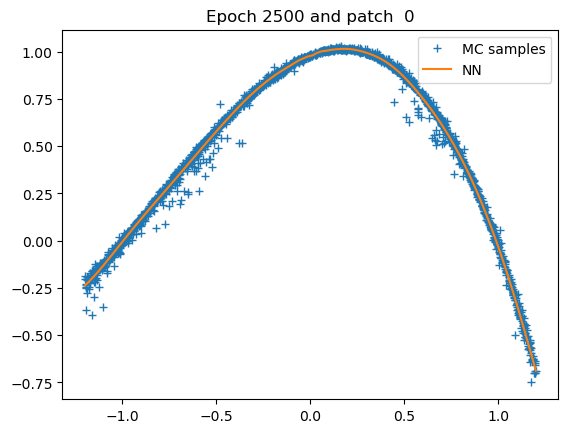

Patch  0: epoch 3000 with loss 7.57E-04


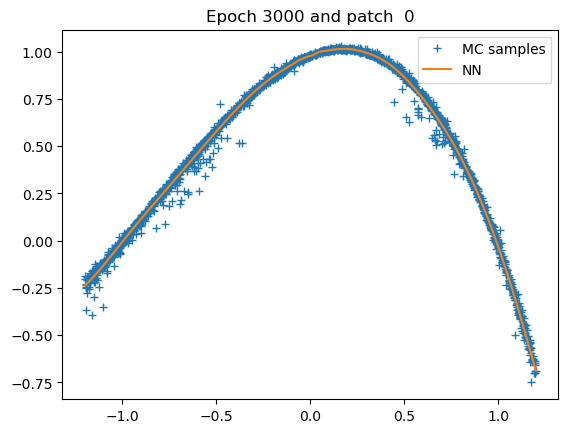

Patch  0: epoch 3500 with loss 7.57E-04


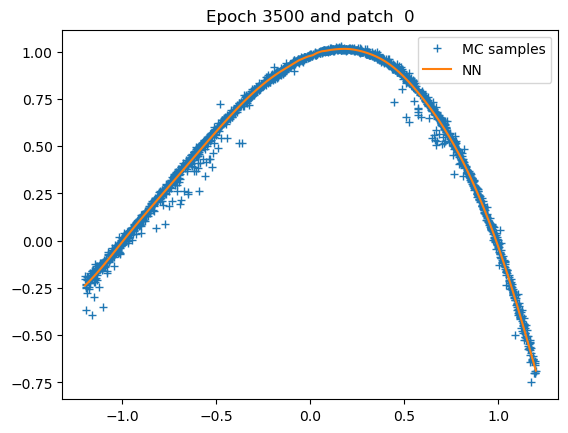

Patch  0: epoch 4000 with loss 7.57E-04


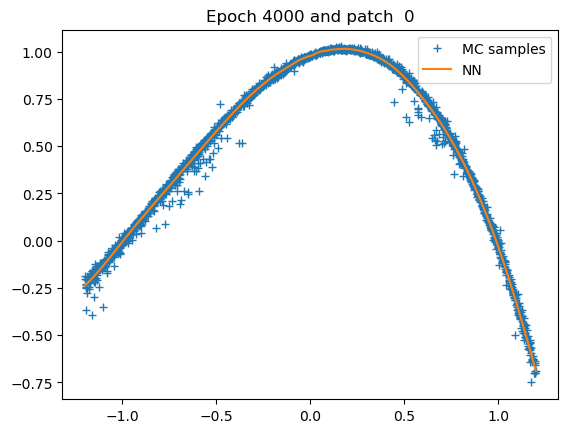

Patch  0: epoch 4500 with loss 7.56E-04


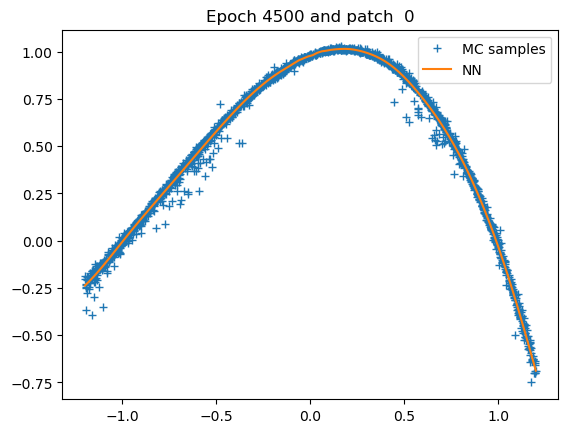

Patch  0: epoch 4999 with loss 7.56E-04


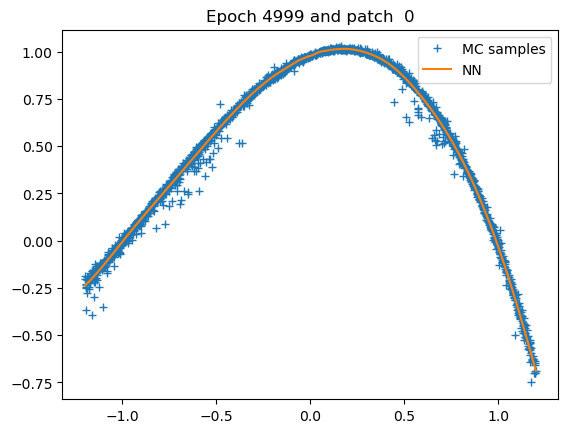

Patch 0: training of u with 5000 epochs take 40.81403732299805 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


Time taken: 369 seconds; L1 error: 2.50E-02; L2 error: 9.39E-04; rel error: INF.
fdb runtime: 20 seconds; total runtime: 389 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


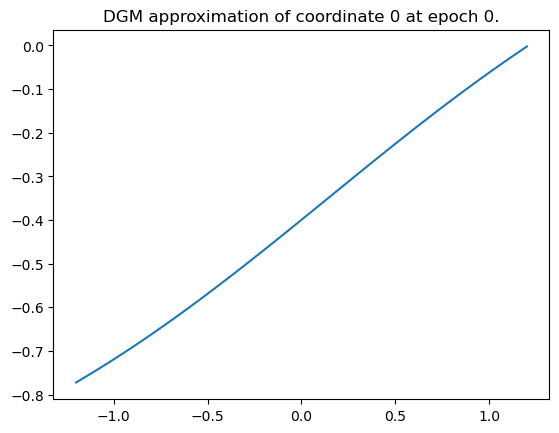

Epoch 0 with loss 12.974395751953125


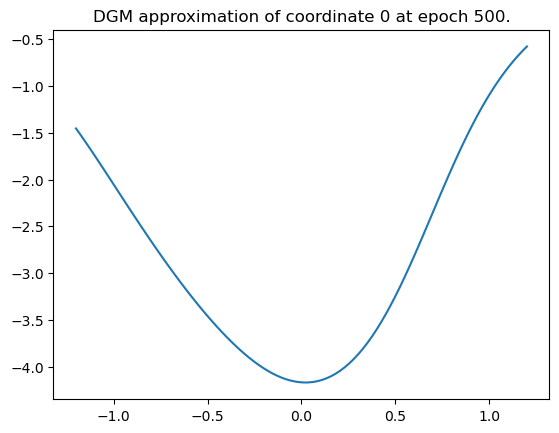

Epoch 500 with loss 8.795778274536133


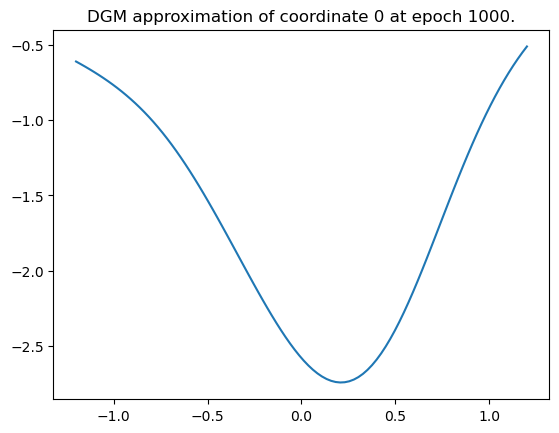

Epoch 1000 with loss 7.737295150756836


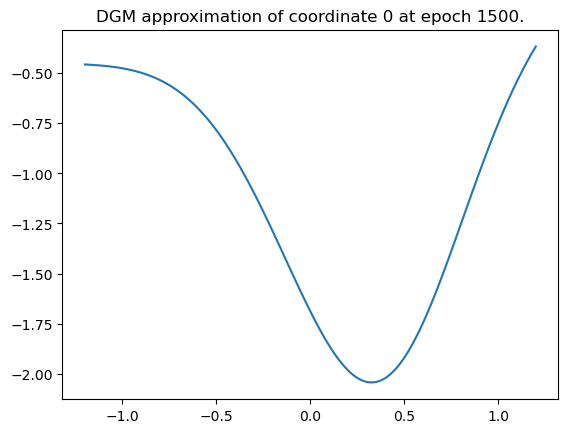

Epoch 1500 with loss 7.169774532318115


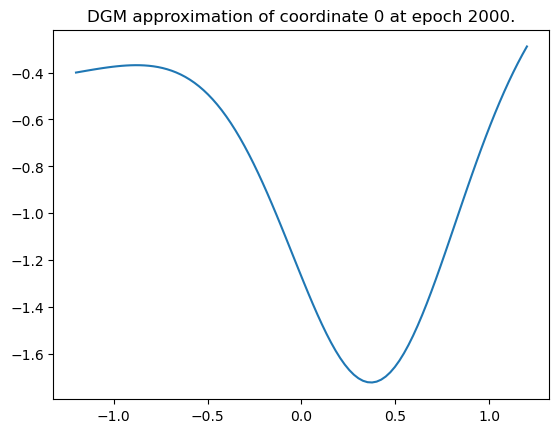

Epoch 2000 with loss 7.209504127502441


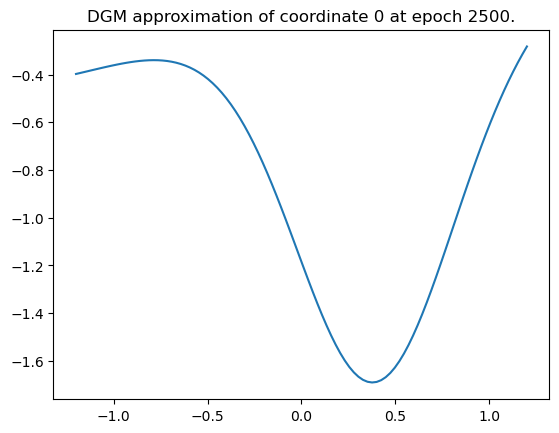

Epoch 2500 with loss 6.950421333312988


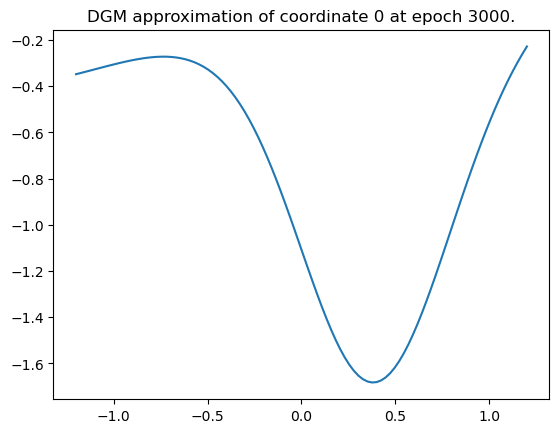

Epoch 3000 with loss 7.14438533782959


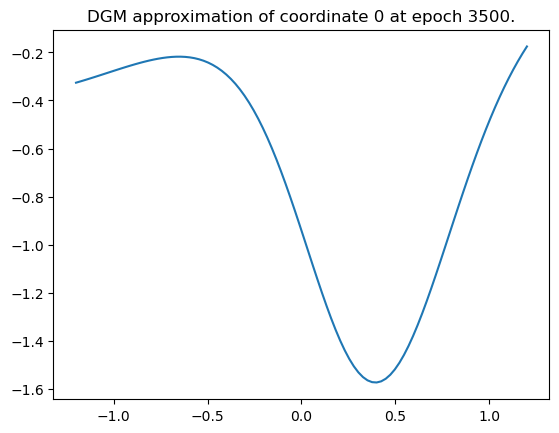

Epoch 3500 with loss 6.864748477935791


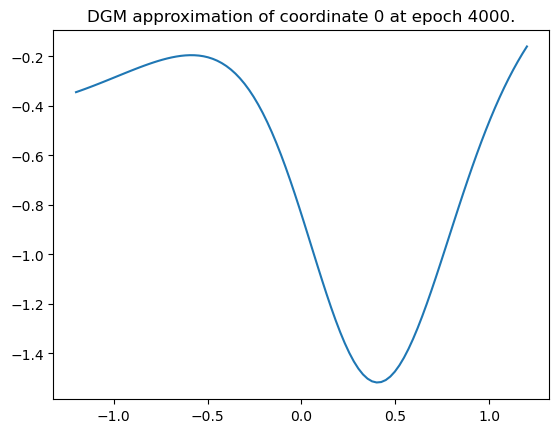

Epoch 4000 with loss 7.113816738128662


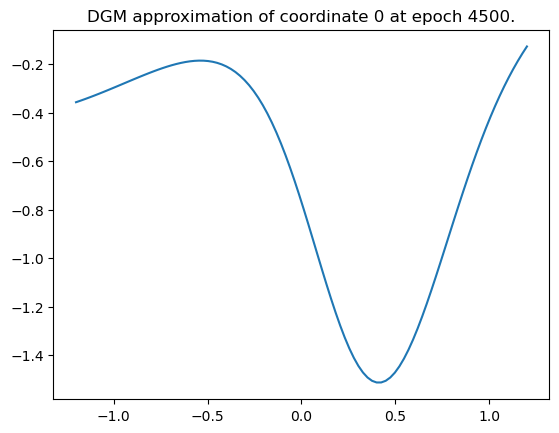

Epoch 4500 with loss 6.8206987380981445


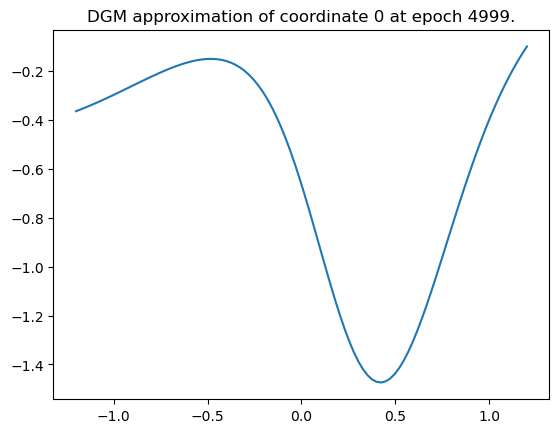

Epoch 4999 with loss 6.954146385192871
Training of neural network with 5000 epochs take 481.28314232826233 seconds.


Time taken: 482 seconds; L1 error: 1.29E+00; L2 error: 2.12E+00; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


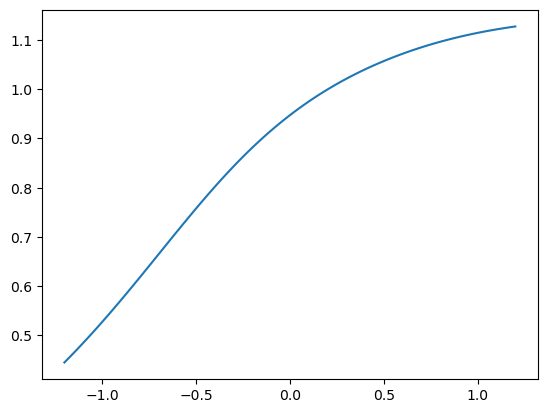

Epoch 0 with loss 1.3690115213394165


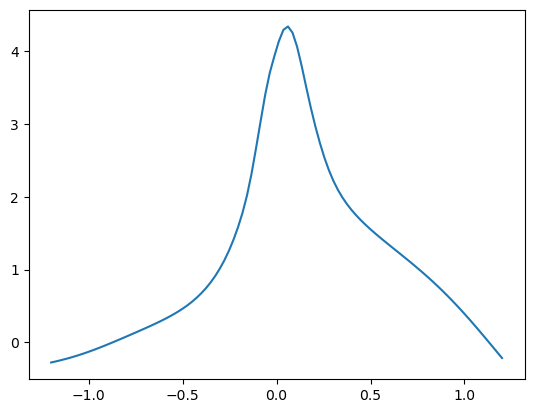

Epoch 500 with loss 0.0231099184602499


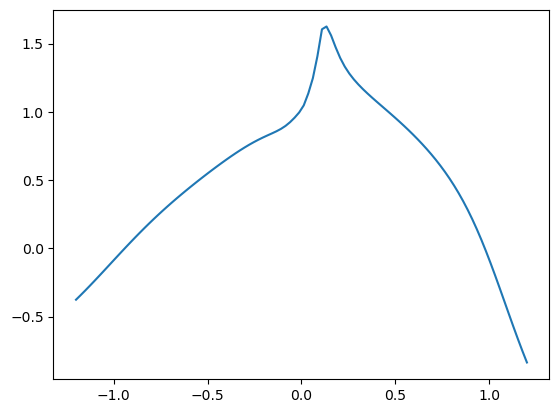

Epoch 1000 with loss 0.001695798011496663


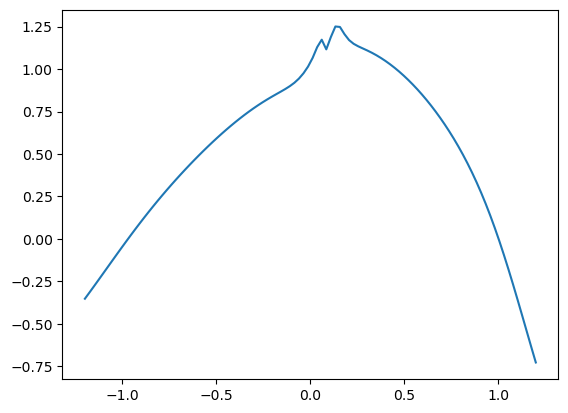

Epoch 1500 with loss 0.005339866038411856


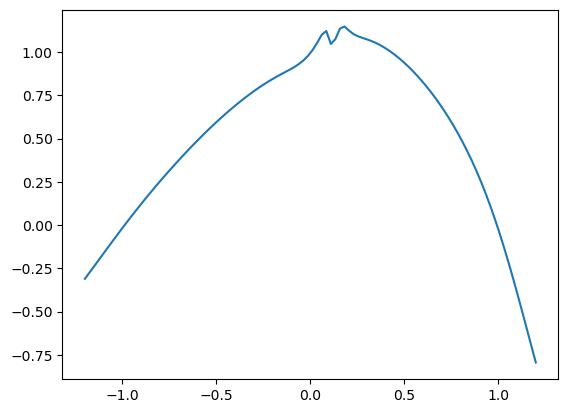

Epoch 2000 with loss 0.001078160130418837


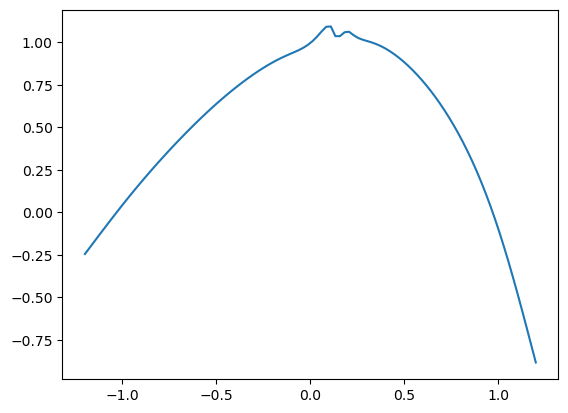

Epoch 2500 with loss 0.0015938356518745422


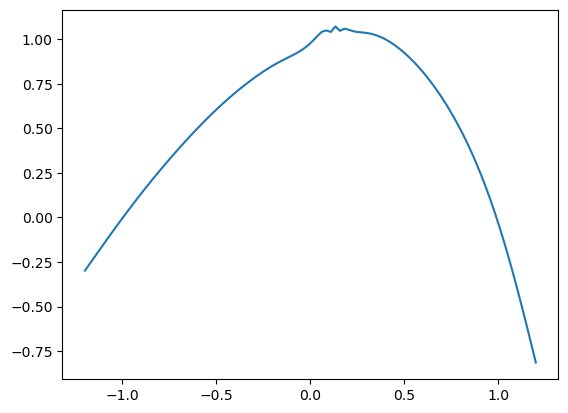

Epoch 3000 with loss 0.001007406390272081


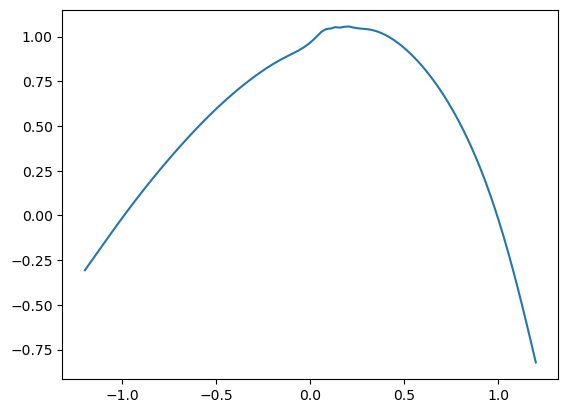

Epoch 3500 with loss 0.001130873803049326


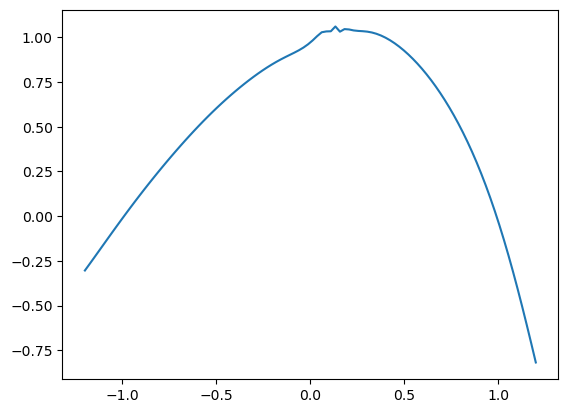

Epoch 4000 with loss 0.0013252443168312311


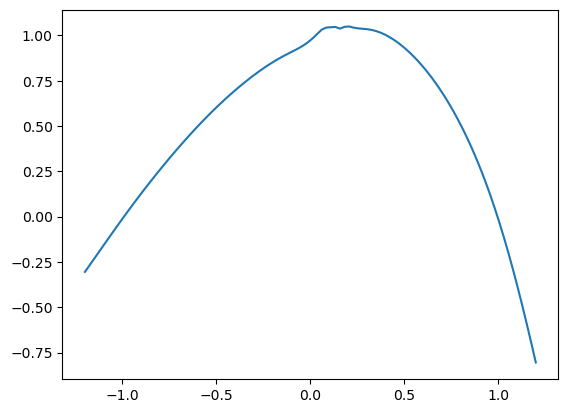

Epoch 4500 with loss 0.0007173752528615296


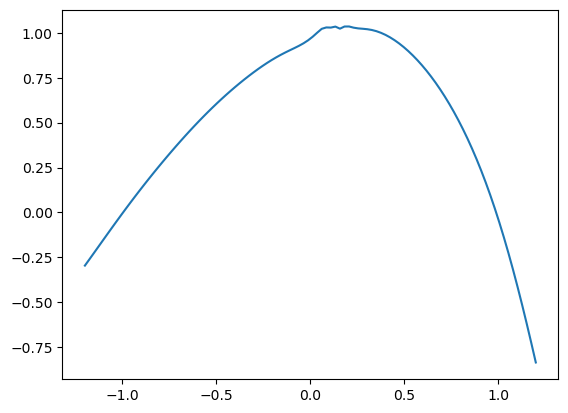

Epoch 4999 with loss 0.0009581869235262275
Training of neural network with 5000 epochs take 238.52634024620056 seconds.
Time taken: 239 seconds; L1 error: 3.84E-02; L2 error: 2.19E-03; rel error: INF.




######## Summary for deep branching method
runtime:        369
fdb runtime:    20
total runtime:  389
mean L1 error:  2.50E-02
std L1 error:   0.00E+00
mean L2 error:  9.39E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        482
mean L1 error:  1.29E+00
std L1 error:   0.00E+00
mean L2 error:  2.12E+00
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        239
mean L1 error:  3.84E-02
std L1 error:   0.00E+00
mean L2 error:  2.19E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


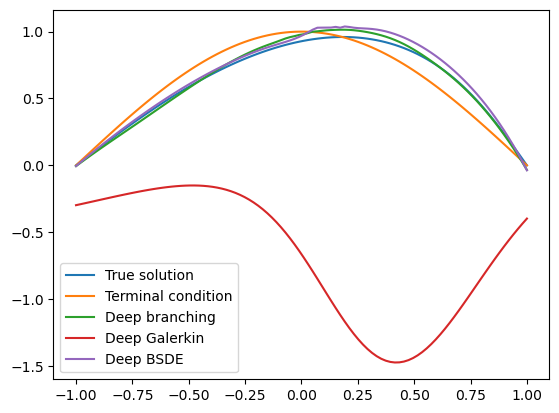

In [15]:
dim = 5
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 6

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 197.82583093643188 seconds.
Patch  0: epoch    0 with loss 4.60E+00


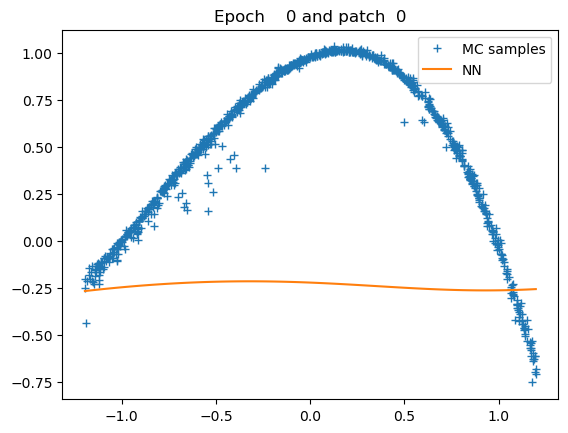

Patch  0: epoch  500 with loss 1.44E-03


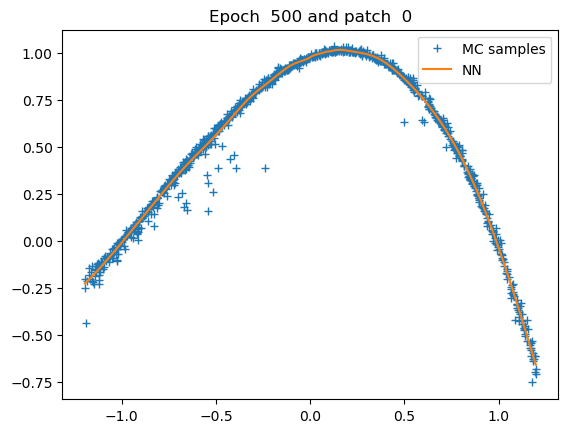

Patch  0: epoch 1000 with loss 1.44E-03


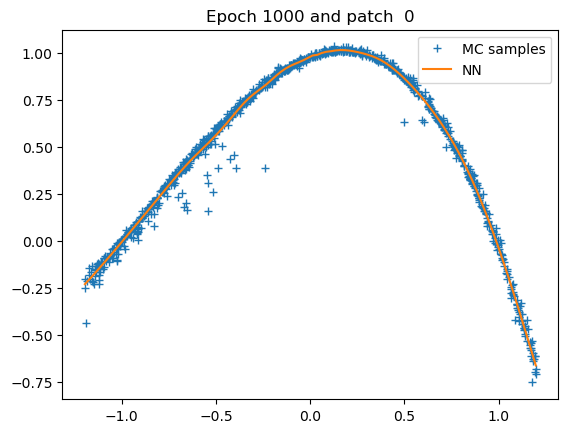

Patch  0: epoch 1500 with loss 1.44E-03


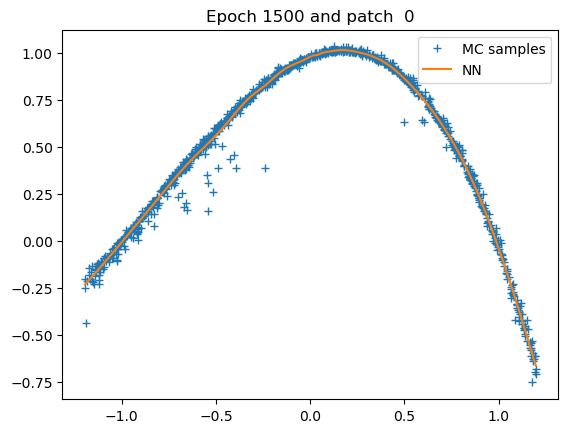

Patch  0: epoch 2000 with loss 1.44E-03


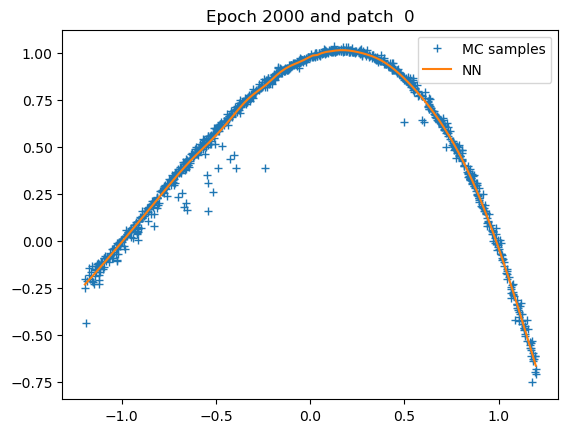

Patch  0: epoch 2500 with loss 1.44E-03


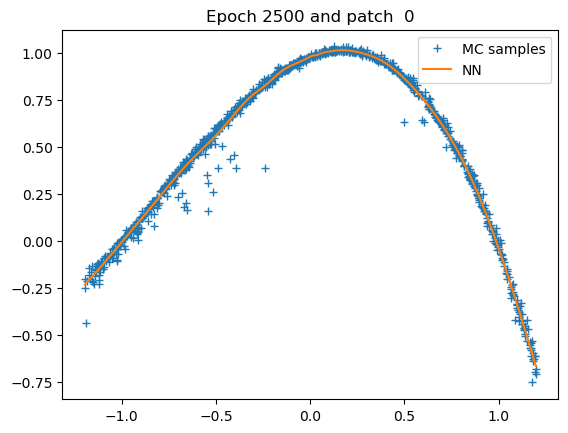

Patch  0: epoch 3000 with loss 1.44E-03


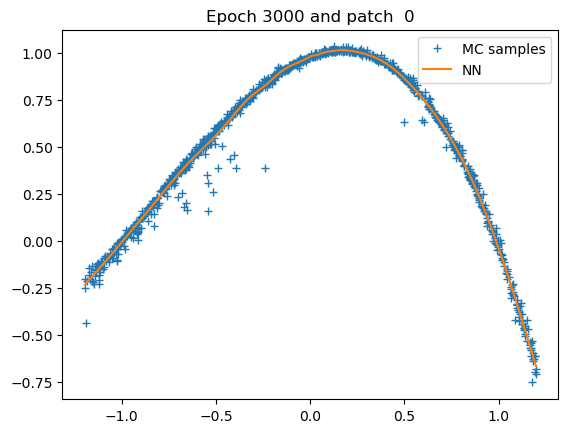

Patch  0: epoch 3500 with loss 1.44E-03


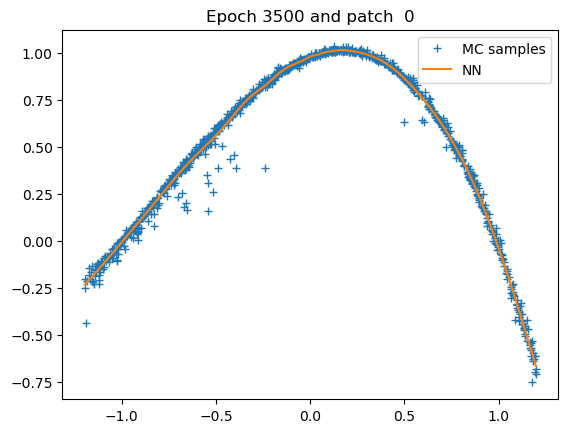

Patch  0: epoch 4000 with loss 1.44E-03


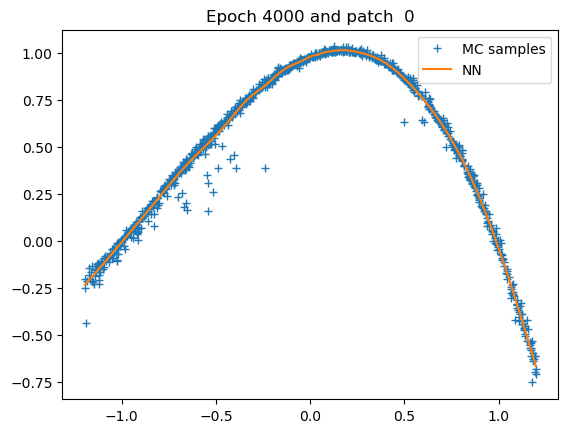

Patch  0: epoch 4500 with loss 1.44E-03


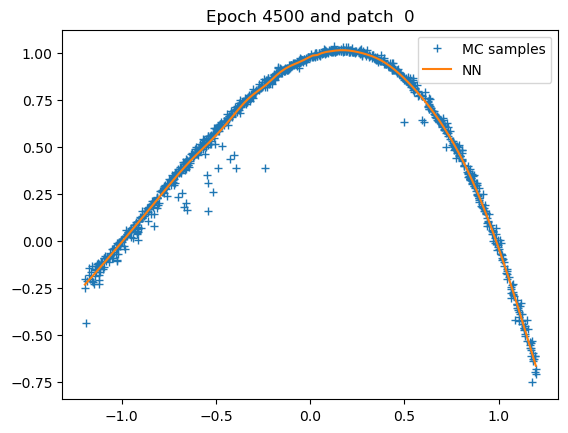

Patch  0: epoch 4999 with loss 1.44E-03


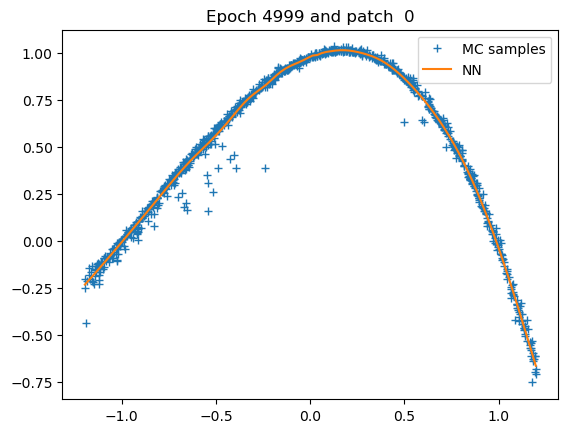

Patch 0: training of u with 5000 epochs take 37.72298455238342 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 184 seconds; L1 error: 2.49E-02; L2 error: 9.32E-04; rel error: INF.
fdb runtime: 52 seconds; total runtime: 236 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


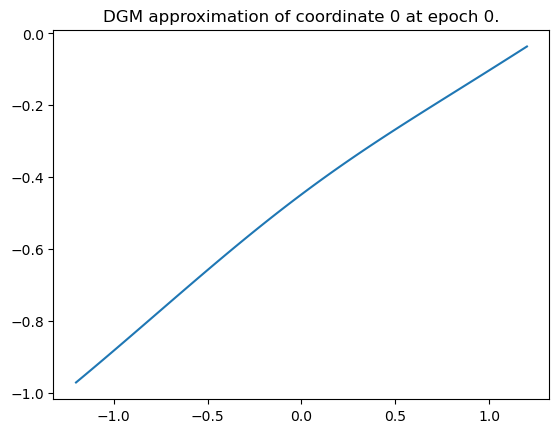

Epoch 0 with loss 17.845863342285156


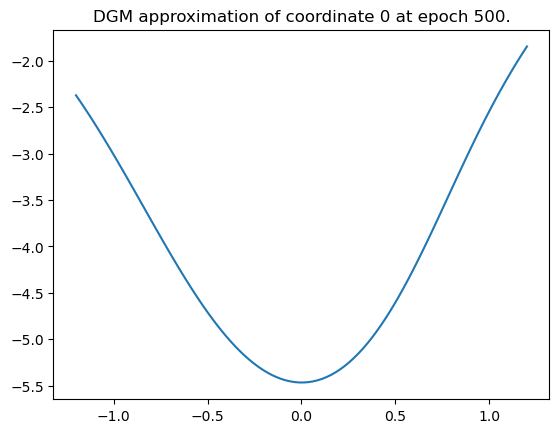

Epoch 500 with loss 14.246413230895996


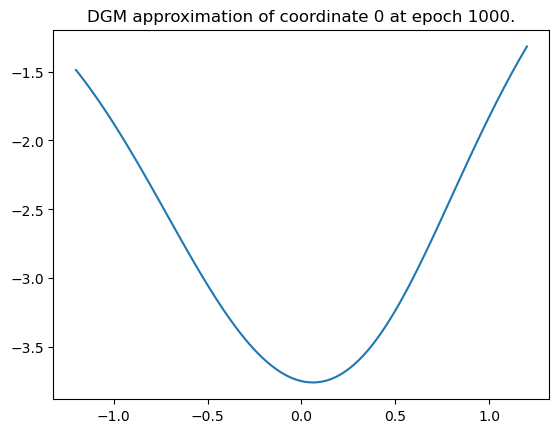

Epoch 1000 with loss 12.818951606750488


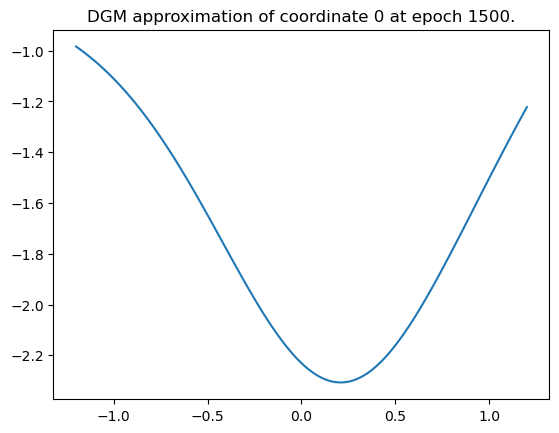

Epoch 1500 with loss 12.135114669799805


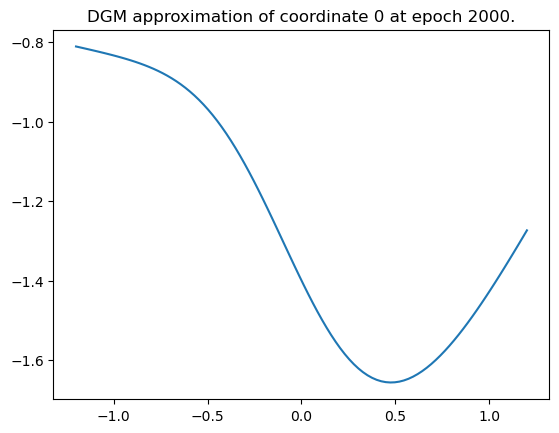

Epoch 2000 with loss 11.645594596862793


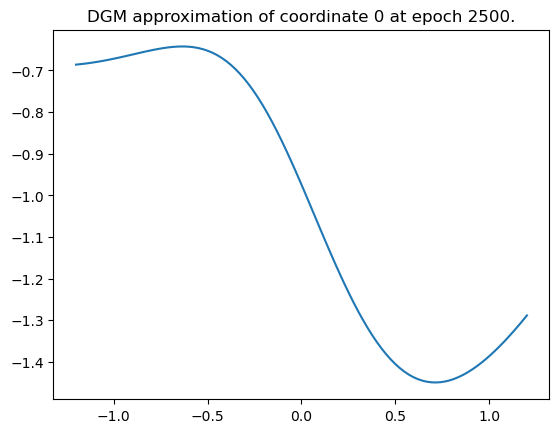

Epoch 2500 with loss 10.771360397338867


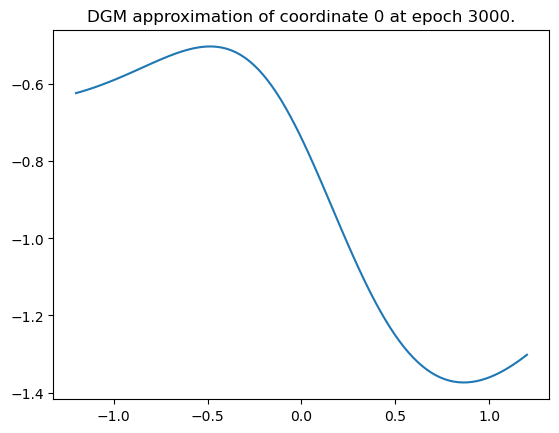

Epoch 3000 with loss 10.80134391784668


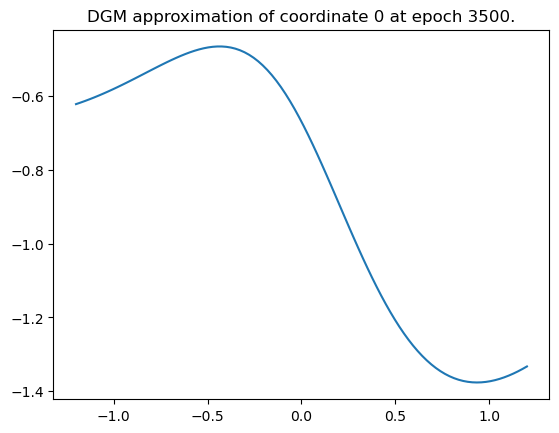

Epoch 3500 with loss 10.85354995727539


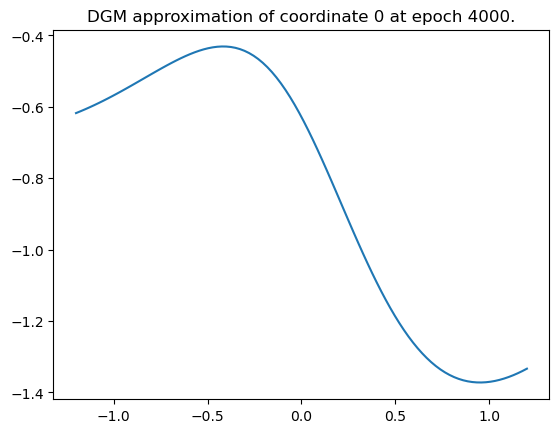

Epoch 4000 with loss 10.409314155578613


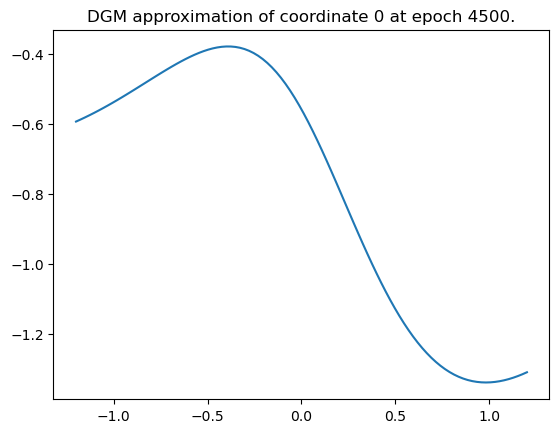

Epoch 4500 with loss 10.599104881286621


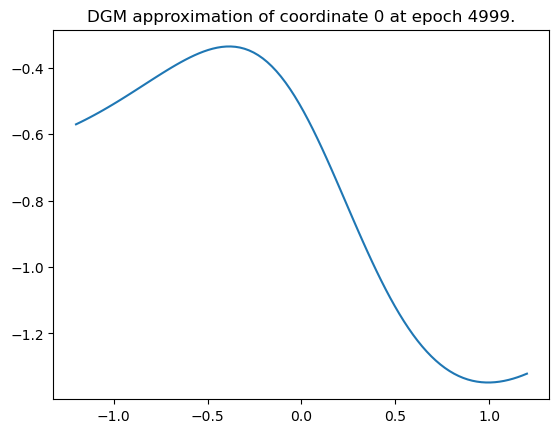

Epoch 4999 with loss 10.918376922607422
Training of neural network with 5000 epochs take 562.453610420227 seconds.


Time taken: 563 seconds; L1 error: 1.35E+00; L2 error: 2.04E+00; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


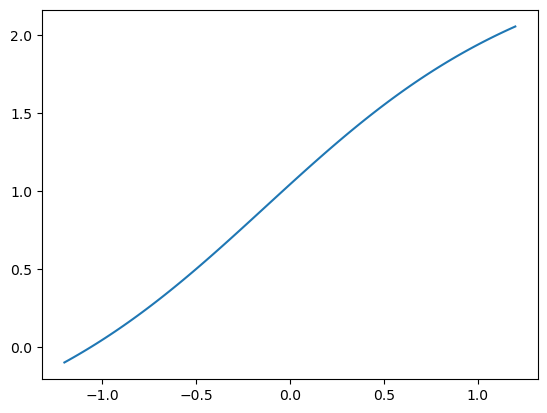

Epoch 0 with loss 1.14840567111969


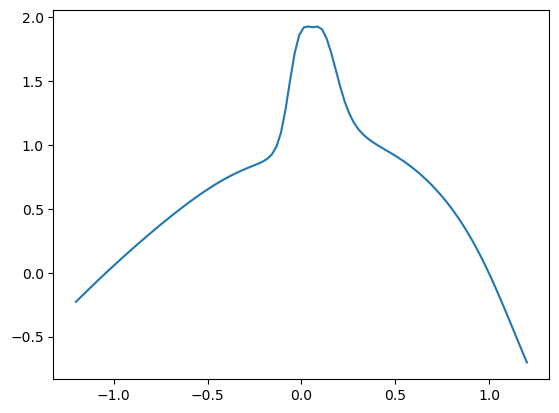

Epoch 500 with loss 0.0011561503633856773


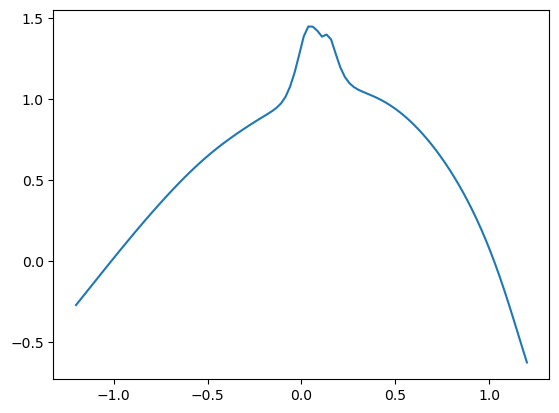

Epoch 1000 with loss 0.004981618840247393


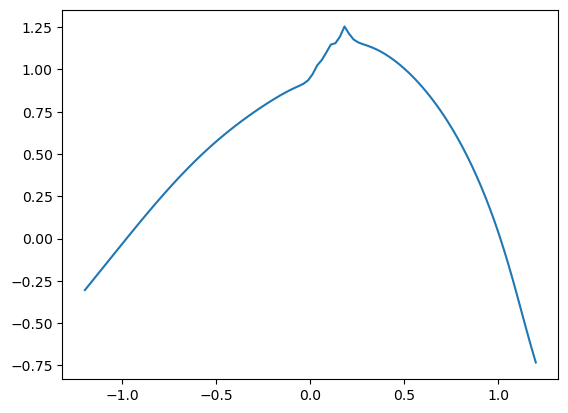

Epoch 1500 with loss 0.00138027872890234


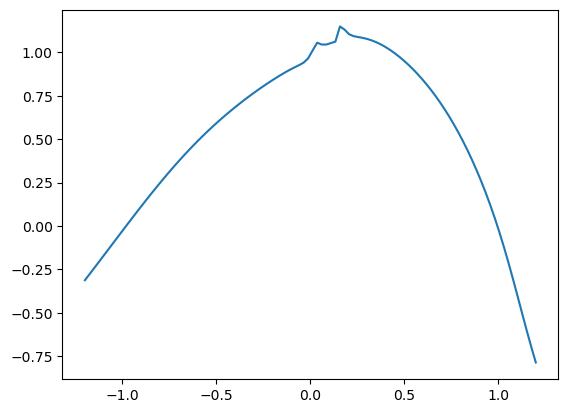

Epoch 2000 with loss 0.0009805927984416485


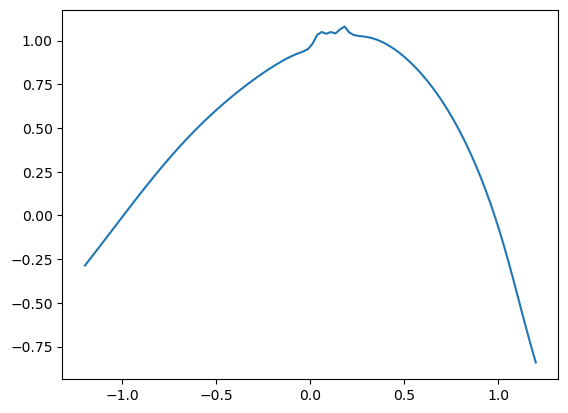

Epoch 2500 with loss 0.0010860948823392391


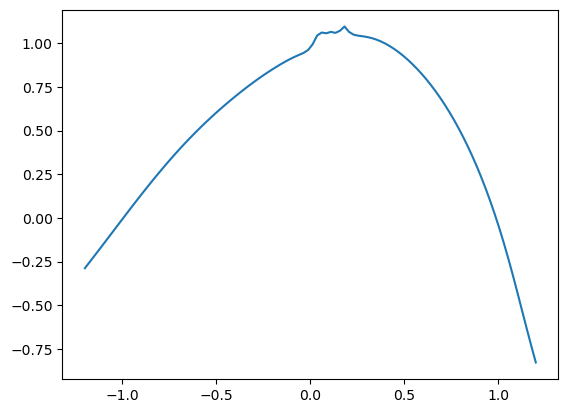

Epoch 3000 with loss 0.0008298318716697395


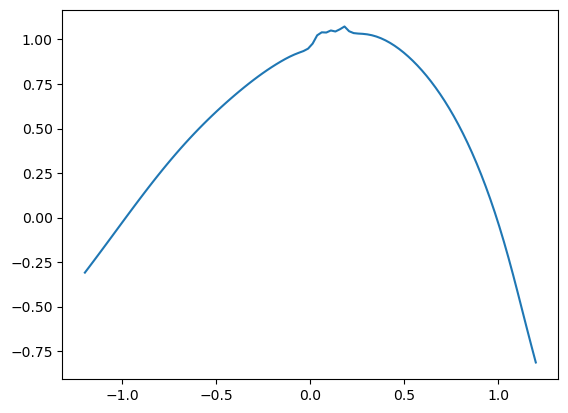

Epoch 3500 with loss 0.0011676744325086474


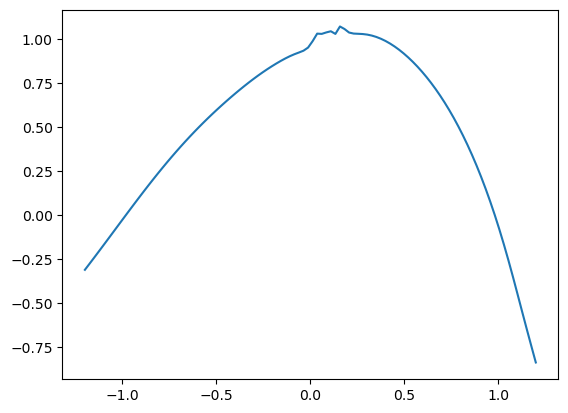

Epoch 4000 with loss 0.0009982251795008779


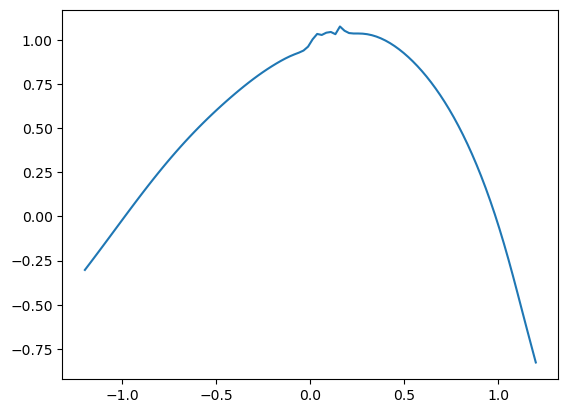

Epoch 4500 with loss 0.0011177699780091643


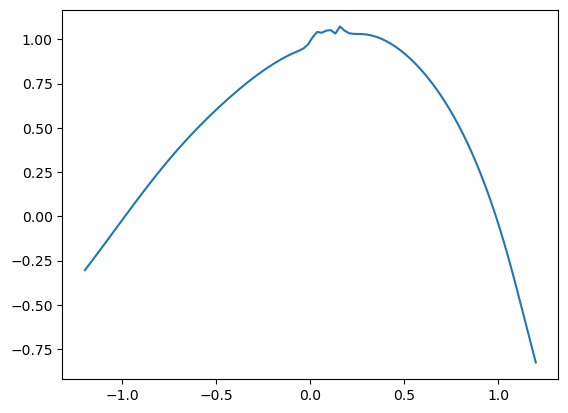

Epoch 4999 with loss 0.0009136053849942982
Training of neural network with 5000 epochs take 240.32573819160461 seconds.
Time taken: 240 seconds; L1 error: 4.22E-02; L2 error: 2.71E-03; rel error: INF.




######## Summary for deep branching method
runtime:        184
fdb runtime:    52
total runtime:  236
mean L1 error:  2.49E-02
std L1 error:   0.00E+00
mean L2 error:  9.32E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        563
mean L1 error:  1.35E+00
std L1 error:   0.00E+00
mean L2 error:  2.04E+00
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        240
mean L1 error:  4.22E-02
std L1 error:   0.00E+00
mean L2 error:  2.71E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


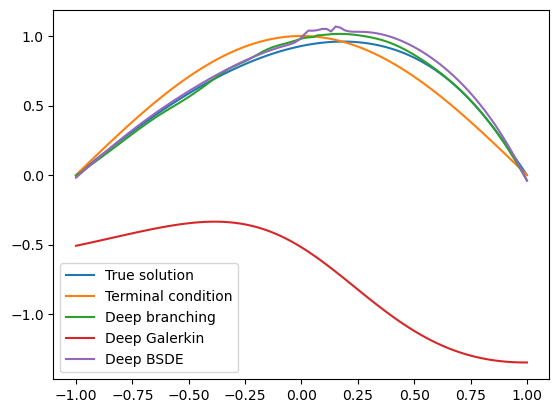

In [16]:
dim = 6
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True,  
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 7

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 274.4414665699005 seconds.
Patch  0: epoch    0 with loss 5.66E-01


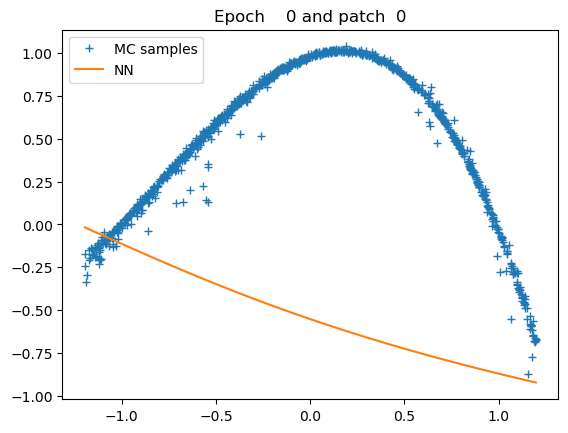

Patch  0: epoch  500 with loss 1.53E-03


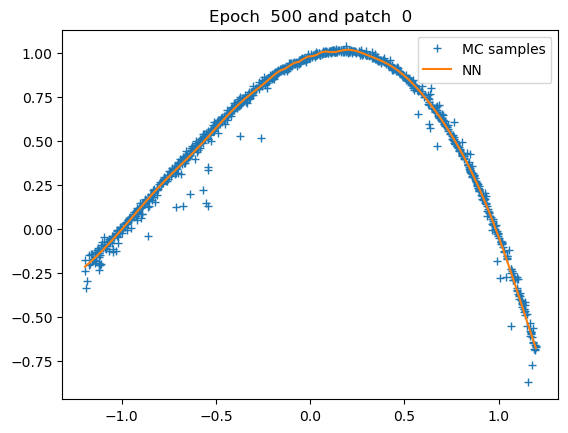

Patch  0: epoch 1000 with loss 1.53E-03


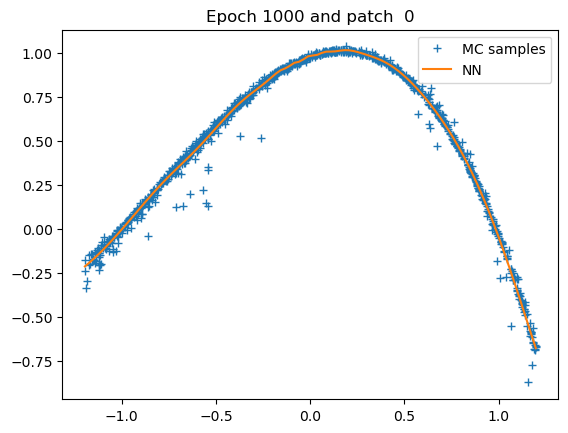

Patch  0: epoch 1500 with loss 1.52E-03


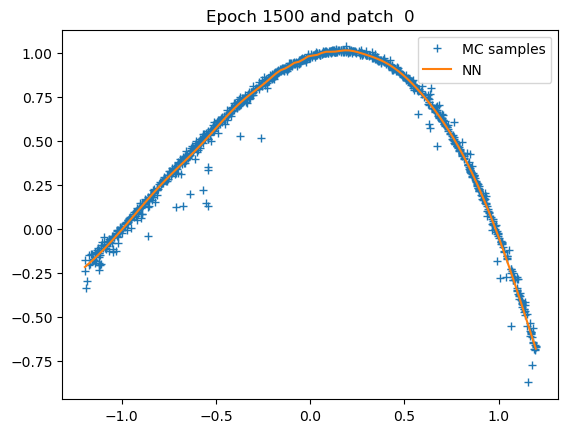

Patch  0: epoch 2000 with loss 1.52E-03


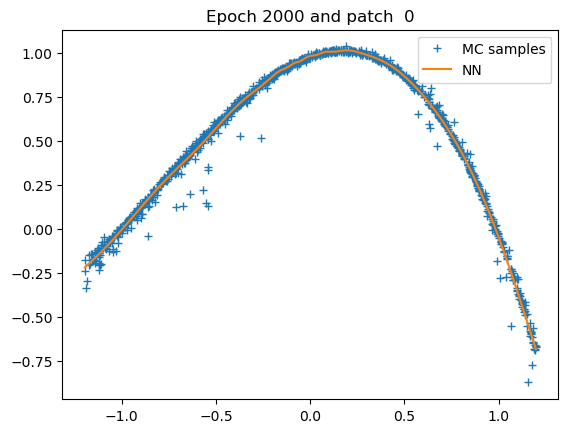

Patch  0: epoch 2500 with loss 1.52E-03


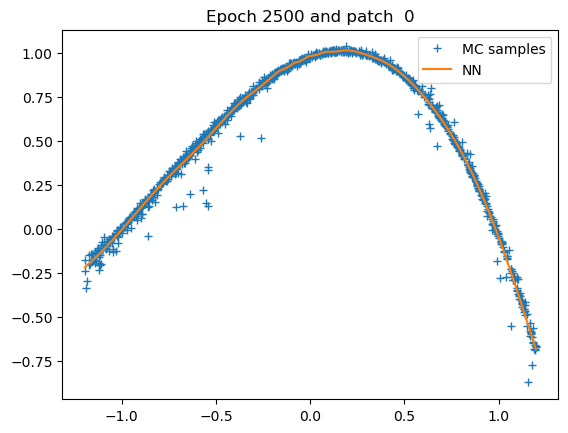

Patch  0: epoch 3000 with loss 1.52E-03


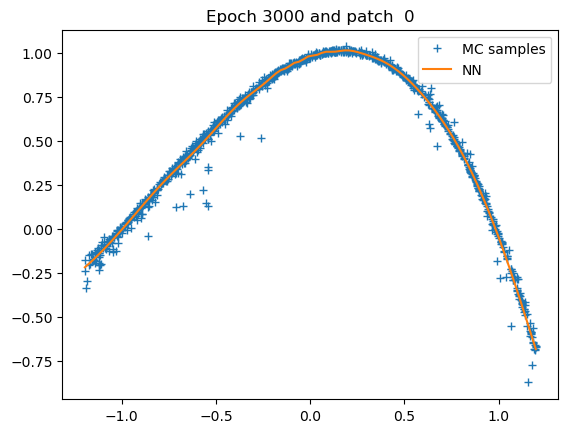

Patch  0: epoch 3500 with loss 1.52E-03


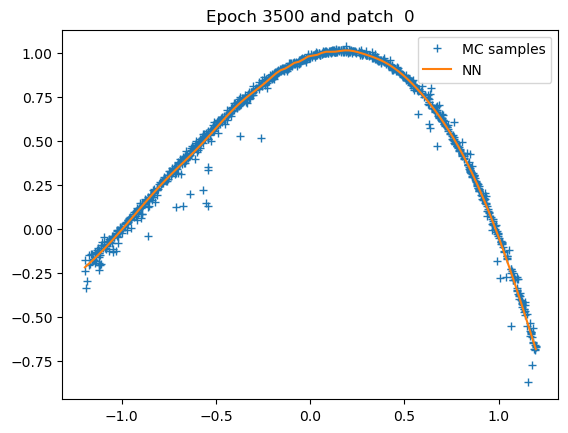

Patch  0: epoch 4000 with loss 1.52E-03


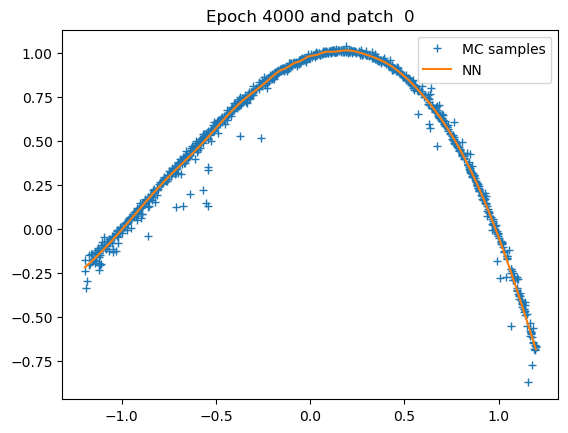

Patch  0: epoch 4500 with loss 1.52E-03


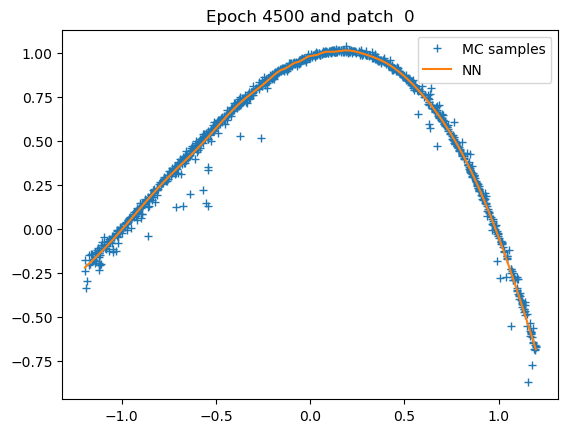

Patch  0: epoch 4999 with loss 1.52E-03


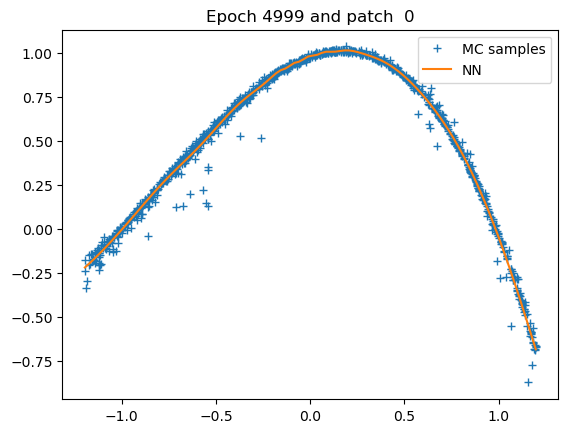

Patch 0: training of u with 5000 epochs take 37.57776689529419 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 240 seconds; L1 error: 2.56E-02; L2 error: 9.75E-04; rel error: INF.
fdb runtime: 73 seconds; total runtime: 313 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


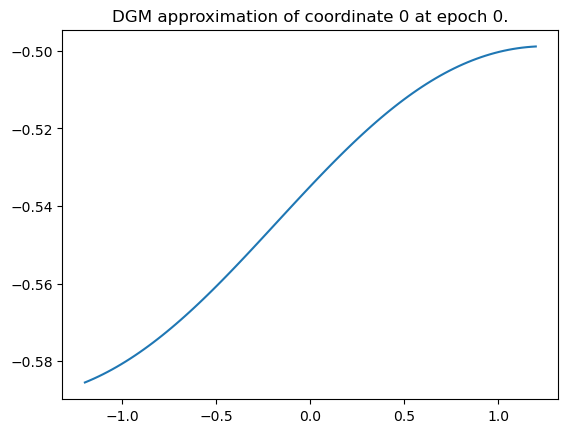

Epoch 0 with loss 25.604040145874023


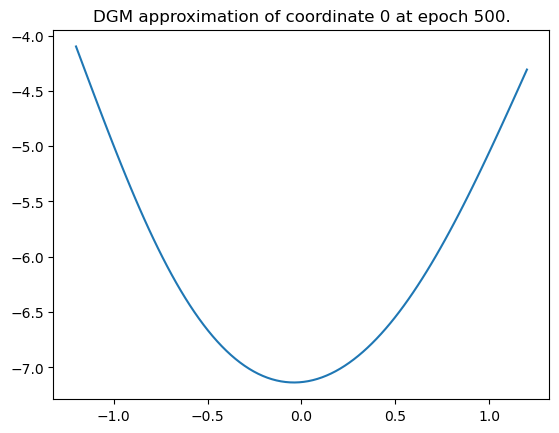

Epoch 500 with loss 20.139450073242188


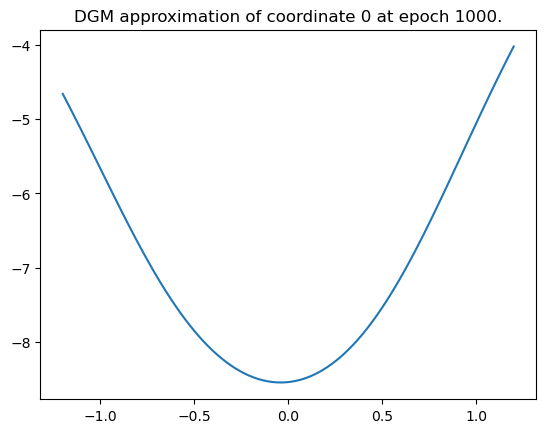

Epoch 1000 with loss 20.322668075561523


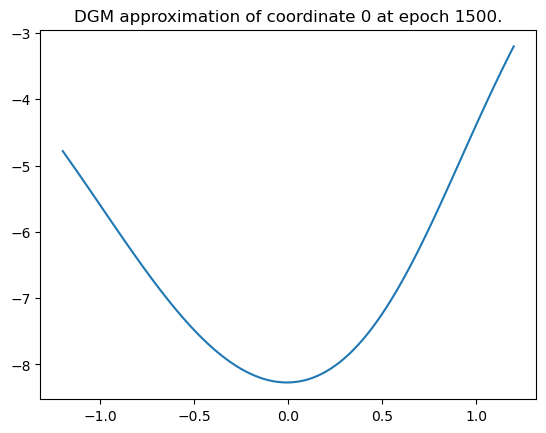

Epoch 1500 with loss 19.311840057373047


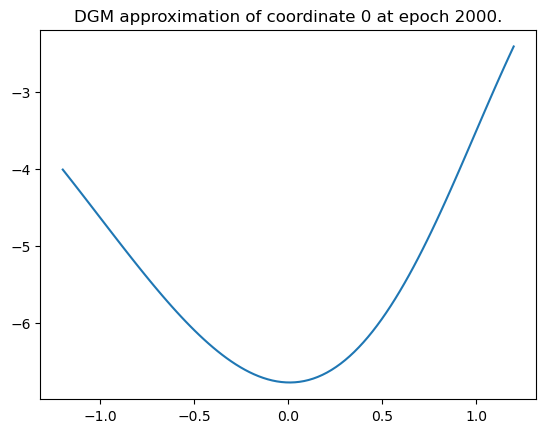

Epoch 2000 with loss 19.436546325683594


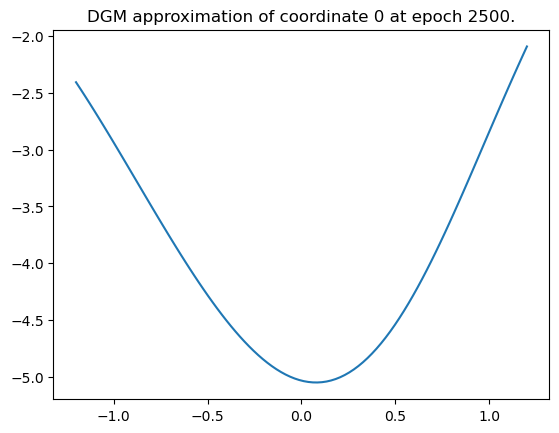

Epoch 2500 with loss 17.996109008789062


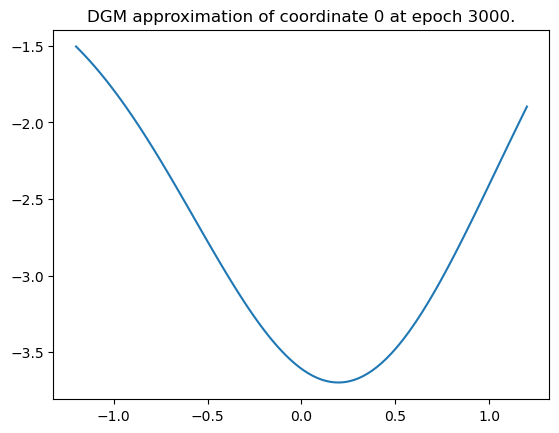

Epoch 3000 with loss 16.52005386352539


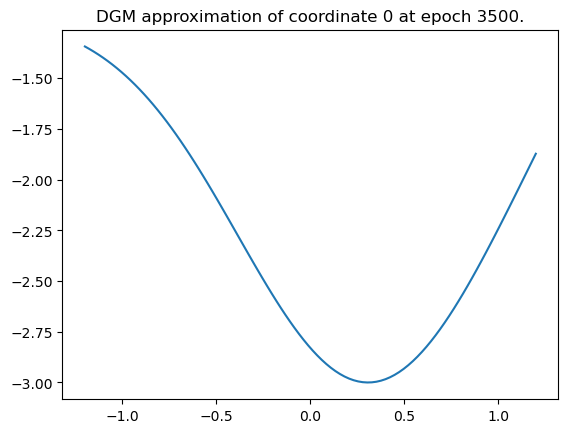

Epoch 3500 with loss 15.725940704345703


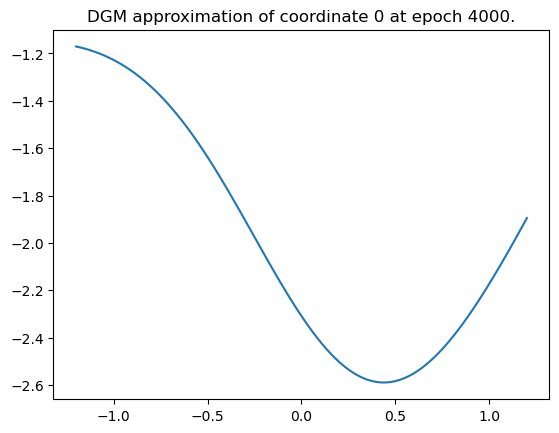

Epoch 4000 with loss 16.2873477935791


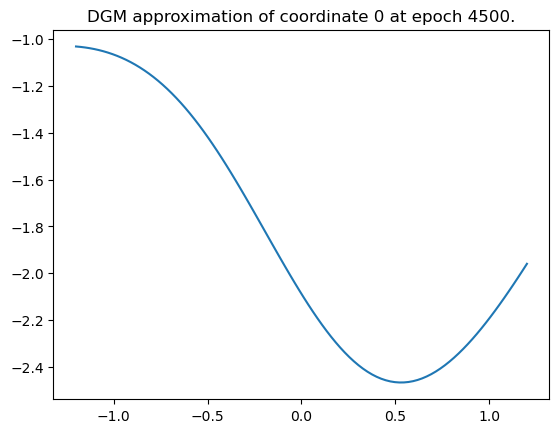

Epoch 4500 with loss 15.986715316772461


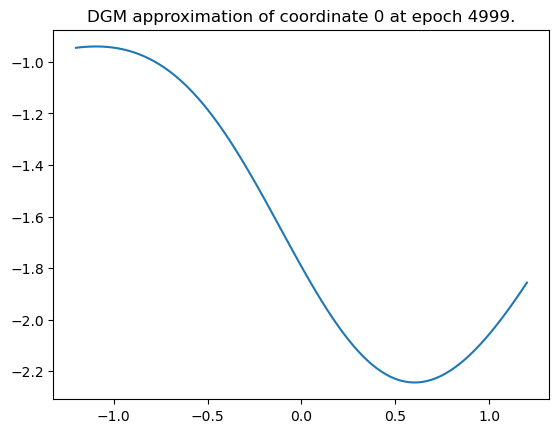

Epoch 4999 with loss 15.913761138916016
Training of neural network with 5000 epochs take 614.2255721092224 seconds.


Time taken: 614 seconds; L1 error: 2.31E+00; L2 error: 5.78E+00; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


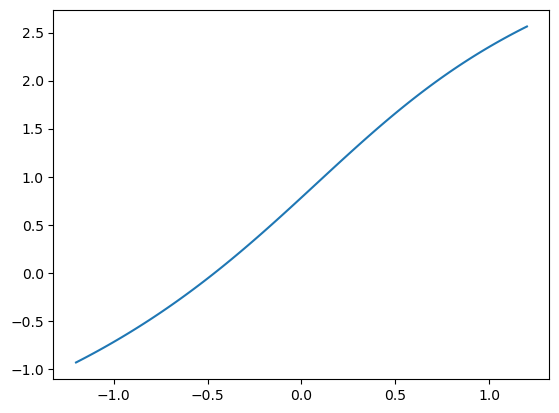

Epoch 0 with loss 0.680026650428772


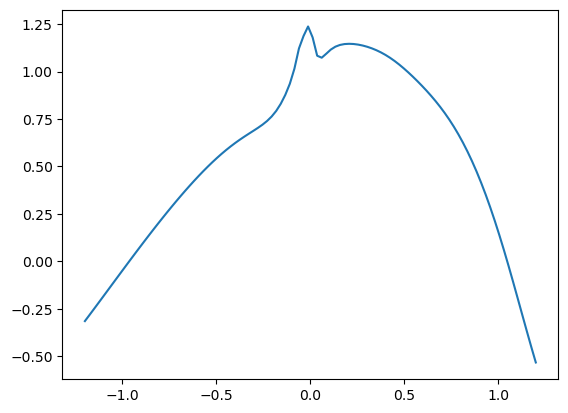

Epoch 500 with loss 0.00391837302595377


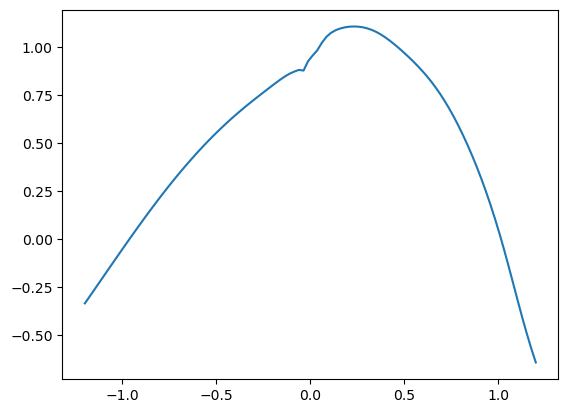

Epoch 1000 with loss 0.0018520815065130591


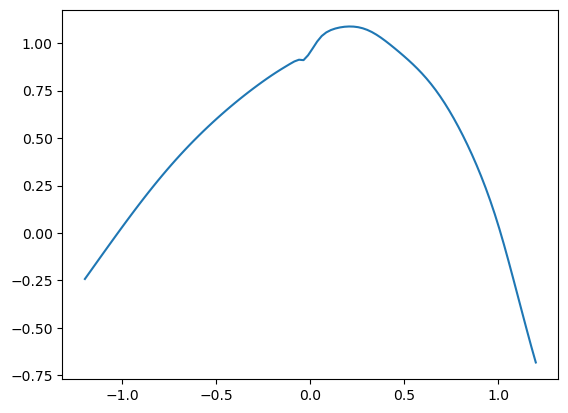

Epoch 1500 with loss 0.0017520368564873934


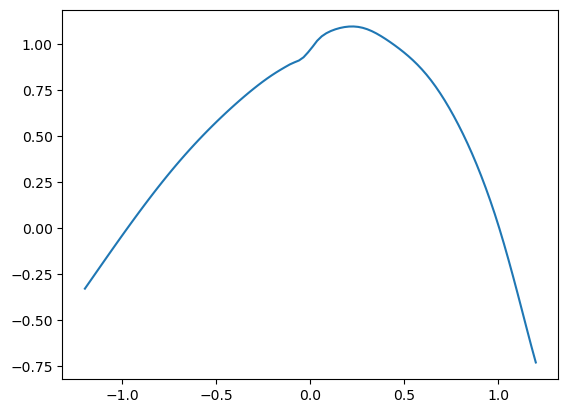

Epoch 2000 with loss 0.0012310787569731474


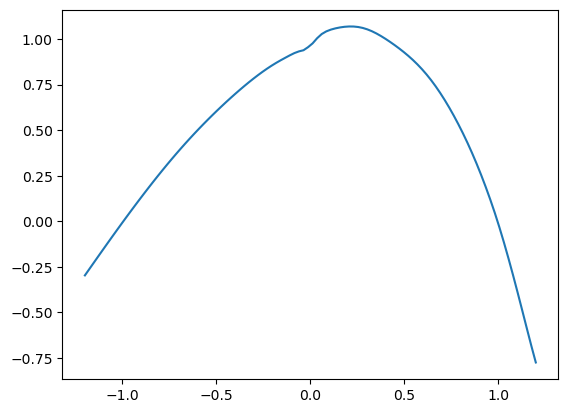

Epoch 2500 with loss 0.0008773458539508283


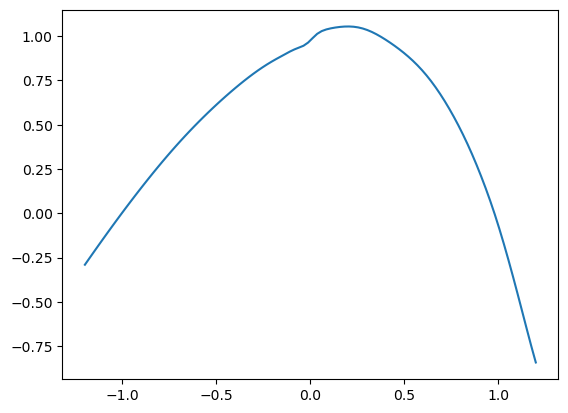

Epoch 3000 with loss 0.0019344629254192114


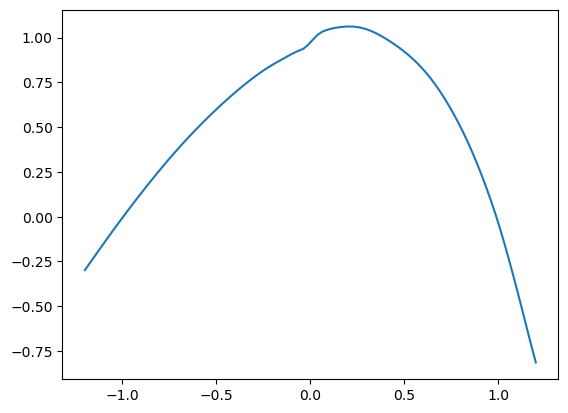

Epoch 3500 with loss 0.0005651865503750741


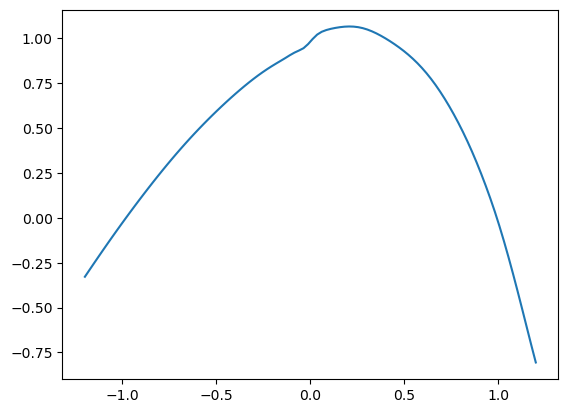

Epoch 4000 with loss 0.0008087693131528795


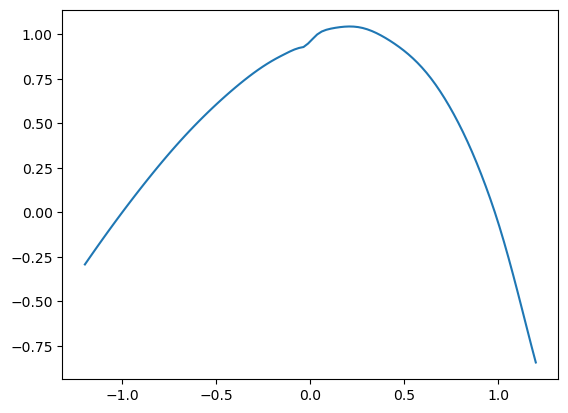

Epoch 4500 with loss 0.0008947812020778656


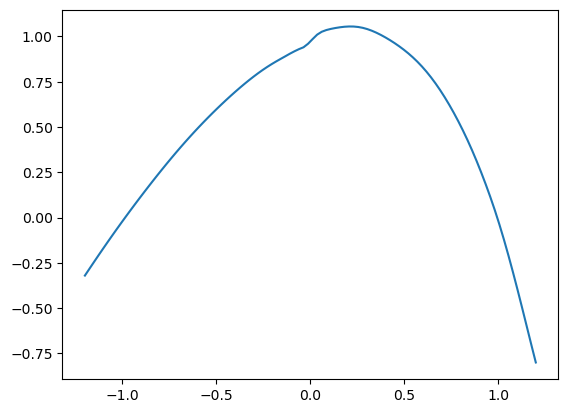

Epoch 4999 with loss 0.0017081019468605518
Training of neural network with 5000 epochs take 231.28276920318604 seconds.
Time taken: 231 seconds; L1 error: 4.30E-02; L2 error: 3.01E-03; rel error: INF.




######## Summary for deep branching method
runtime:        240
fdb runtime:    73
total runtime:  313
mean L1 error:  2.56E-02
std L1 error:   0.00E+00
mean L2 error:  9.75E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        614
mean L1 error:  2.31E+00
std L1 error:   0.00E+00
mean L2 error:  5.78E+00
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        231
mean L1 error:  4.30E-02
std L1 error:   0.00E+00
mean L2 error:  3.01E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


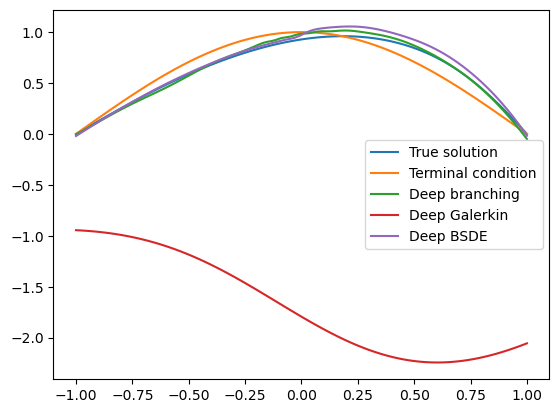

In [17]:
dim = 7
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 8

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 382.47873735427856 seconds.
Patch  0: epoch    0 with loss 2.69E+00


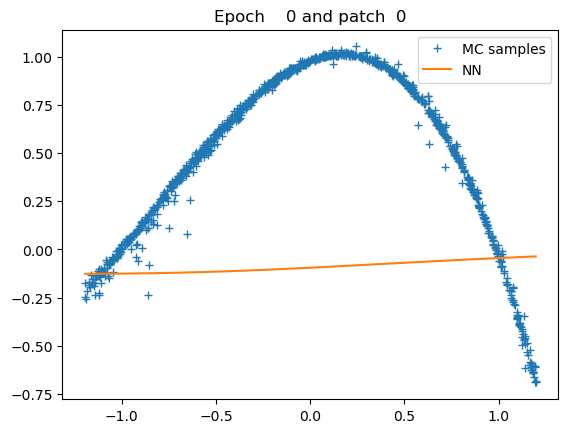

Patch  0: epoch  500 with loss 8.80E-04


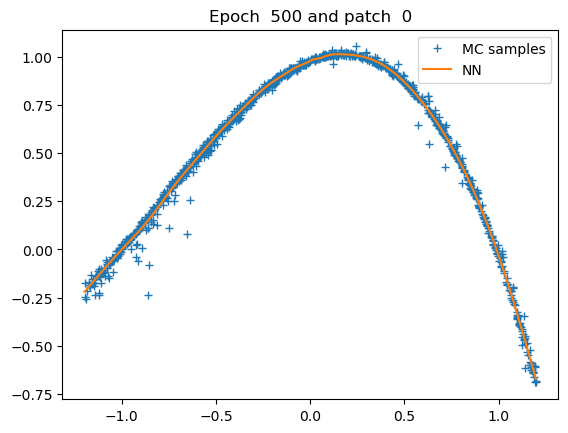

Patch  0: epoch 1000 with loss 8.73E-04


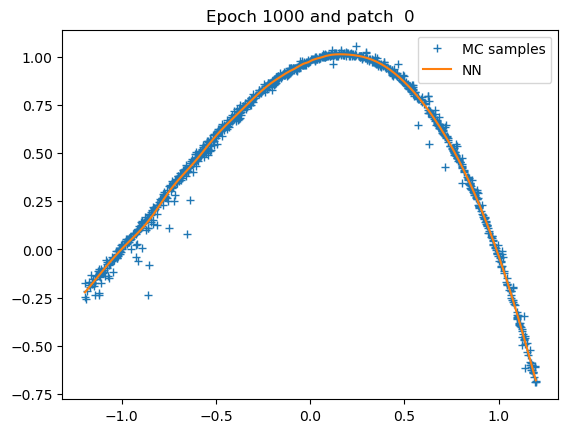

Patch  0: epoch 1500 with loss 8.73E-04


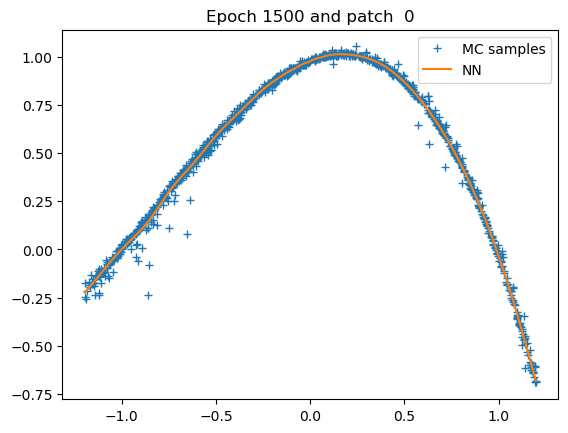

Patch  0: epoch 2000 with loss 8.72E-04


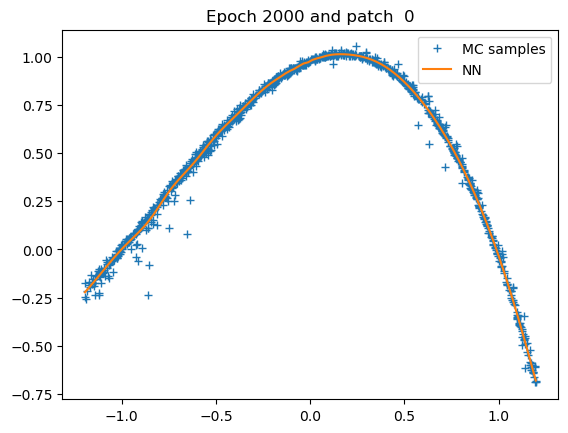

Patch  0: epoch 2500 with loss 8.71E-04


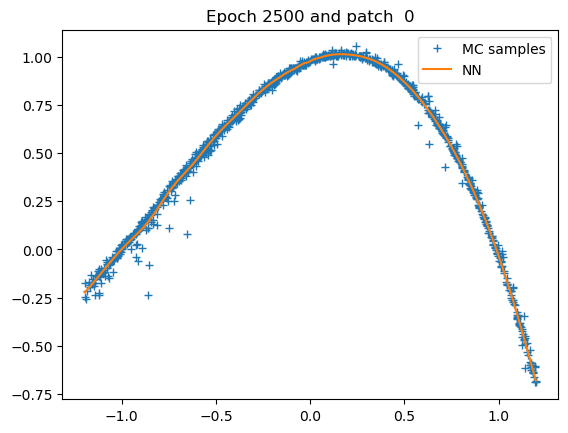

Patch  0: epoch 3000 with loss 8.71E-04


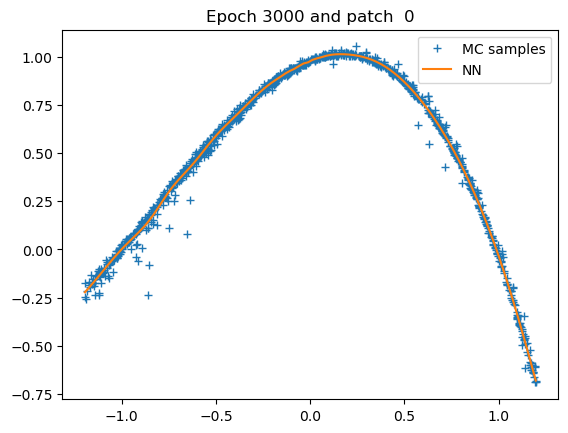

Patch  0: epoch 3500 with loss 8.71E-04


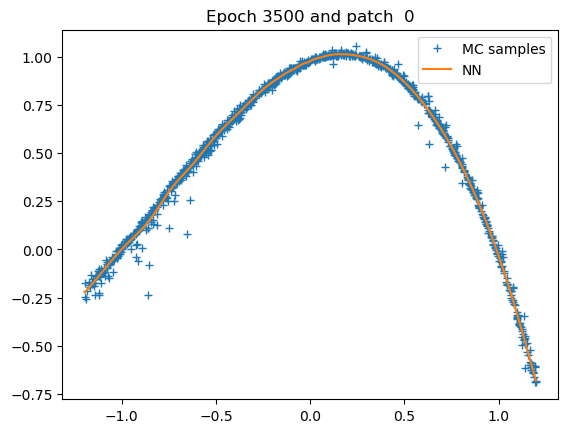

Patch  0: epoch 4000 with loss 8.71E-04


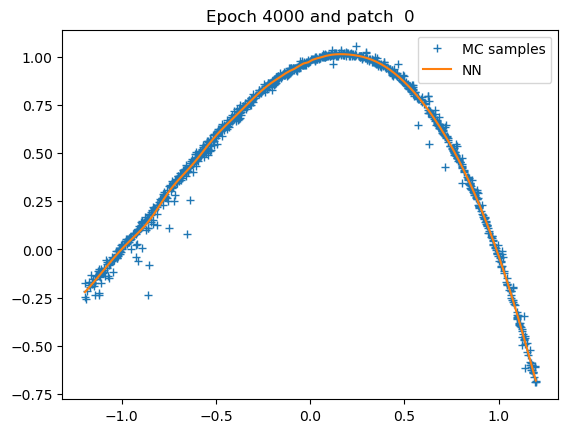

Patch  0: epoch 4500 with loss 8.70E-04


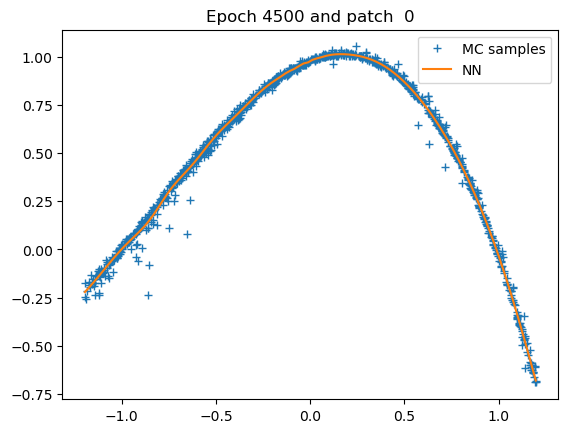

Patch  0: epoch 4999 with loss 8.70E-04


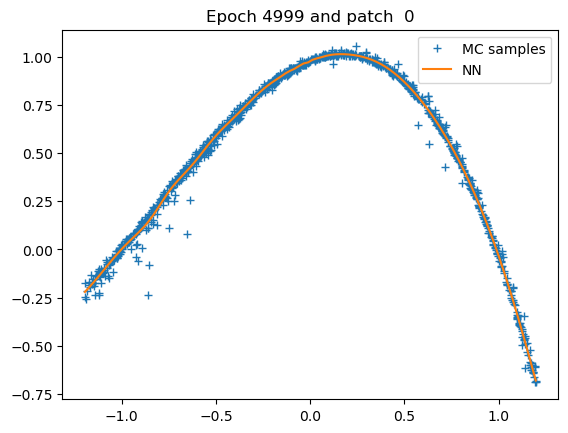

Patch 0: training of u with 5000 epochs take 38.21415901184082 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 294 seconds; L1 error: 2.56E-02; L2 error: 9.62E-04; rel error: INF.
fdb runtime: 128 seconds; total runtime: 422 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


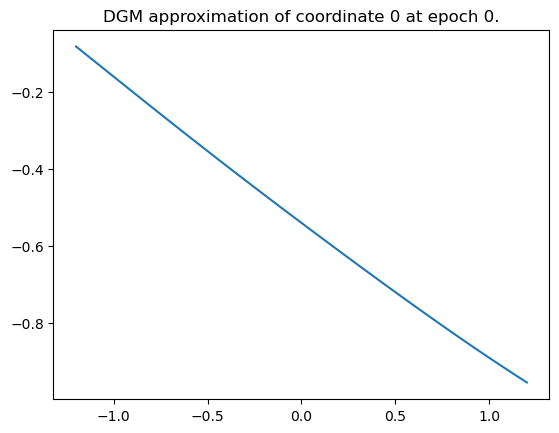

Epoch 0 with loss 33.630916595458984


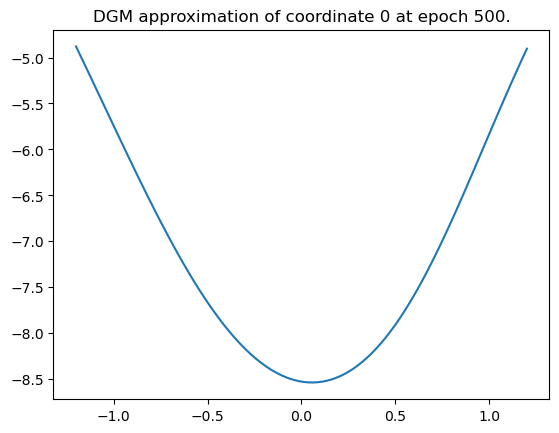

Epoch 500 with loss 27.18885040283203


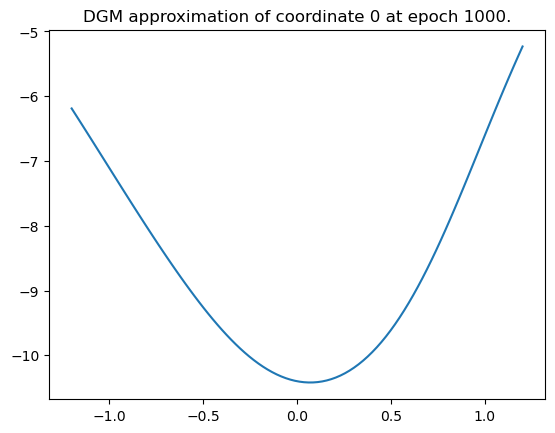

Epoch 1000 with loss 26.768169403076172


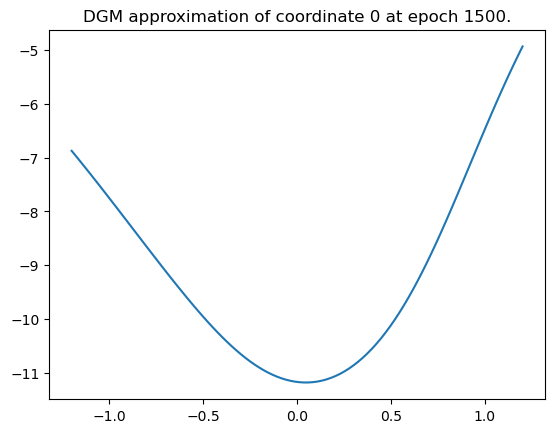

Epoch 1500 with loss 27.535118103027344


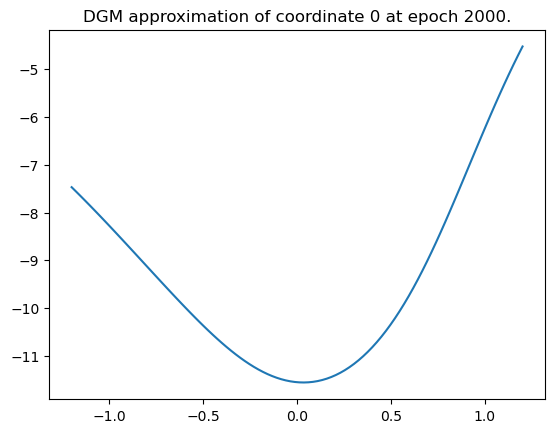

Epoch 2000 with loss 27.212318420410156


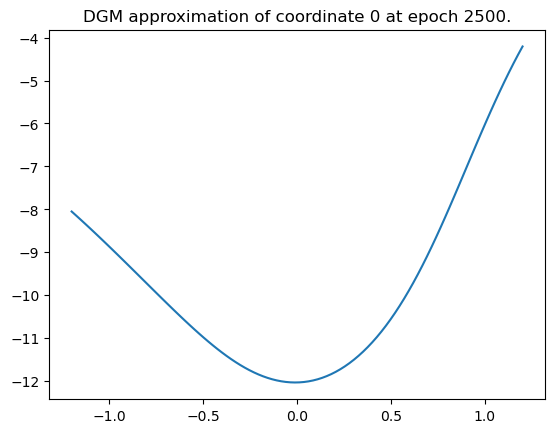

Epoch 2500 with loss 26.567611694335938


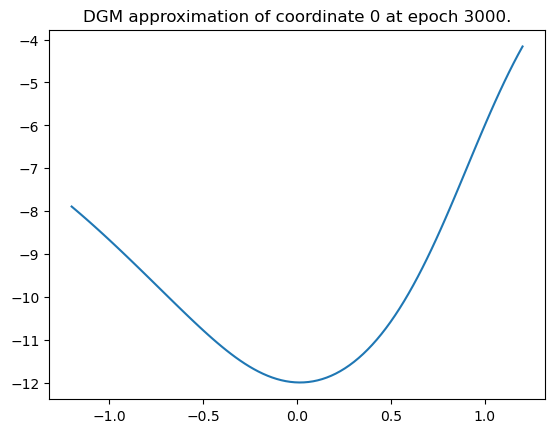

Epoch 3000 with loss 27.775972366333008


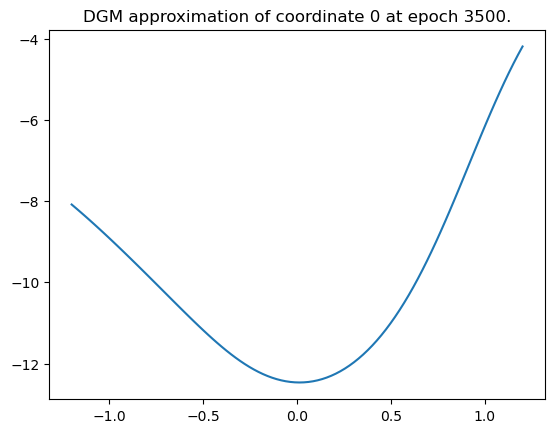

Epoch 3500 with loss 26.125003814697266


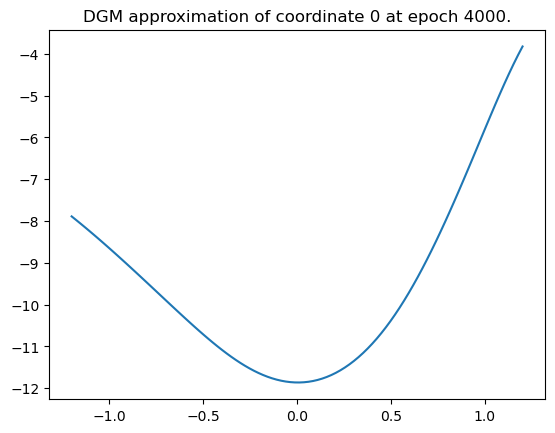

Epoch 4000 with loss 24.859176635742188


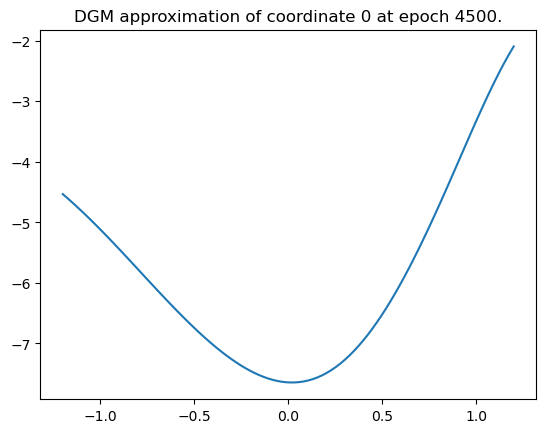

Epoch 4500 with loss 26.104507446289062


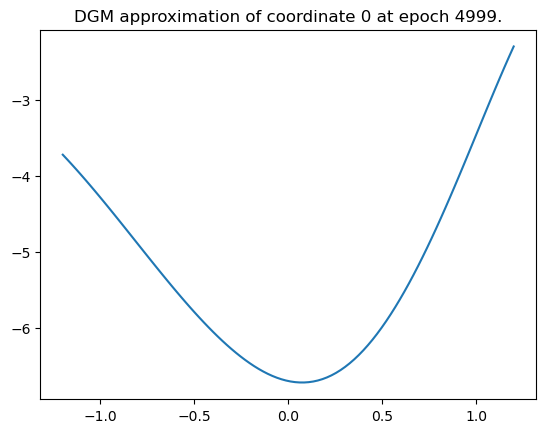

Epoch 4999 with loss 23.646839141845703
Training of neural network with 5000 epochs take 708.9395747184753 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


Time taken: 709 seconds; L1 error: 6.29E+00; L2 error: 4.09E+01; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


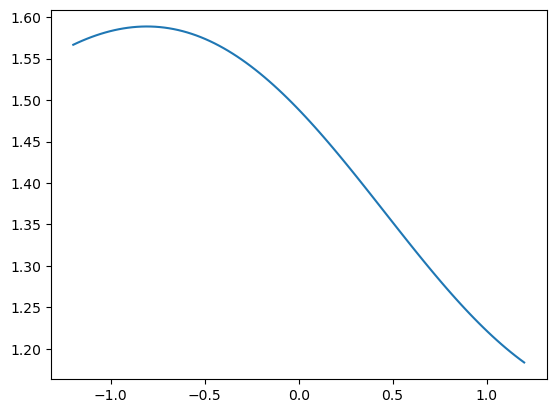

Epoch 0 with loss 1.3508689403533936


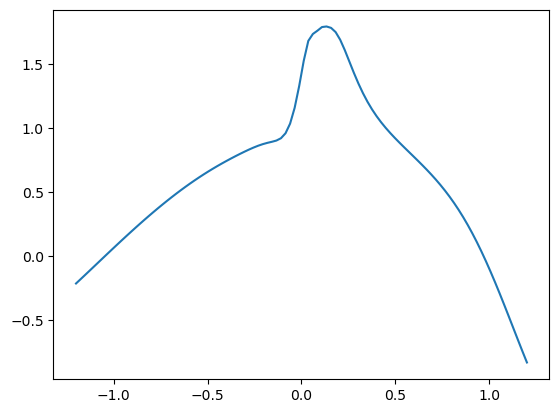

Epoch 500 with loss 0.0030808807350695133


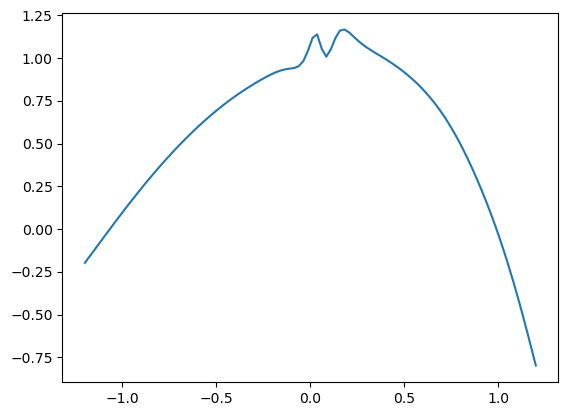

Epoch 1000 with loss 0.002639275509864092


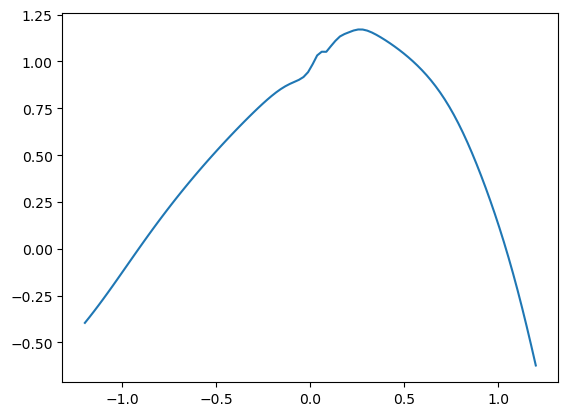

Epoch 1500 with loss 0.0008053684141486883


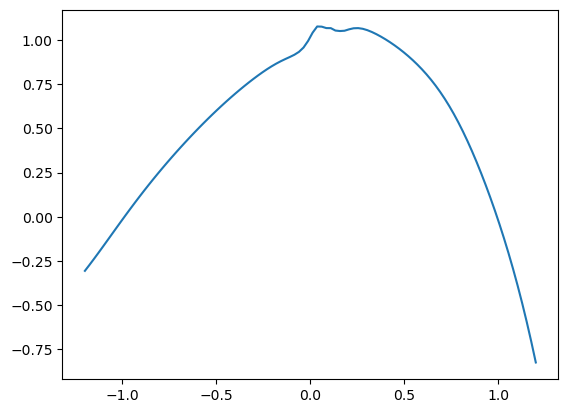

Epoch 2000 with loss 0.0012728498550131917


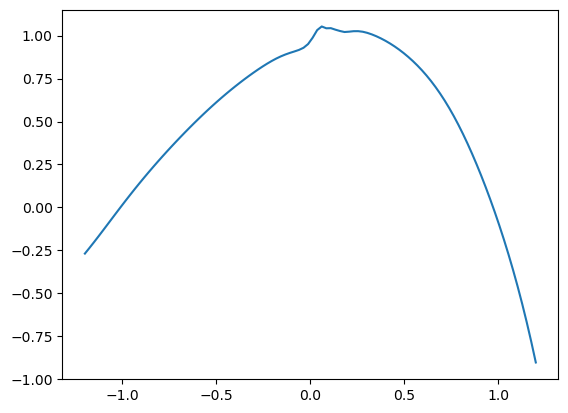

Epoch 2500 with loss 0.000723775418009609


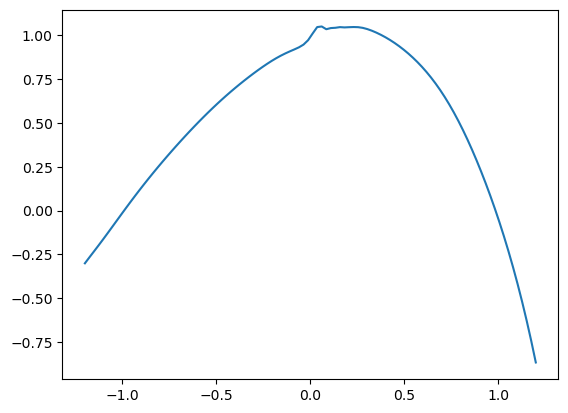

Epoch 3000 with loss 0.0017907884903252125


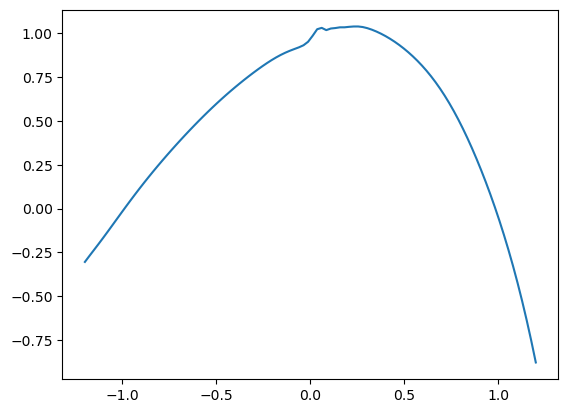

Epoch 3500 with loss 0.0007929927669465542


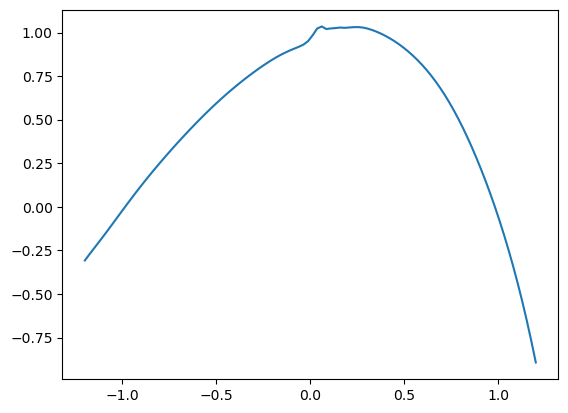

Epoch 4000 with loss 0.0006175754242576659


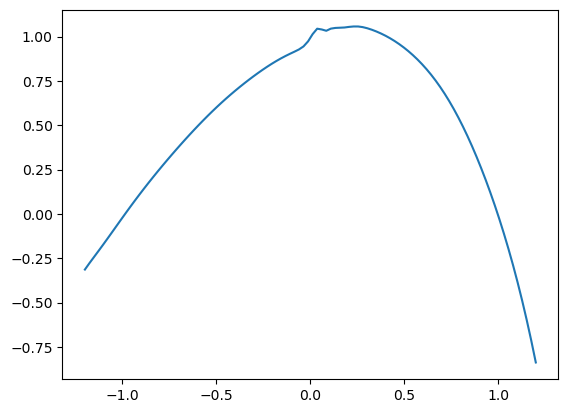

Epoch 4500 with loss 0.0009308818262070417


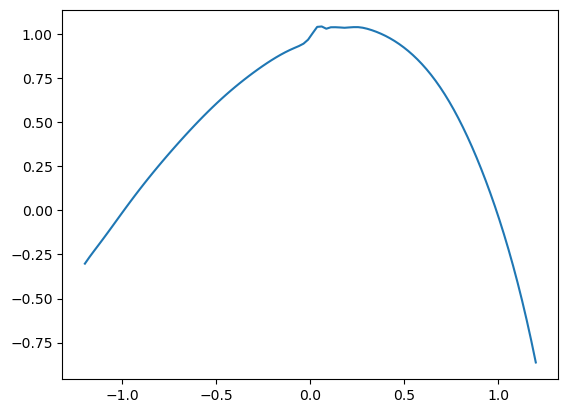

Epoch 4999 with loss 0.0007684773299843073
Training of neural network with 5000 epochs take 235.3149492740631 seconds.
Time taken: 235 seconds; L1 error: 4.18E-02; L2 error: 2.64E-03; rel error: INF.




######## Summary for deep branching method
runtime:        294
fdb runtime:    128
total runtime:  422
mean L1 error:  2.56E-02
std L1 error:   0.00E+00
mean L2 error:  9.62E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        709
mean L1 error:  6.29E+00
std L1 error:   0.00E+00
mean L2 error:  4.09E+01
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        235
mean L1 error:  4.18E-02
std L1 error:   0.00E+00
mean L2 error:  2.64E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


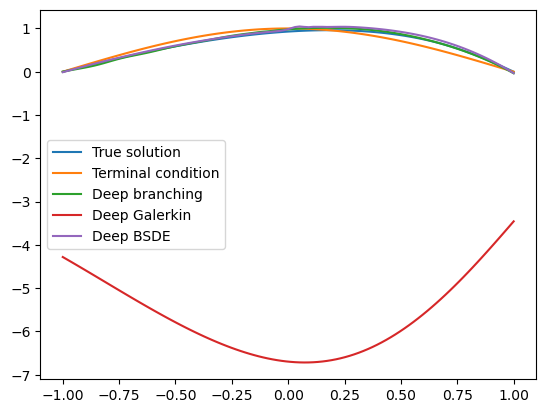

In [18]:
dim = 8
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True,  
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 9

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 504.3003284931183 seconds.
Patch  0: epoch    0 with loss 1.41E+00


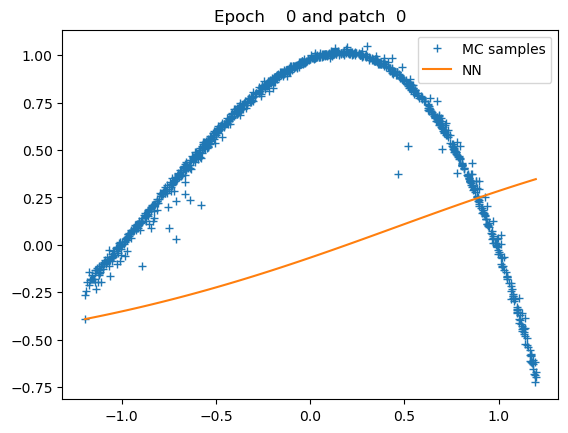

Patch  0: epoch  500 with loss 1.15E-03


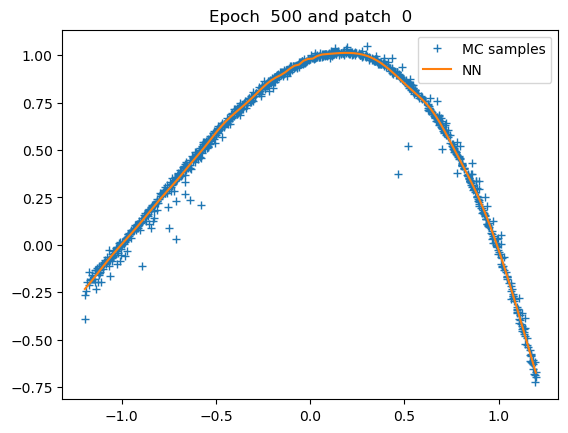

Patch  0: epoch 1000 with loss 2.44E-03


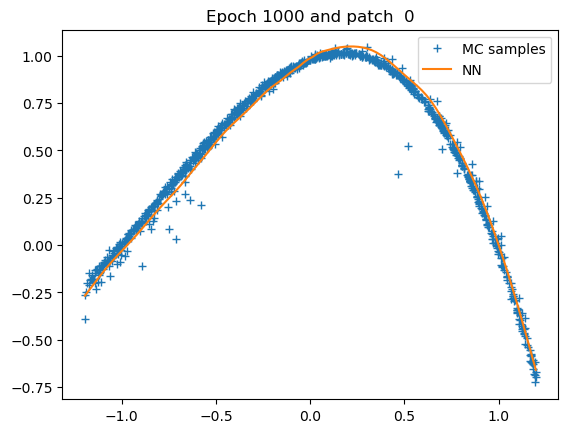

Patch  0: epoch 1500 with loss 1.15E-03


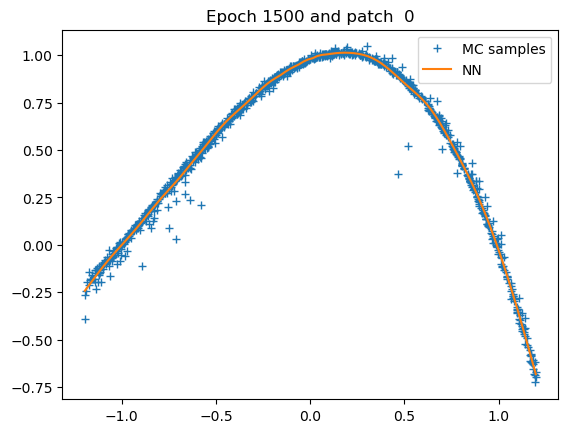

Patch  0: epoch 2000 with loss 1.15E-03


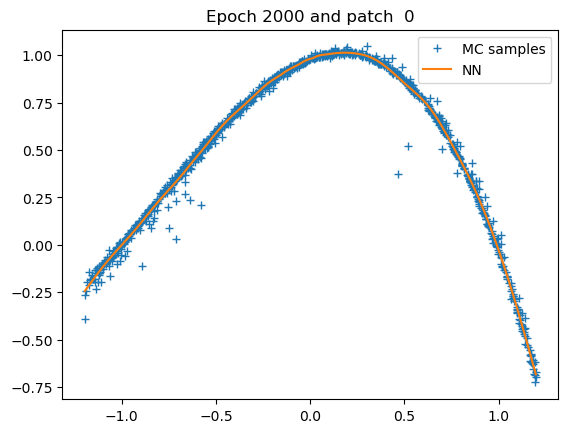

Patch  0: epoch 2500 with loss 1.15E-03


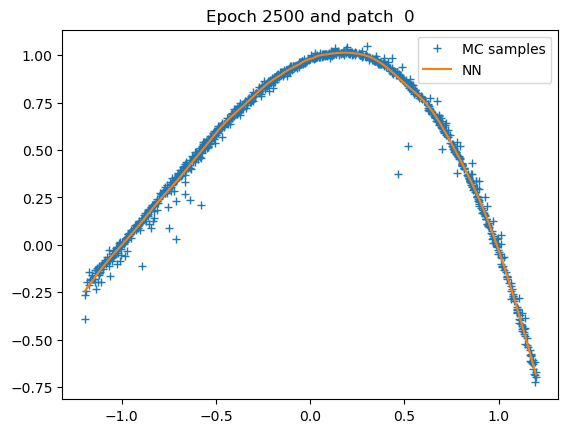

Patch  0: epoch 3000 with loss 1.15E-03


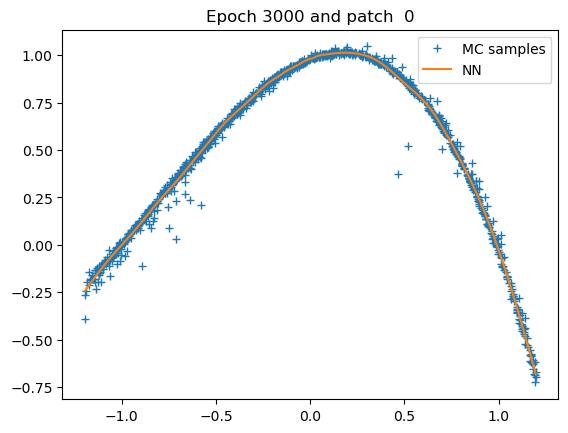

Patch  0: epoch 3500 with loss 1.15E-03


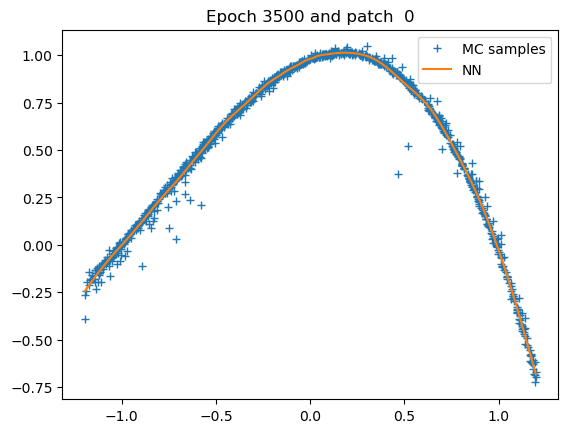

Patch  0: epoch 4000 with loss 1.15E-03


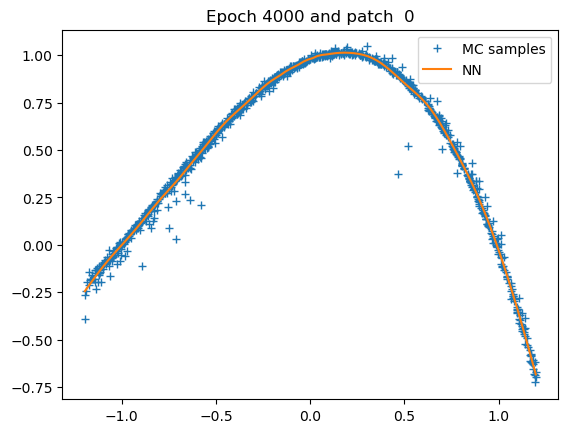

Patch  0: epoch 4500 with loss 1.15E-03


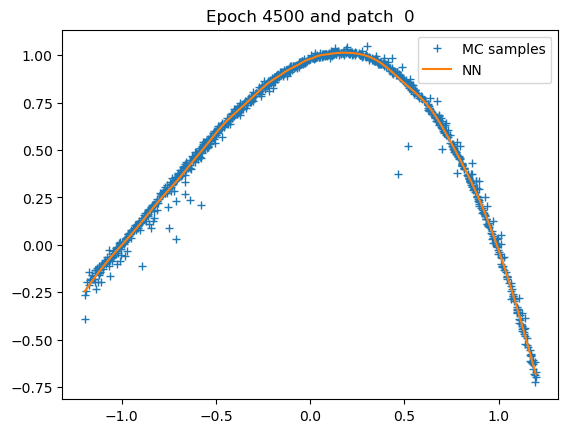

Patch  0: epoch 4999 with loss 1.15E-03


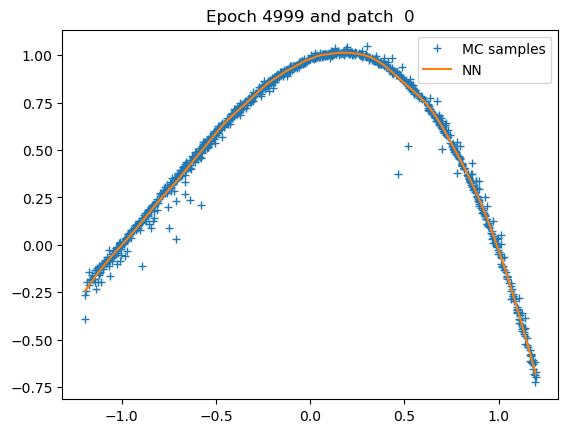

Patch 0: training of u with 5000 epochs take 40.111608028411865 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 355 seconds; L1 error: 2.45E-02; L2 error: 9.19E-04; rel error: INF.
fdb runtime: 192 seconds; total runtime: 546 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


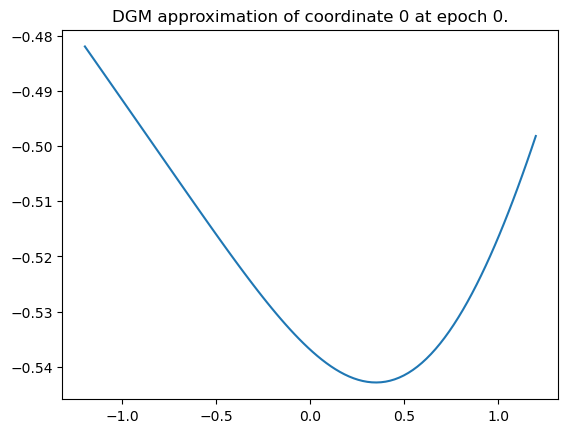

Epoch 0 with loss 44.2150764465332


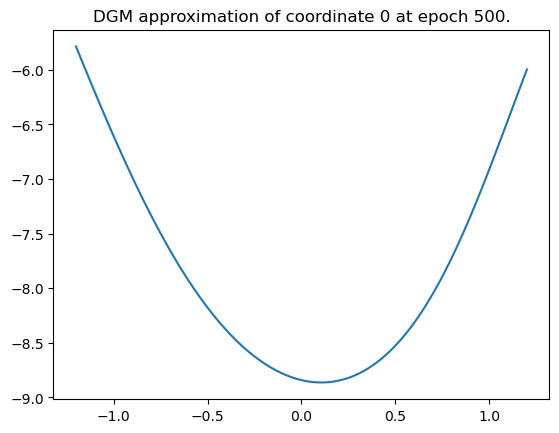

Epoch 500 with loss 36.24036407470703


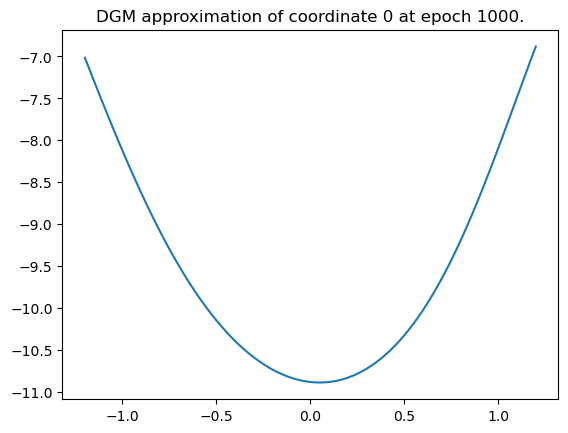

Epoch 1000 with loss 35.97060012817383


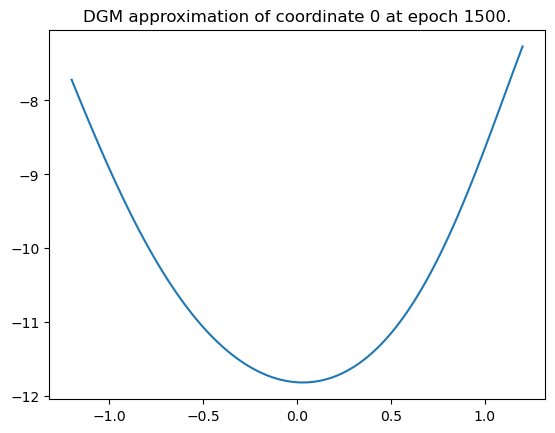

Epoch 1500 with loss 34.58805847167969


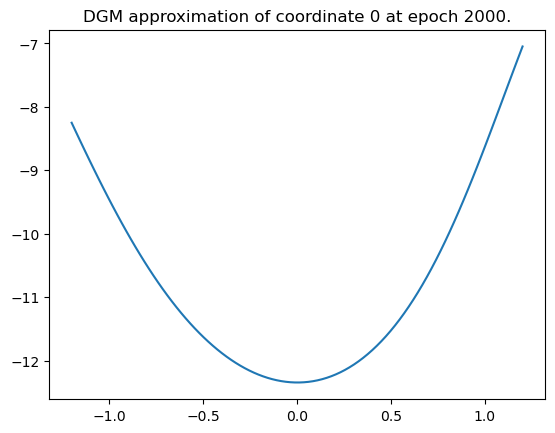

Epoch 2000 with loss 34.11783218383789


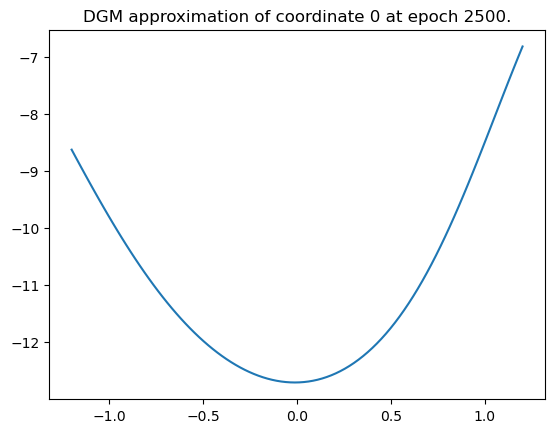

Epoch 2500 with loss 33.023128509521484


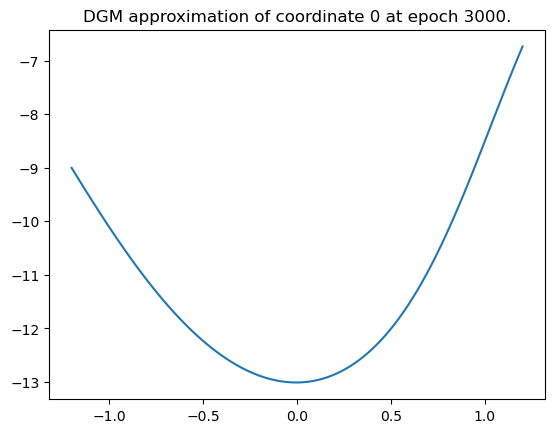

Epoch 3000 with loss 34.31830596923828


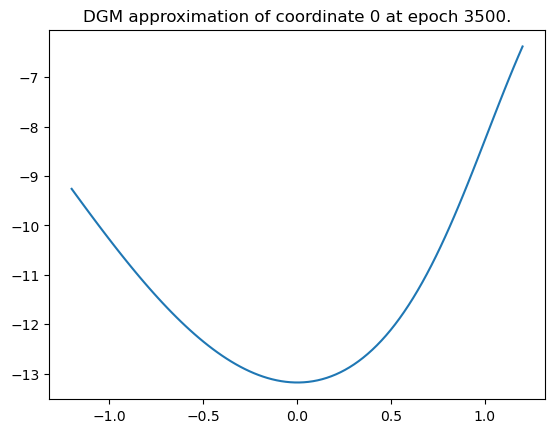

Epoch 3500 with loss 35.452152252197266


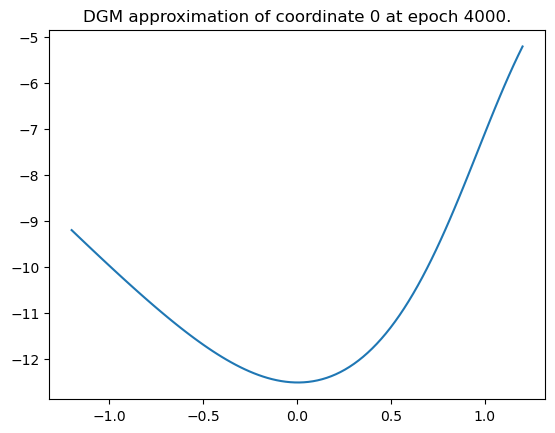

Epoch 4000 with loss 32.79768753051758


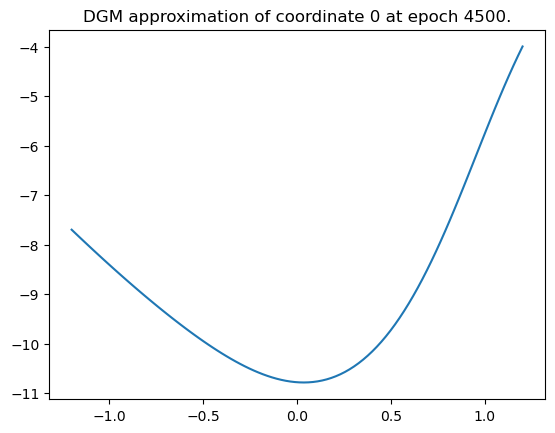

Epoch 4500 with loss 32.9638557434082


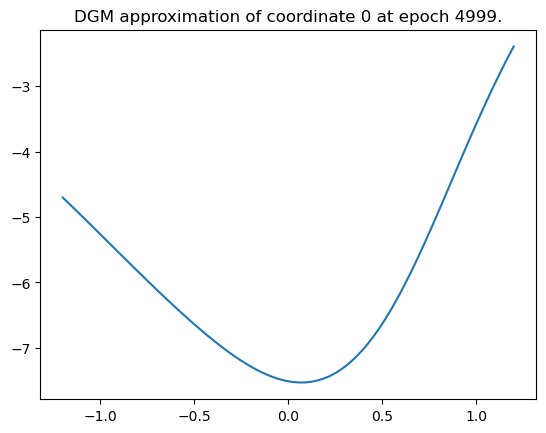

Epoch 4999 with loss 31.121328353881836
Training of neural network with 5000 epochs take 784.1004438400269 seconds.


Time taken: 784 seconds; L1 error: 7.00E+00; L2 error: 5.07E+01; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


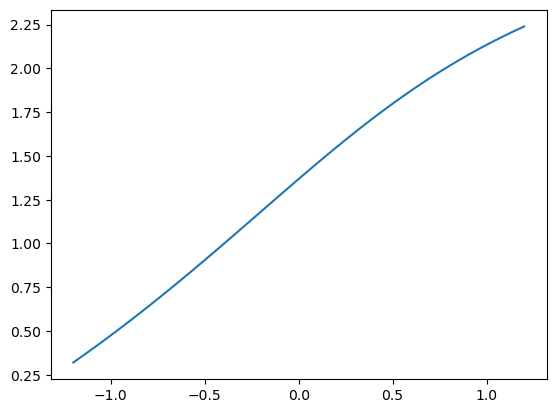

Epoch 0 with loss 1.5395841598510742


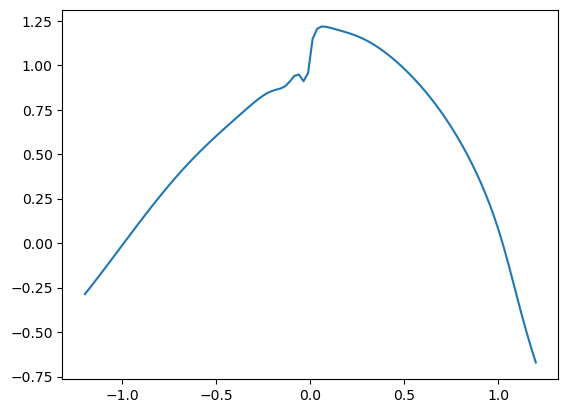

Epoch 500 with loss 0.009982239454984665


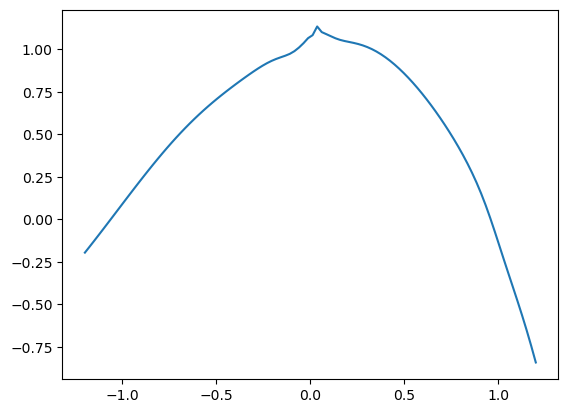

Epoch 1000 with loss 0.006348996888846159


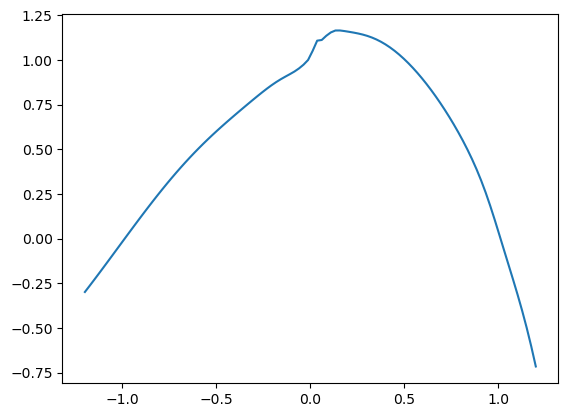

Epoch 1500 with loss 0.0067781670950353146


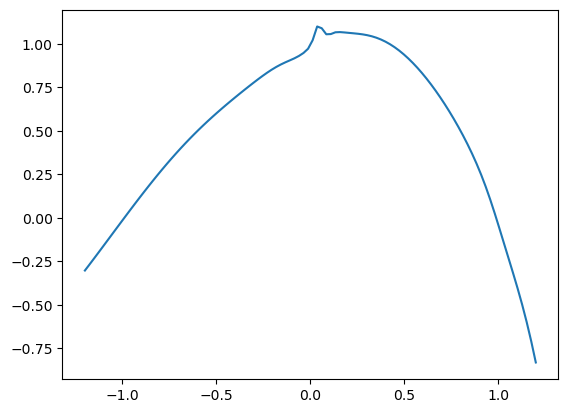

Epoch 2000 with loss 0.0015599464531987906


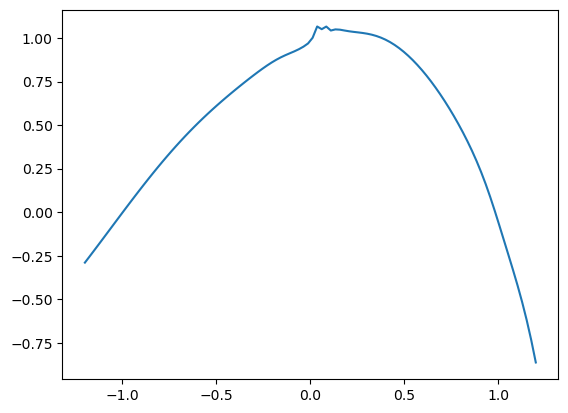

Epoch 2500 with loss 0.0009647917468100786


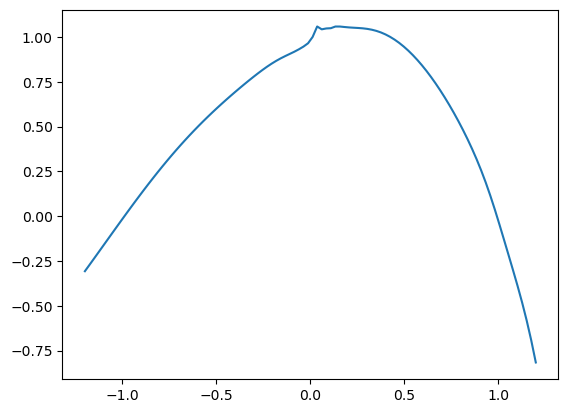

Epoch 3000 with loss 0.0010541635565459728


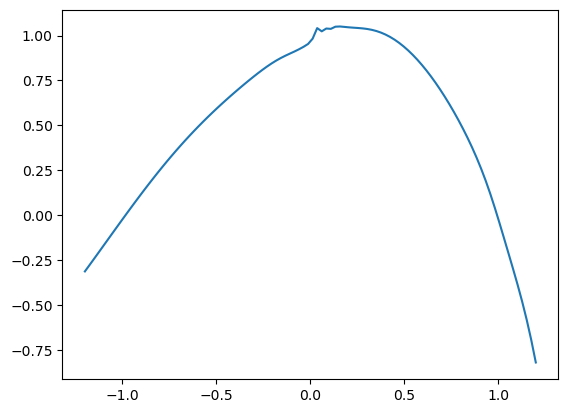

Epoch 3500 with loss 0.0015664668753743172


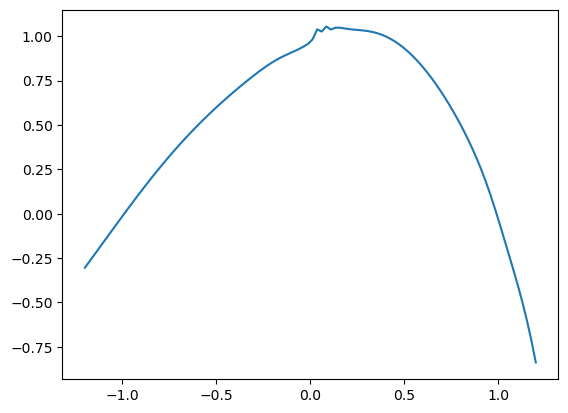

Epoch 4000 with loss 0.0008596958359703422


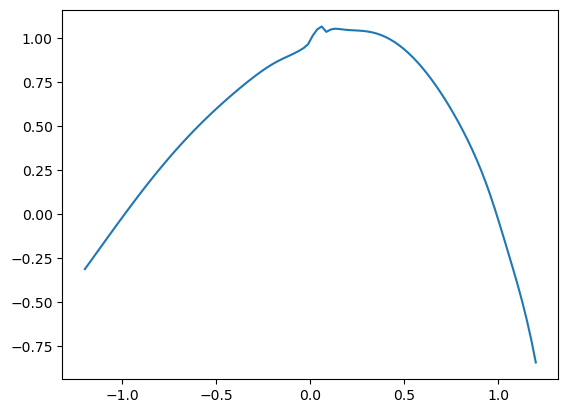

Epoch 4500 with loss 0.0007955888286232948


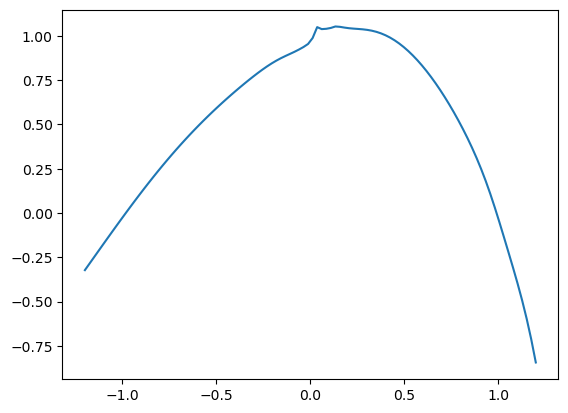

Epoch 4999 with loss 0.0021445127204060555
Training of neural network with 5000 epochs take 231.51515746116638 seconds.
Time taken: 232 seconds; L1 error: 4.12E-02; L2 error: 2.99E-03; rel error: INF.




######## Summary for deep branching method
runtime:        355
fdb runtime:    192
total runtime:  546
mean L1 error:  2.45E-02
std L1 error:   0.00E+00
mean L2 error:  9.19E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        784
mean L1 error:  7.00E+00
std L1 error:   0.00E+00
mean L2 error:  5.07E+01
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        232
mean L1 error:  4.12E-02
std L1 error:   0.00E+00
mean L2 error:  2.99E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


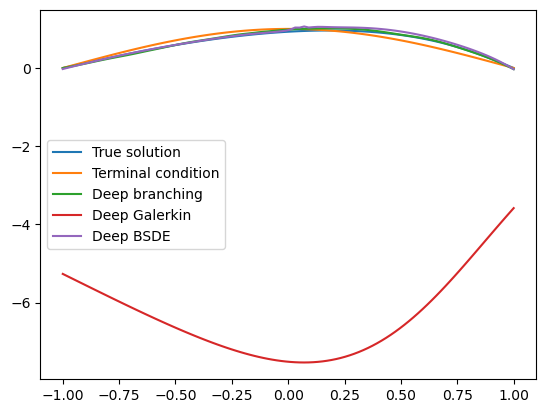

In [19]:
dim = 9
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True,  
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 10

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 899.802001953125 seconds.
Patch  0: epoch    0 with loss 9.16E-01


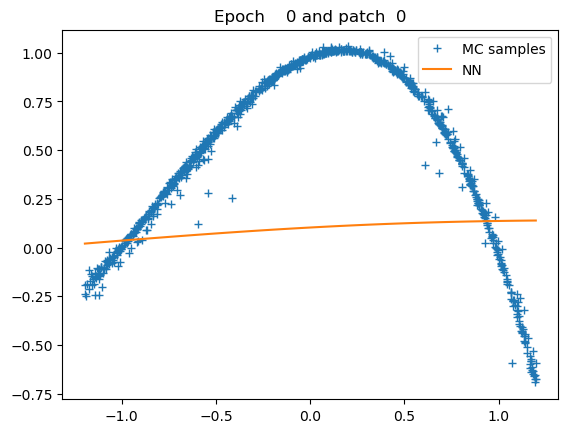

Patch  0: epoch  500 with loss 1.18E-03


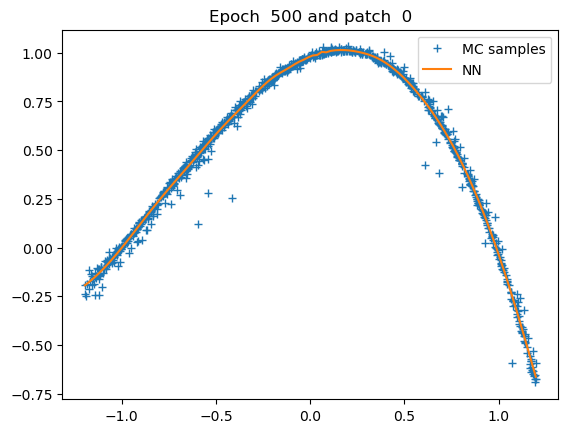

Patch  0: epoch 1000 with loss 1.18E-03


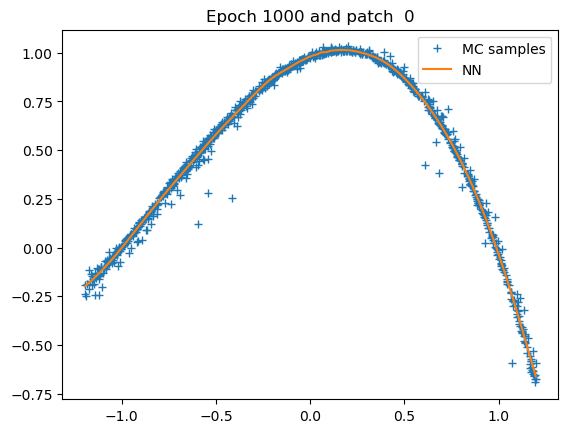

Patch  0: epoch 1500 with loss 1.18E-03


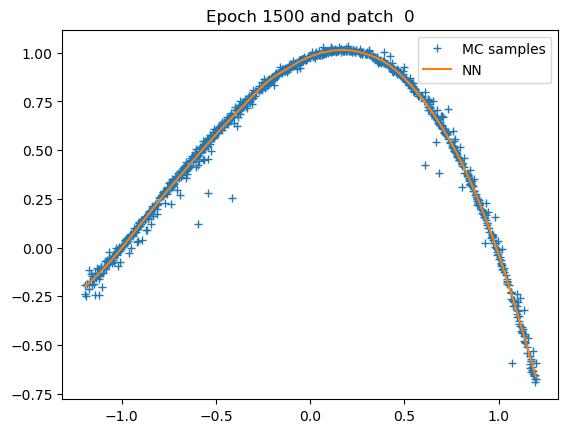

Patch  0: epoch 2000 with loss 1.18E-03


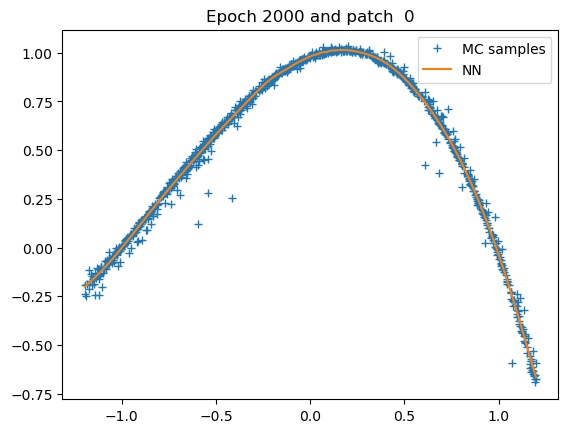

Patch  0: epoch 2500 with loss 1.18E-03


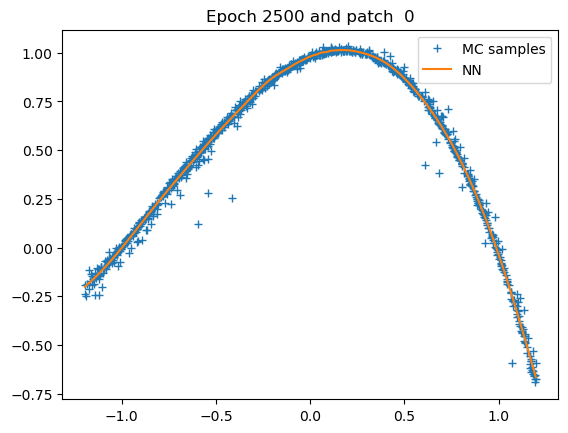

Patch  0: epoch 3000 with loss 1.18E-03


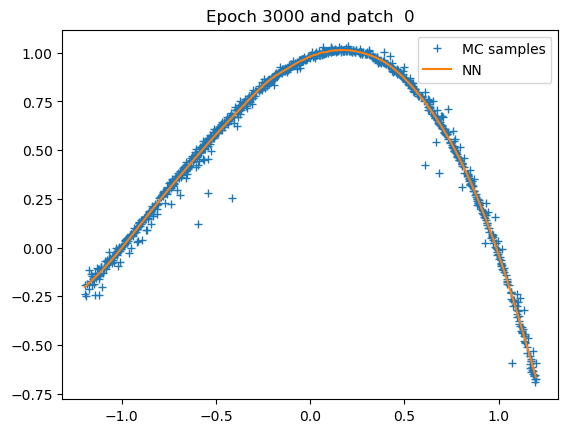

Patch  0: epoch 3500 with loss 1.18E-03


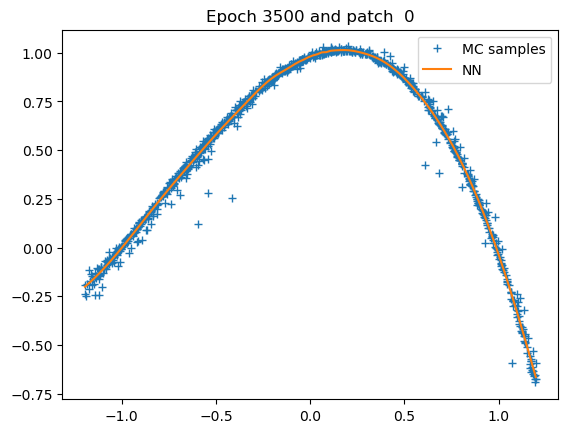

Patch  0: epoch 4000 with loss 1.18E-03


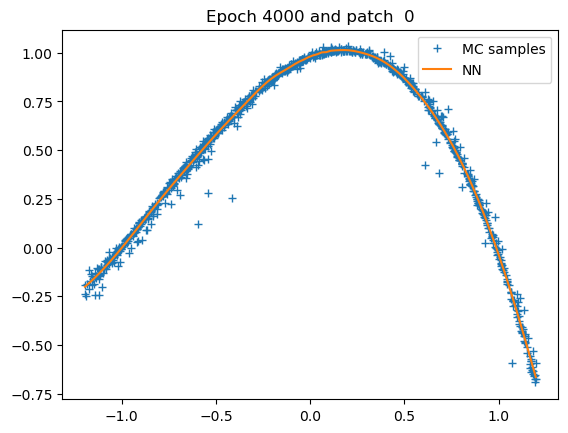

Patch  0: epoch 4500 with loss 1.18E-03


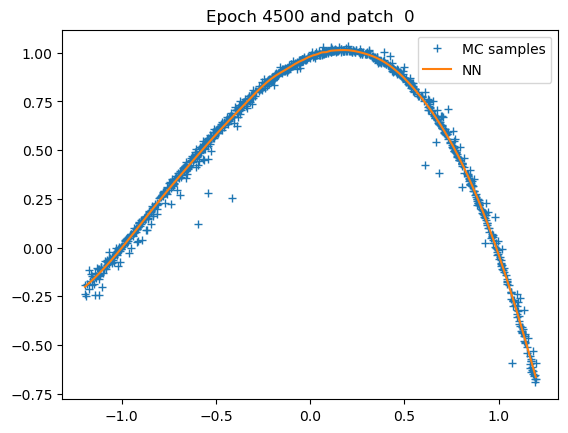

Patch  0: epoch 4999 with loss 1.18E-03


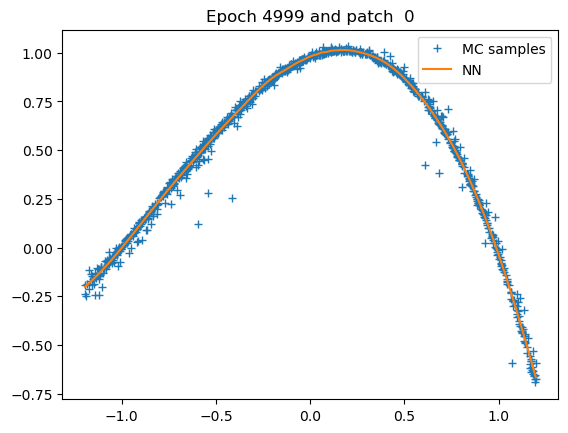

Patch 0: training of u with 5000 epochs take 37.68971920013428 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 480 seconds; L1 error: 2.40E-02; L2 error: 9.22E-04; rel error: INF.
fdb runtime: 460 seconds; total runtime: 940 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


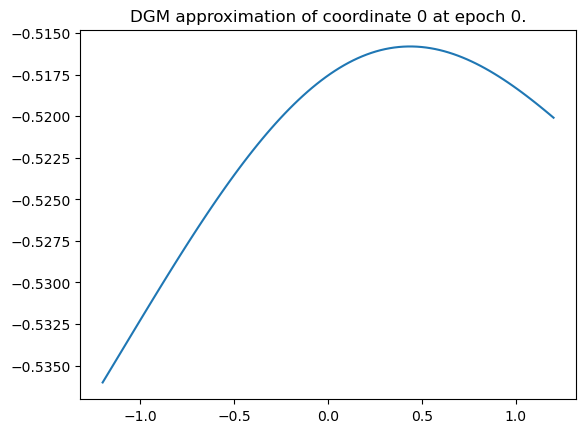

Epoch 0 with loss 56.96702575683594


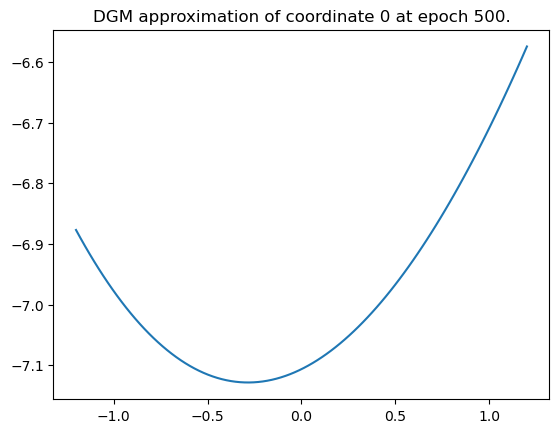

Epoch 500 with loss 49.69878387451172


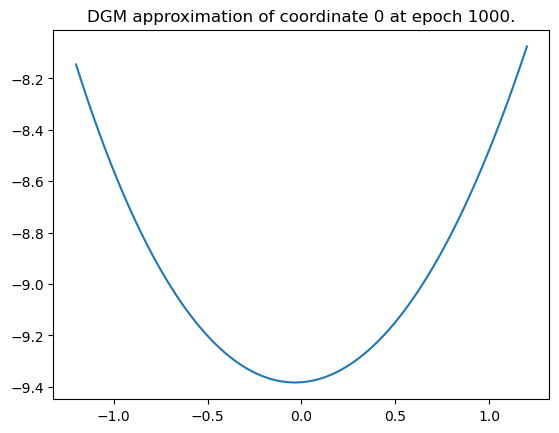

Epoch 1000 with loss 44.876625061035156


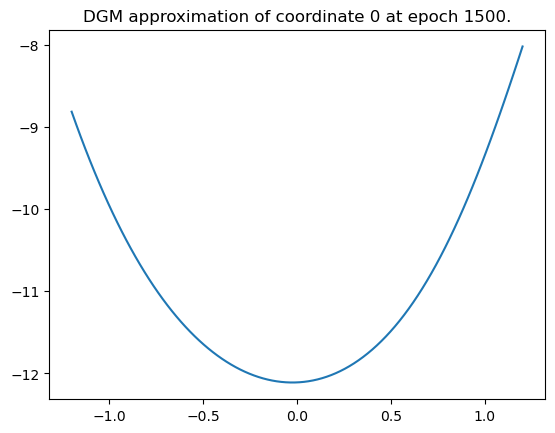

Epoch 1500 with loss 44.95081329345703


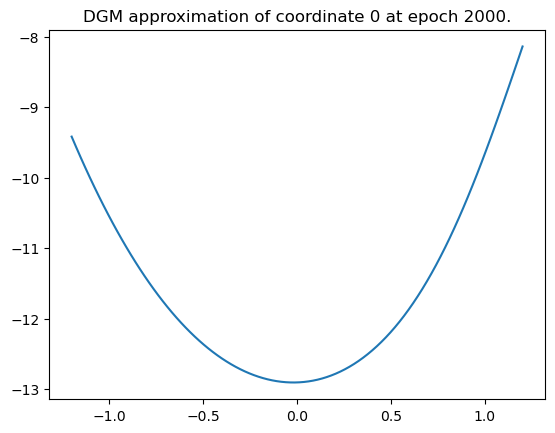

Epoch 2000 with loss 44.85688781738281


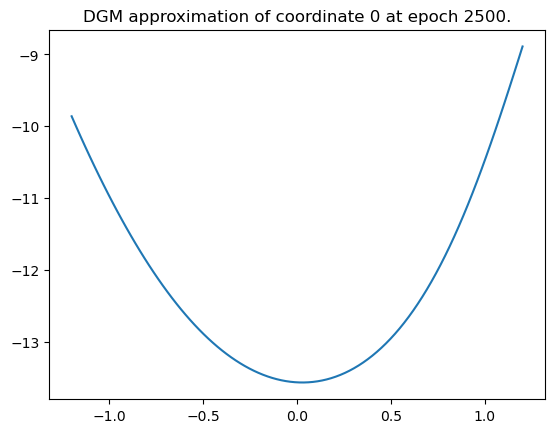

Epoch 2500 with loss 45.754310607910156


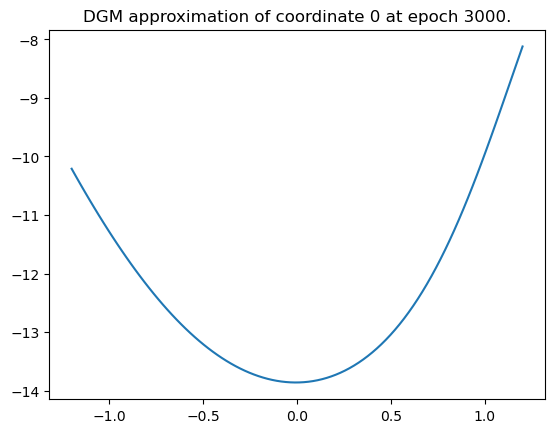

Epoch 3000 with loss 47.44607162475586


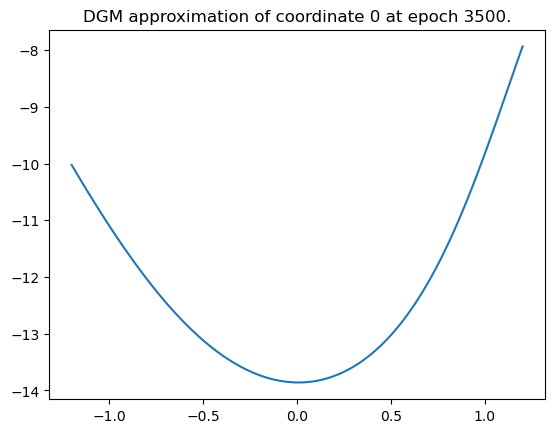

Epoch 3500 with loss 43.51416015625


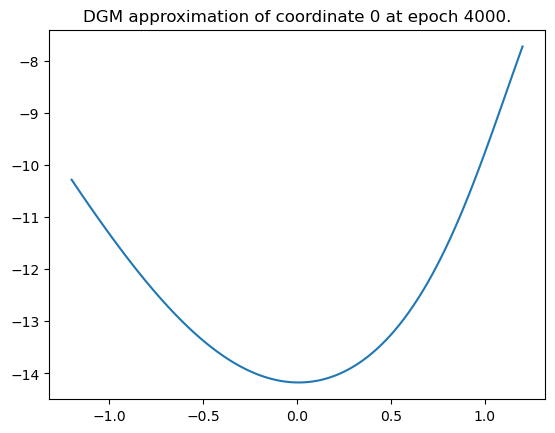

Epoch 4000 with loss 44.57902145385742


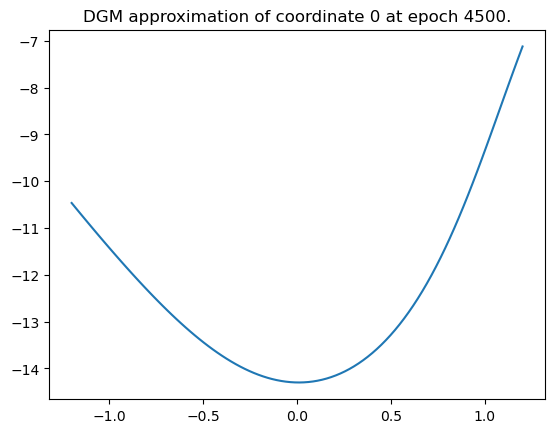

Epoch 4500 with loss 44.8749885559082


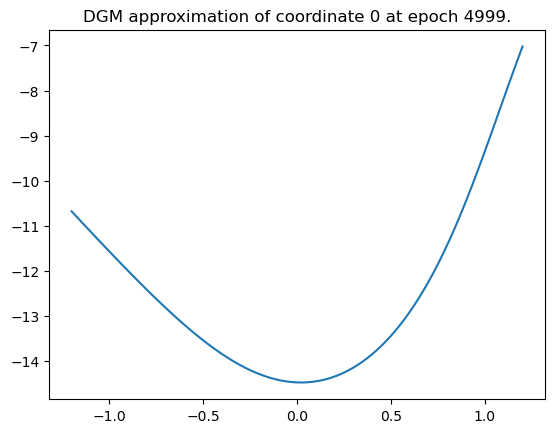

Epoch 4999 with loss 44.00403594970703
Training of neural network with 5000 epochs take 870.7933692932129 seconds.


Time taken: 871 seconds; L1 error: 1.37E+01; L2 error: 1.91E+02; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


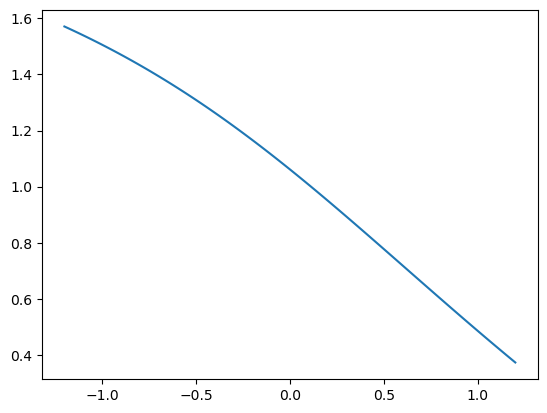

Epoch 0 with loss 1.8161358833312988


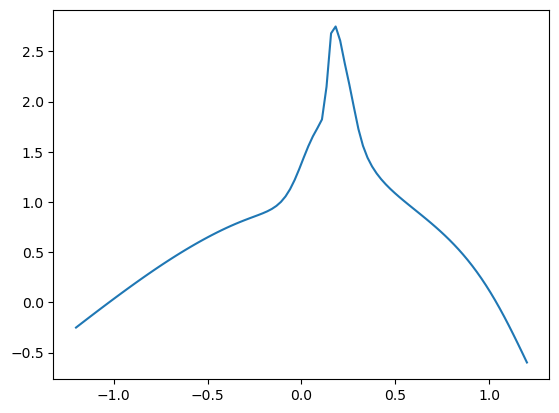

Epoch 500 with loss 0.0042198896408081055


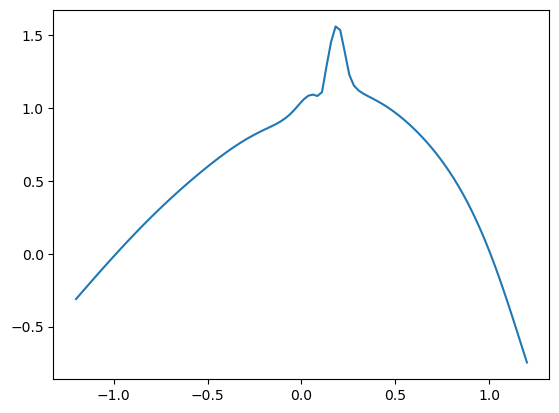

Epoch 1000 with loss 0.000999340321868658


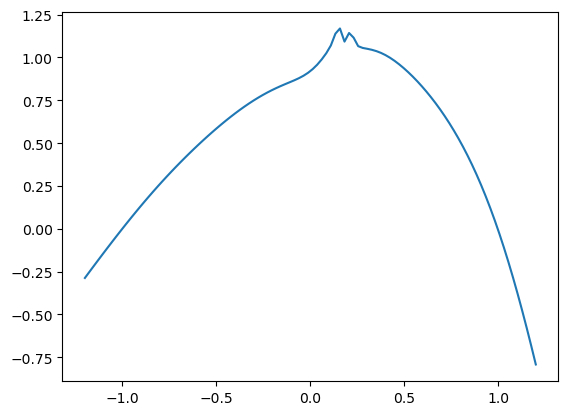

Epoch 1500 with loss 0.0017621793085709214


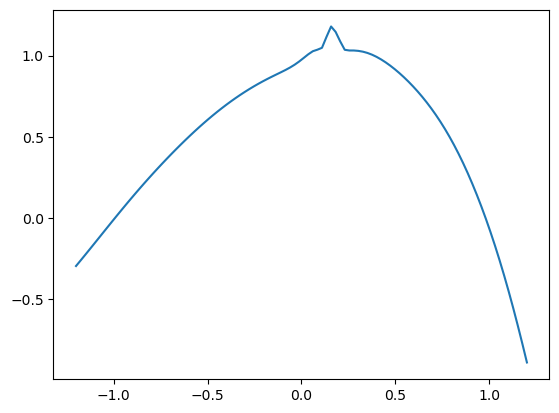

Epoch 2000 with loss 0.001306359190493822


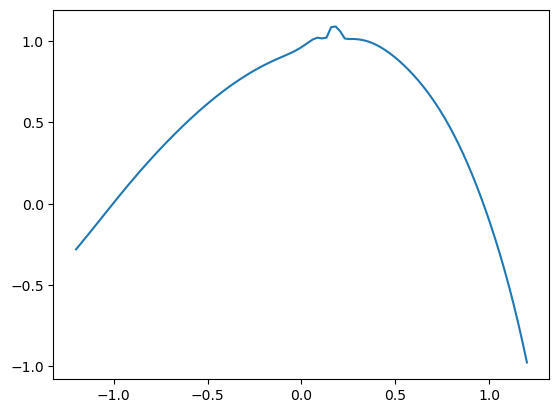

Epoch 2500 with loss 0.00092205626424402


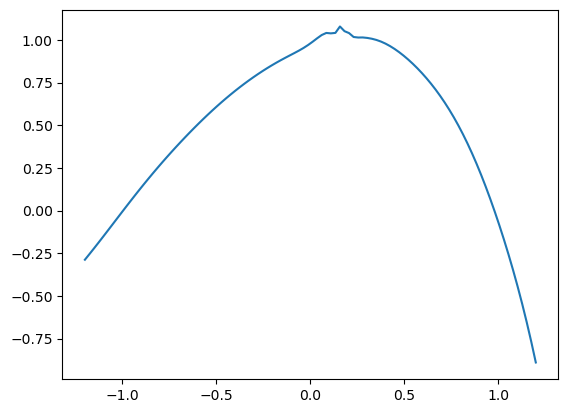

Epoch 3000 with loss 0.0010576114291325212


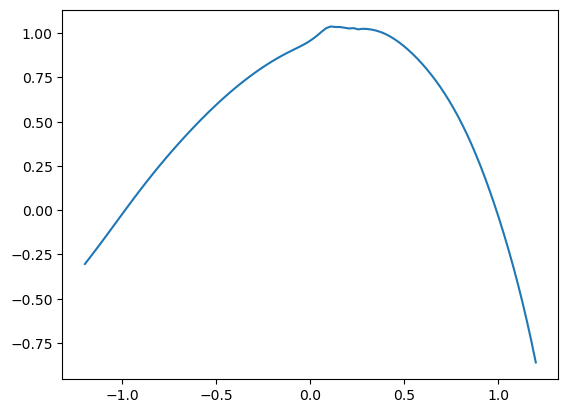

Epoch 3500 with loss 0.0006993558490648866


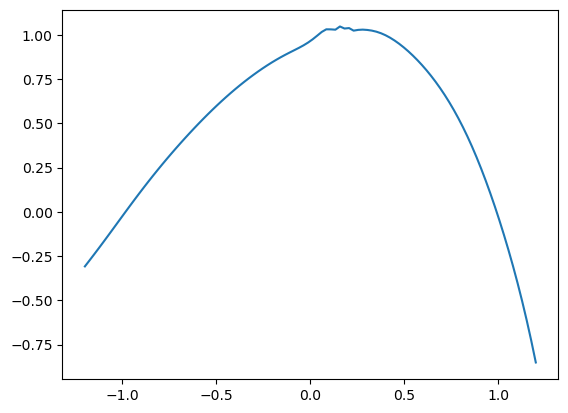

Epoch 4000 with loss 0.002256117295473814


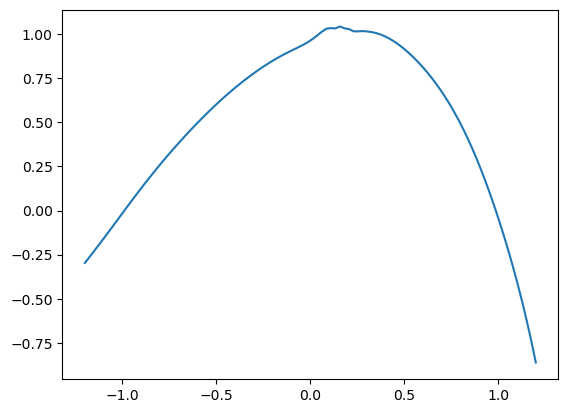

Epoch 4500 with loss 0.0008652451215311885


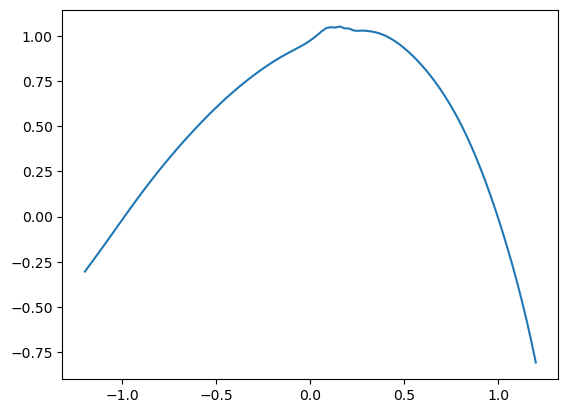

Epoch 4999 with loss 0.0006576978485099971
Training of neural network with 5000 epochs take 231.6299705505371 seconds.
Time taken: 232 seconds; L1 error: 4.50E-02; L2 error: 3.04E-03; rel error: INF.




######## Summary for deep branching method
runtime:        480
fdb runtime:    460
total runtime:  940
mean L1 error:  2.40E-02
std L1 error:   0.00E+00
mean L2 error:  9.22E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        871
mean L1 error:  1.37E+01
std L1 error:   0.00E+00
mean L2 error:  1.91E+02
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        232
mean L1 error:  4.50E-02
std L1 error:   0.00E+00
mean L2 error:  3.04E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


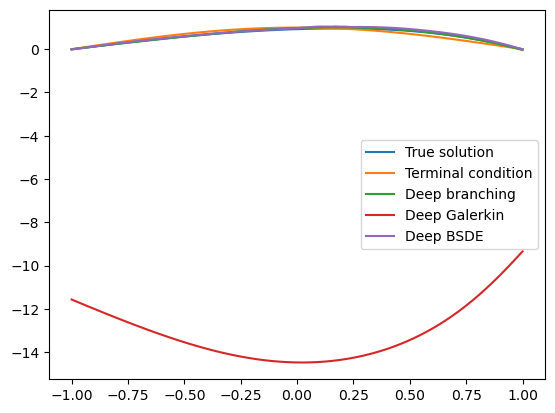

In [20]:
dim = 10
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)